In [1]:
import os

import matplotlib

import numpy as np
import pandas as pd
import h5py as h5
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import svm
from sklearn.model_selection import train_test_split

sns.set(style="darkgrid")
sns.set_context('talk')
%matplotlib inline

import ssm
from ssm.variational import SLDSMeanFieldVariationalPosterior, SLDSTriDiagVariationalPosterior
from ssm.util import random_rotation

/home/joeldapello/anaconda3/envs/am207/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

In [3]:
get_data = lambda path : h5.File(path, 'r')['obj_arr'].value.astype('float32')[:,0]
flatten = lambda x : x.reshape(x.shape[0], -1)

def format_data(DIR):
    files = [os.path.join(DIR,file) for file in os.listdir(DIR)]
    feature_files = [file for file in files if 'features' in file]
    feature_names = [feature_file.split('/')[-1].split('(')[0] for feature_file in feature_files]
    feature_data = [flatten(get_data(feature_file)) for feature_file in feature_files]

    obss_file = [file for file in files if 'obss' in file][0]
    obss_data = flatten(get_data(obss_file))

    annotation_file = [file for file in files if 'annotations' in file][0]
    annotation_data = pd.read_csv(annotation_file)
    
    feature_names, feature_data = please_behave(feature_names, feature_data)
    
    return feature_names, feature_data, obss_data, annotation_data

def please_behave(feature_names, feature_data):
    feature_nums = np.array([int(feature_name.split('_')[1]) for feature_name in feature_names])
    inds = feature_nums.argsort()
    feature_names = [feature_names[i] for i in inds]
    feature_data = [feature_data[i] for i in inds]
    return feature_names, feature_data

def get_annotations(annotation_data, i, j, key):
    x = np.arange(i)
    y = annotation_data[key].values.astype(int)*(j)
    xy = np.array([[x,y] for (x,y) in zip(x,y) if y!=0])
    return xy[:,0], xy[:,1]

## okkkk, lets get more data?

In [4]:
# compile all data!
root = 'feature_dir/DoorKey/'
DIRS = [os.path.join(root,DIR) for DIR in os.listdir(root)]

for i, DIR in enumerate(DIRS):
    if i == 0:
        feature_names, feature_data, obss_data, annotation_data = format_data(DIR)
        annotation_data['DIR'] = DIR
        annotation_data['trial'] = i
    else:
        feature_names_i, feature_data_i, obss_data_i, annotation_data_i = format_data(DIR)
        annotation_data_i['DIR'] = DIR
        annotation_data_i['trial'] = i
        assert(np.all([f==i for (f,i) in zip (feature_names,feature_names_i)]))
        for j in range(len(feature_data)):
            feature_data[j] = np.concatenate([feature_data[j],feature_data_i[j]])
        obss_data = np.concatenate([obss_data, obss_data_i])
        annotation_data = annotation_data.append(annotation_data_i)

# for convenience we'll just call the inputs a feature
feature_data.append(obss_data)
feature_names.append('obss_-1')

# compute goal state
annotation_data['goal'] = (annotation_data['has_key'].astype(int) + (annotation_data['door_locked']==False).astype(int)).values

In [6]:
lstm = feature_data[7]
lstm.shape

(4960, 64)

Initializing with an ARHMM using 50 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


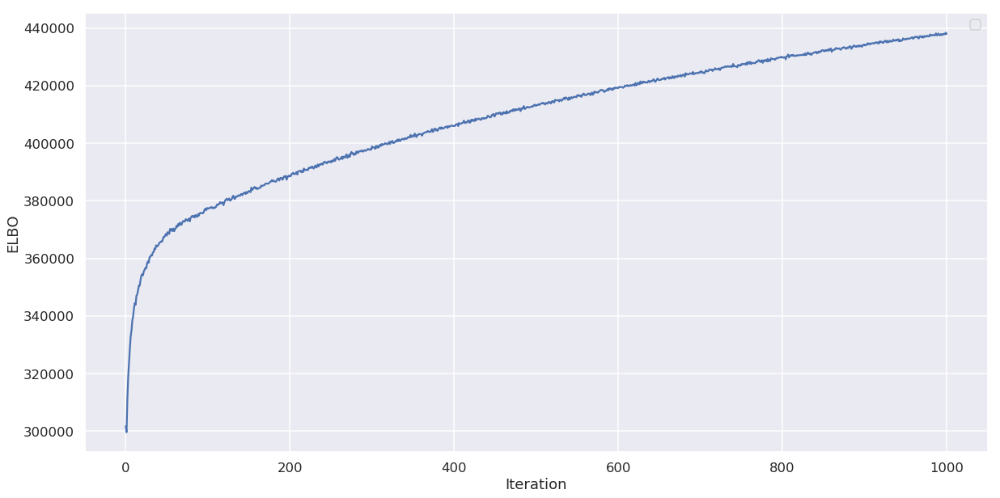

In [7]:
# model parameters
T = lstm.shape[0]
K = 8
D_obs = lstm.shape[-1]
D_latent = 10

# Fit a robust rSLDS with its default initialization
rslds = ssm.SLDS(D_obs, K, D_latent,
             transitions="recurrent",
#              dynamics="gaussian",
#              emissions="gaussian",
             single_subspace=True)

rslds.initialize(lstm,num_em_iters=50)

# Uncomment this to fit with stochastic variational inference instead
q_svi = SLDSTriDiagVariationalPosterior(rslds, lstm)
elbos = rslds.fit(q_svi, lstm, method="svi", num_iters=1000, initialize=False)
xhat = q_svi.mean[0]
zhat = rslds.most_likely_states(xhat, lstm)

# Plot some results
plt.figure()
plt.plot(elbos)
plt.legend()
plt.xlabel("Iteration")
plt.ylabel("ELBO")
plt.show()

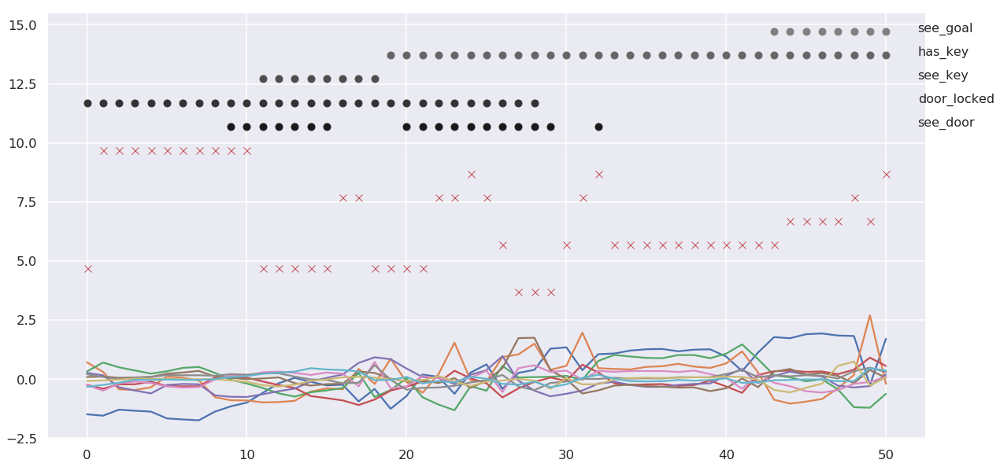

In [8]:
# and estimated state
plt.plot(xhat[:51])
z_plot = zhat[:51] + np.max(xhat[:51])
plt.plot(z_plot, linestyle='none', marker='x', c='r')
for j, key in enumerate(annotation_data.keys()):
    if ('Unnamed' in key) or ('DIR' in key):
        pass
    else:
        k = (j+0)
        if k < 7:
            x,y = get_annotations(annotation_data, 51, k, key)
            y = y.astype('float')
            y += np.max(z_plot).astype('float')
            plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
            plt.text(51+1, y[0], key, fontsize=16)

plt.show()

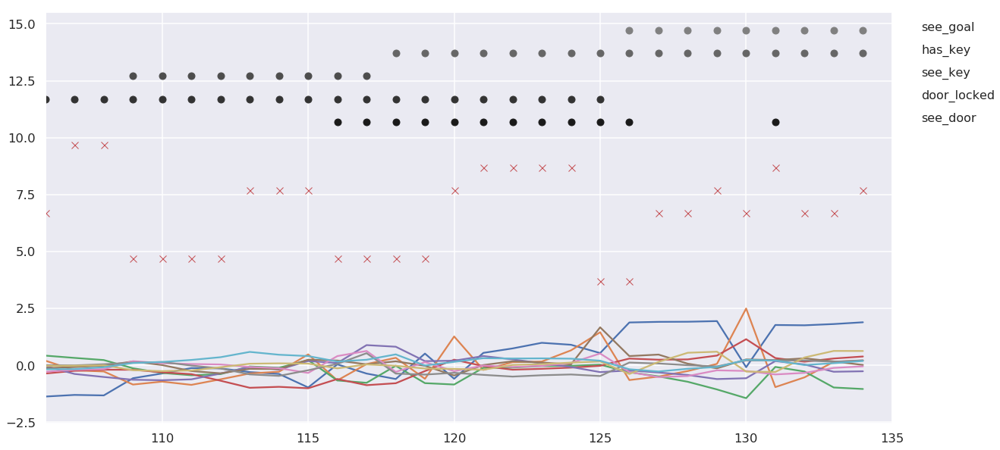

In [24]:
# and estimated state
start = 106
end = 135
plt.plot(xhat[:end])
z_plot = zhat[:end] + np.max(xhat[:end])
plt.plot(z_plot, linestyle='none', marker='x', c='r')
for j, key in enumerate(annotation_data.keys()):
    if ('Unnamed' in key) or ('DIR' in key):
        pass
    else:
        k = (j+0)
        if k < 7:
            x,y = get_annotations(annotation_data, end, k, key)
            y = y.astype('float')
            y += np.max(z_plot).astype('float')
            plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
            plt.text((end)+1, y[0], key, fontsize=16)
plt.xlim([start,end])
plt.show()

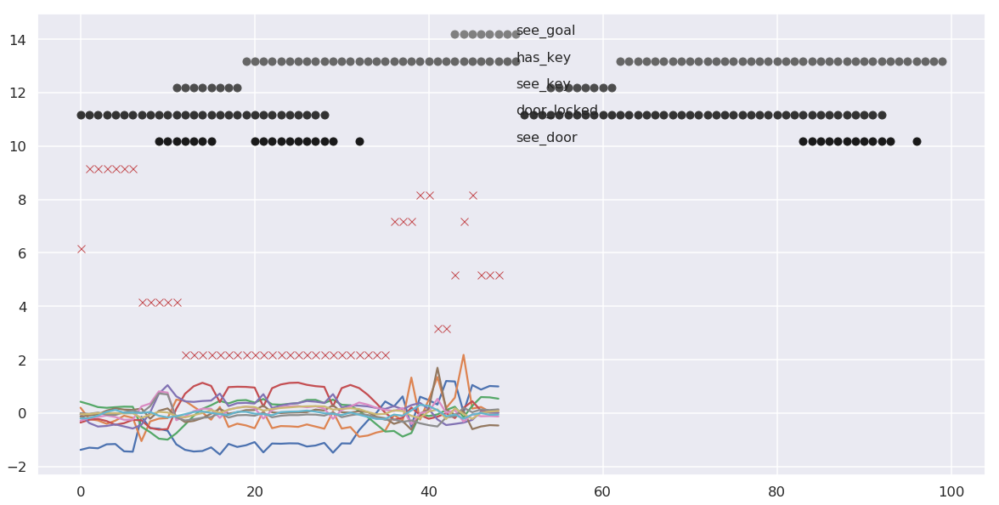

In [14]:
# and estimated state
start = 51
end = 100
plt.plot(xhat[start:end])
z_plot = zhat[start:end] + np.max(xhat[start:end])
plt.plot(z_plot, linestyle='none', marker='x', c='r')
for j, key in enumerate(annotation_data.keys()):
    if ('Unnamed' in key) or ('DIR' in key):
        pass
    else:
        k = (j+0)
        if k < 7:
            x,y = get_annotations(annotation_data, end, k, key)
            y = y.astype('float')
            y += np.max(z_plot).astype('float')
            plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
            plt.text((end-start)+1, y[0], key, fontsize=16)

plt.show()

In [97]:
actor = feature_data[10][:51]

In [98]:
actor.shape

(51, 7)

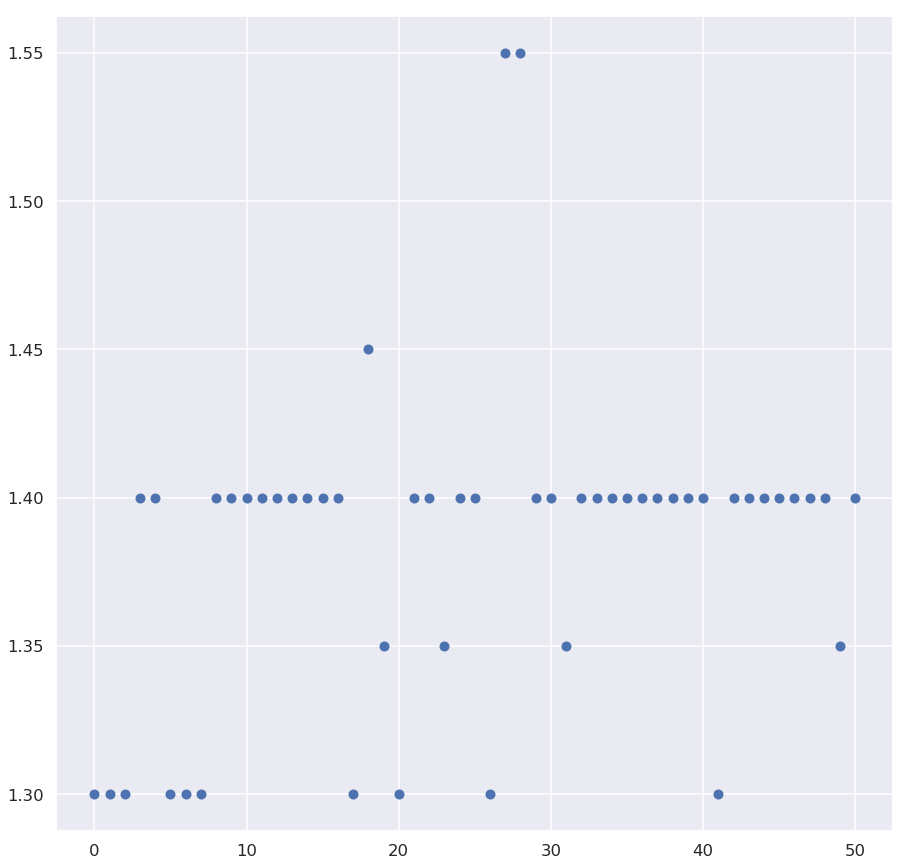

In [104]:
actor = feature_data[10][:51]
actor_s = softmax(actor, axis=1)
actor_oh = np.argmax(actor_s, axis=1)
actor_oh = actor_oh/20
actor_oh += 1.3

fig, ax = plt.subplots(figsize=[15,15])
plt.plot(actor_oh, linestyle='none',marker='o')

plt.show()

In [9]:
yhat = rslds.smooth(xhat, lstm)

In [10]:
from sklearn.metrics import r2_score

In [11]:
coefficient_of_dermination = r2_score(yhat, lstm)

In [12]:
coefficient_of_dermination

0.842884085034111

In [ ]:
actor = feature_data[10]
actor_s = softmax(actor, axis=1)
actor_oh = np.argmax(actor_s, axis=1)
actor_oh = actor_oh/20
actor_oh += 1.3

fig, ax = plt.subplots(figsize=[15,15])
plt.plot(actor_oh, linestyle='none',marker='o')
for j, key in enumerate(annotation_data.keys()):
    if 'Unnamed' in key:
        pass
    else:
        m = 20
        k = (j+m)/m
        x,y = get_annotations(annotation_data, i, k, key)
        plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
        plt.text(len(feature_data[i])+1, k, key)
plt.title(feature_names[i])
plt.show()

In [71]:
for K in [3,4,5,6,7,8,9,10]:
    for D_latent in [1,3,5,7,10,15,25]:
        # model parameters
        T = lstm.shape[0]
#         K = 10
        D_obs = lstm.shape[-1]
#         D_latent = 10

        # Fit a robust rSLDS with its default initialization
        rslds = ssm.SLDS(D_obs, K, D_latent,
                     transitions="recurrent",
                     dynamics="gaussian",
                     emissions="gaussian",
                     single_subspace=True)

        rslds.initialize(lstm)

        # Uncomment this to fit with stochastic variational inference instead
        q_svi = SLDSTriDiagVariationalPosterior(rslds, lstm)
        elbos = rslds.fit(q_svi, lstm, method="svi", num_iters=1000, initialize=False)
        xhat = q_svi.mean[0]
        zhat = rslds.most_likely_states(xhat, lstm)

        print('K: {}, D: {}'.format(K,D_latent))
        
        # Plot some results
        plt.figure()
        plt.plot(elbos)
        plt.legend()
        plt.xlabel("Iteration")
        plt.ylabel("ELBO")
        plt.show()

        
        # and estimated trajectories
        plt.plot(xhat[:100])
        for j, key in enumerate(annotation_data.keys()):
            if ('Unnamed' in key) or ('DIR' in key):
                pass
            else:
                k = (j+3)
                x,y = get_annotations(annotation_data, 100, k, key)
                plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
                plt.text(100+1, k, key)

        plt.show()

        # and estimated state
        plt.plot(zhat[:100])
        for j, key in enumerate(annotation_data.keys()):
            if ('Unnamed' in key) or ('DIR' in key):
                pass
            else:
                k = (j+3)
                x,y = get_annotations(annotation_data, 100, k, key)
                plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
                plt.text(100+1, k, key)

        plt.show()

Initializing with an ARHMM using 25 steps of EM.


KeyboardInterrupt: 

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 8, D: 2


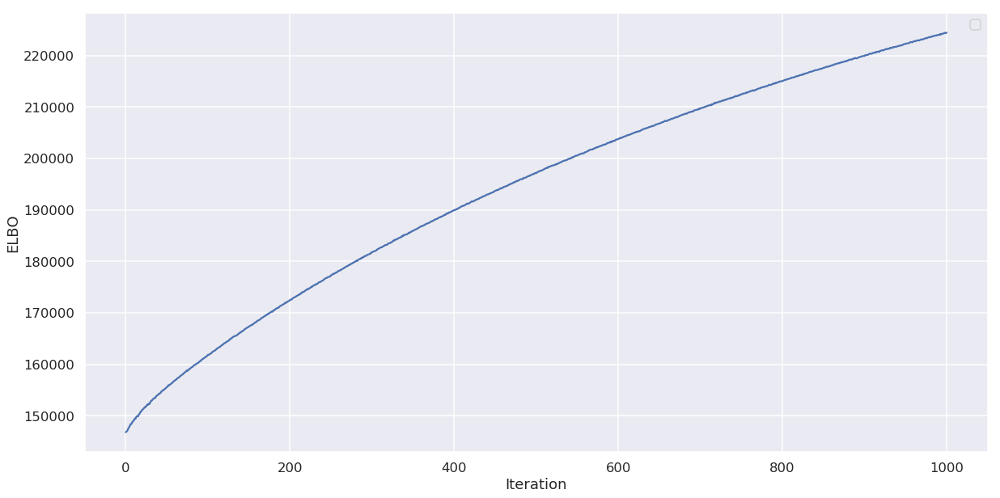

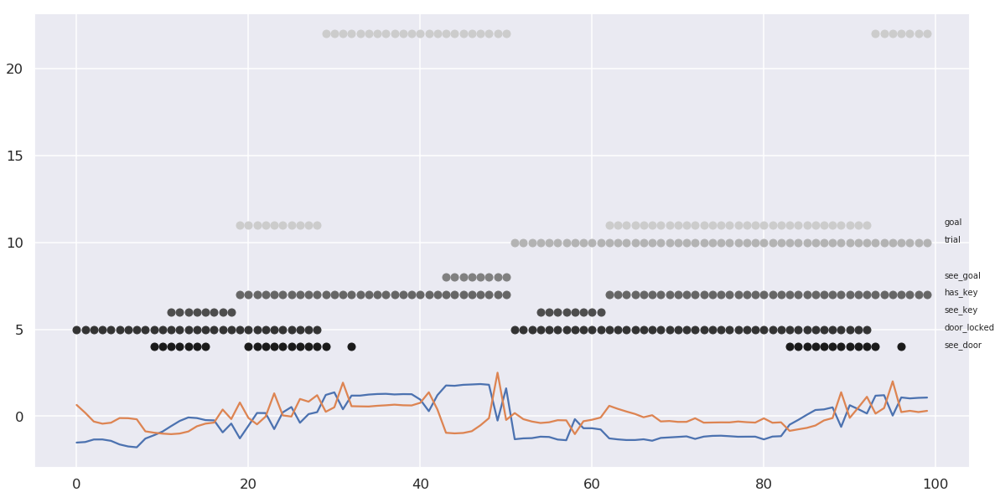

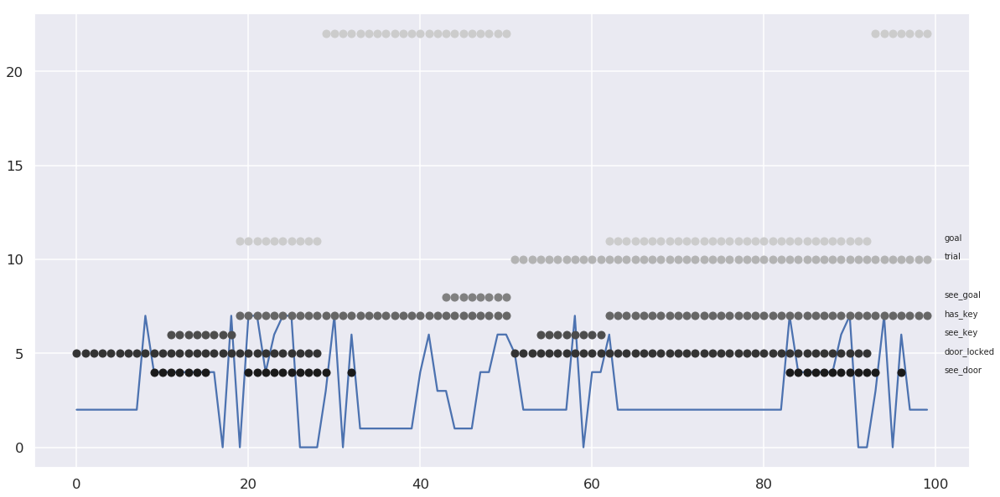

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 8, D: 5


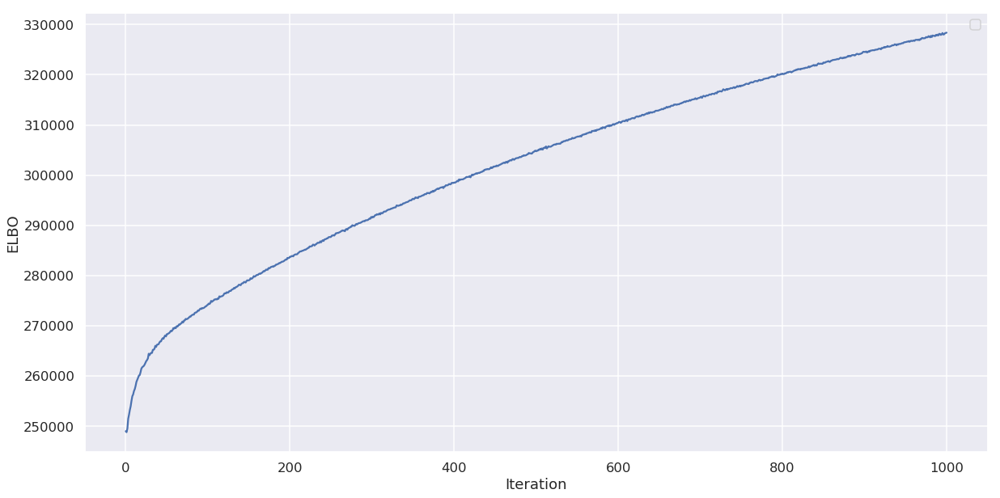

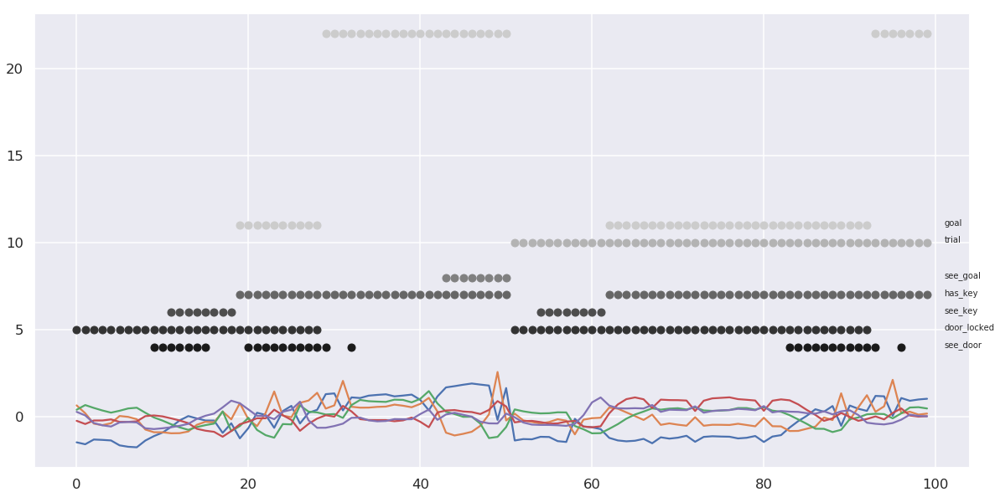

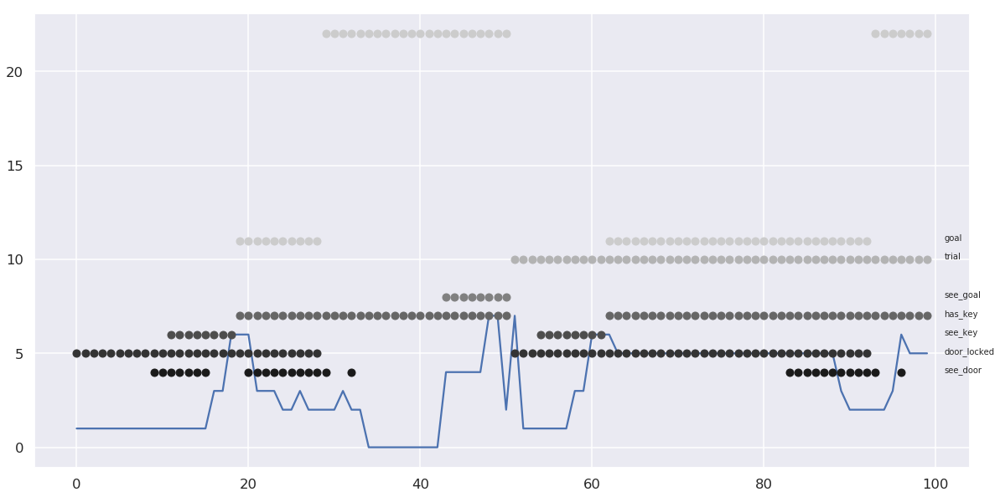

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 8, D: 10


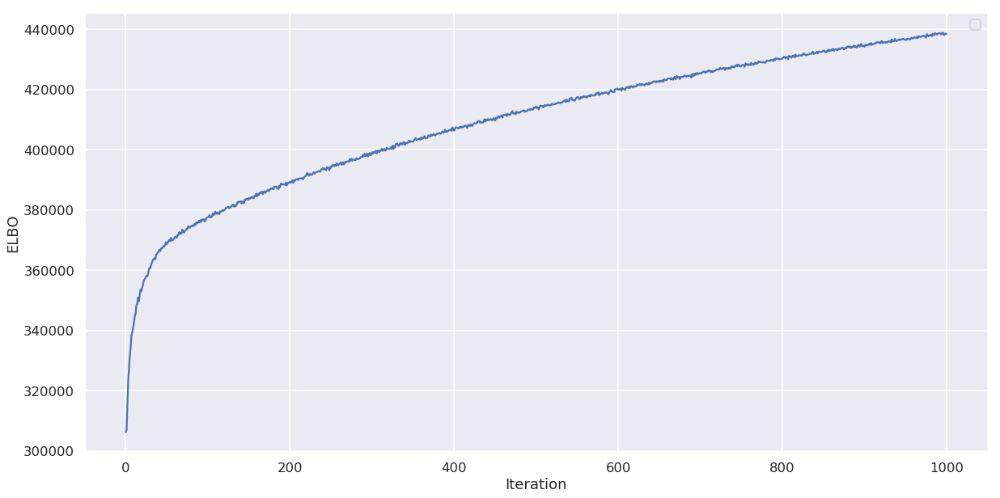

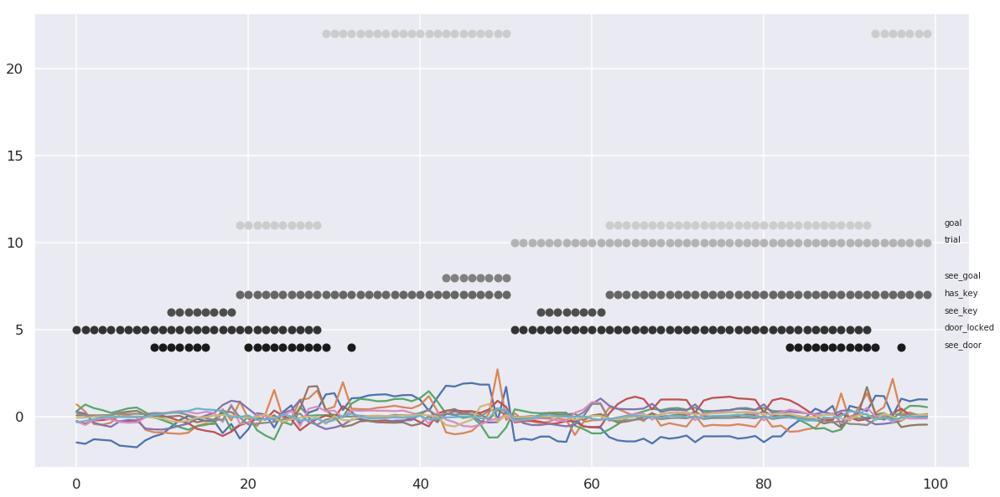

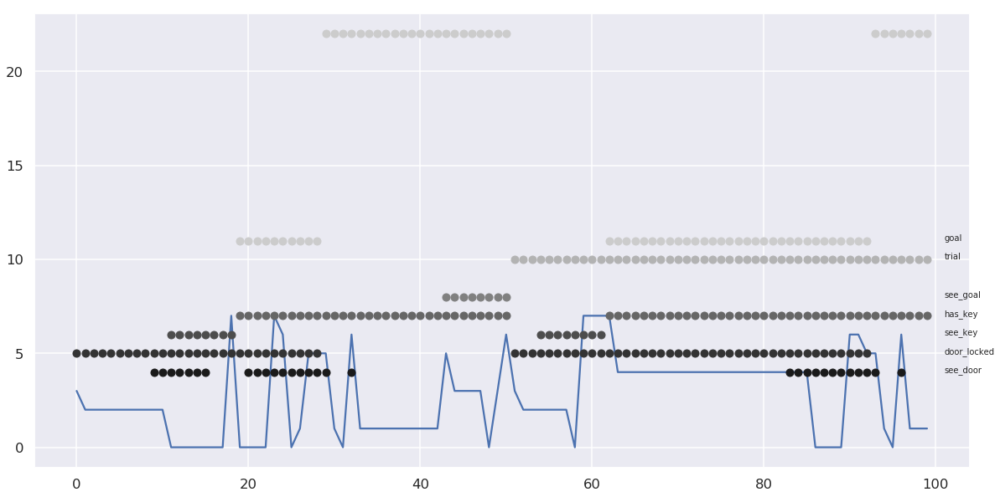

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 8, D: 15


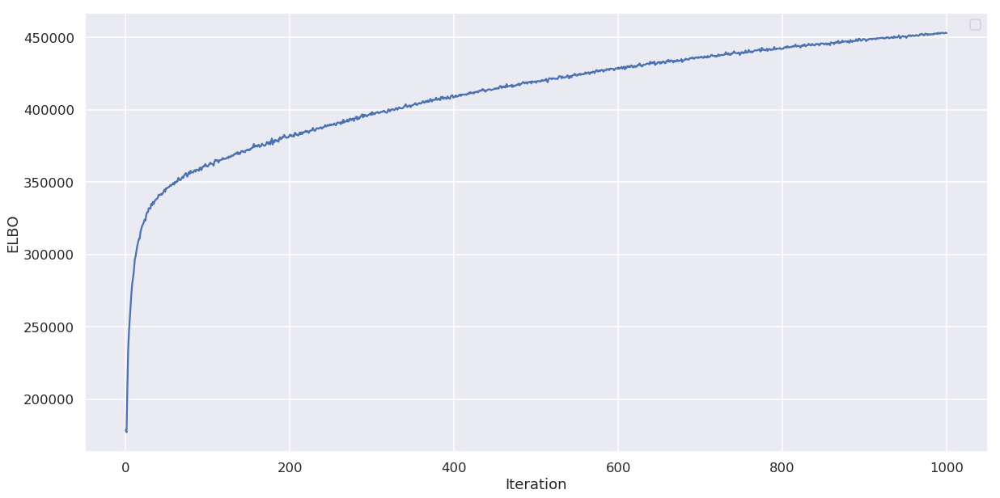

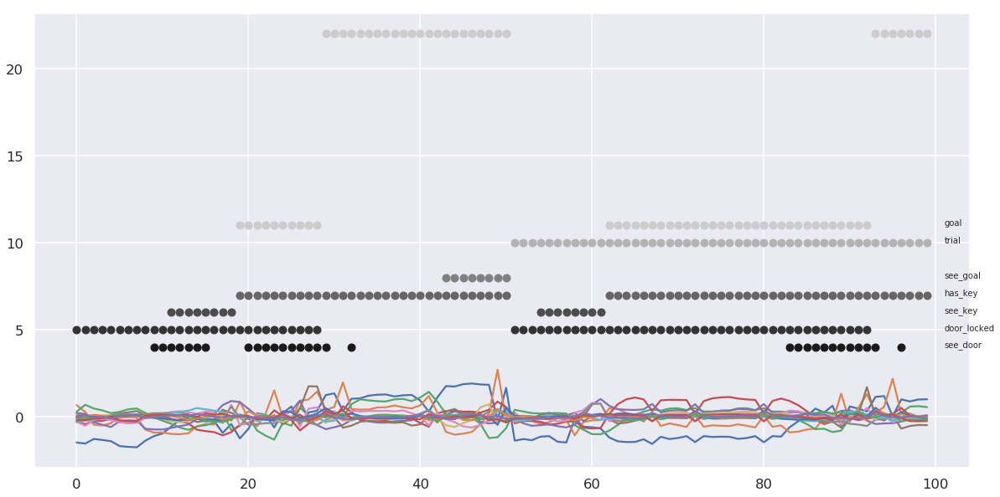

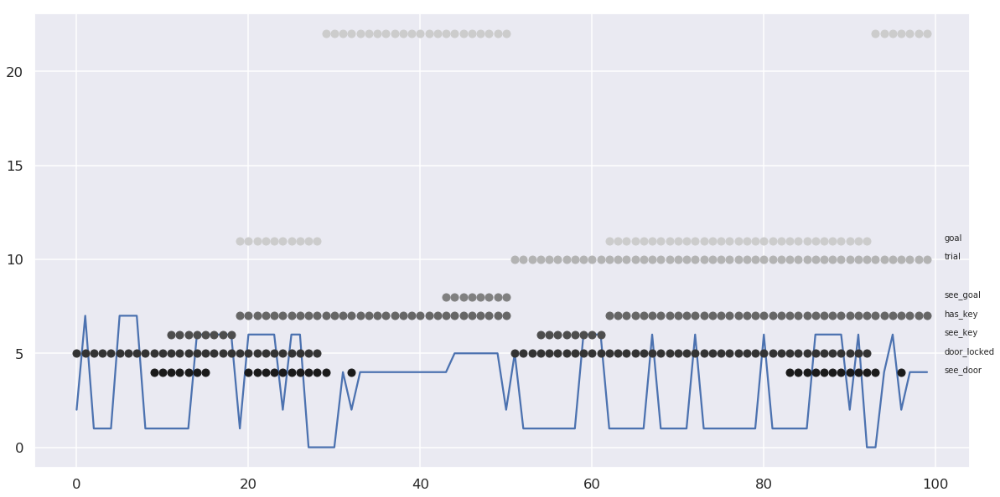

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 15, D: 2


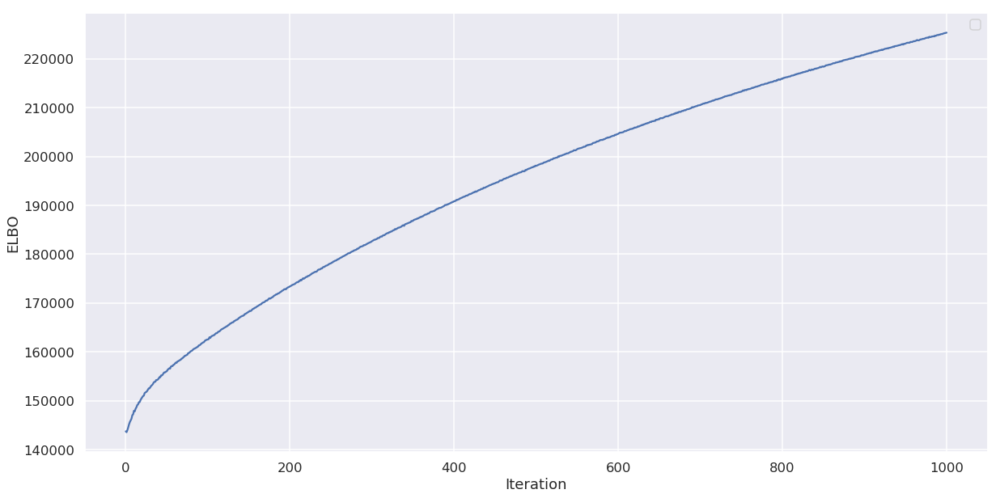

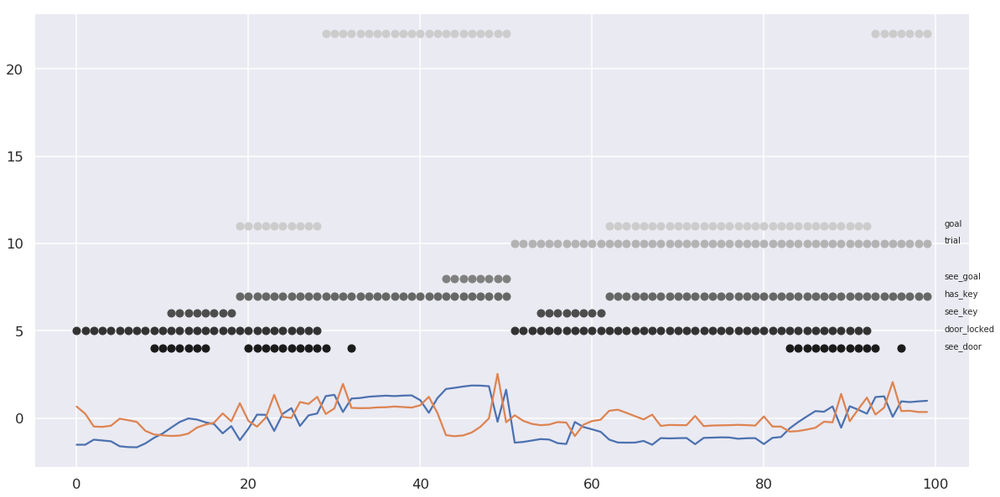

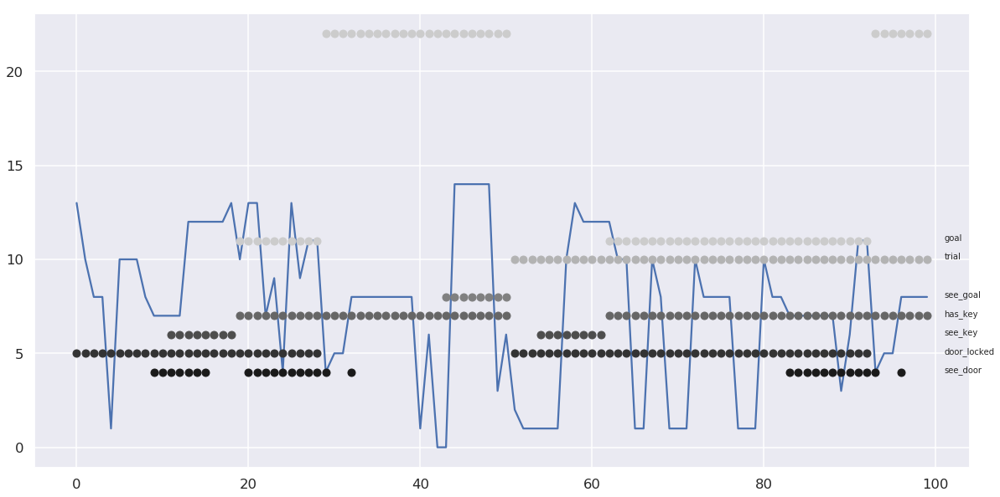

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 15, D: 5


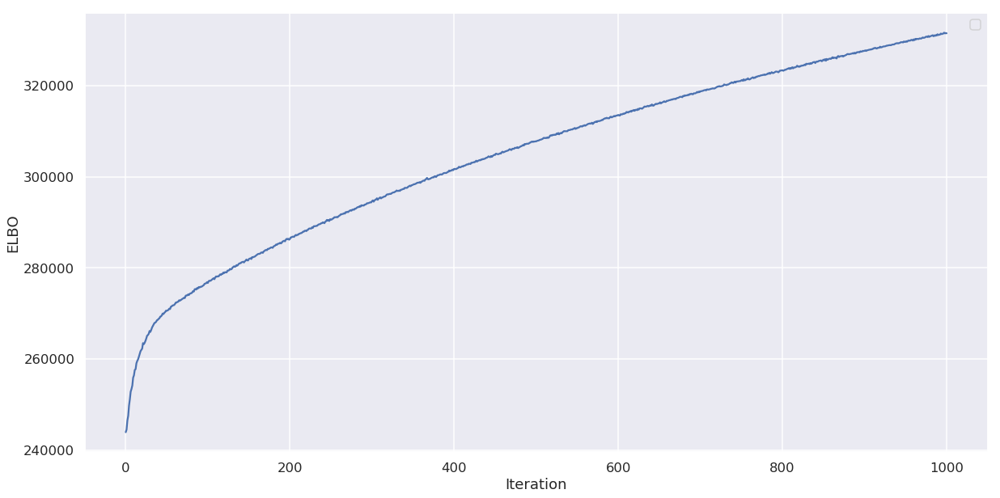

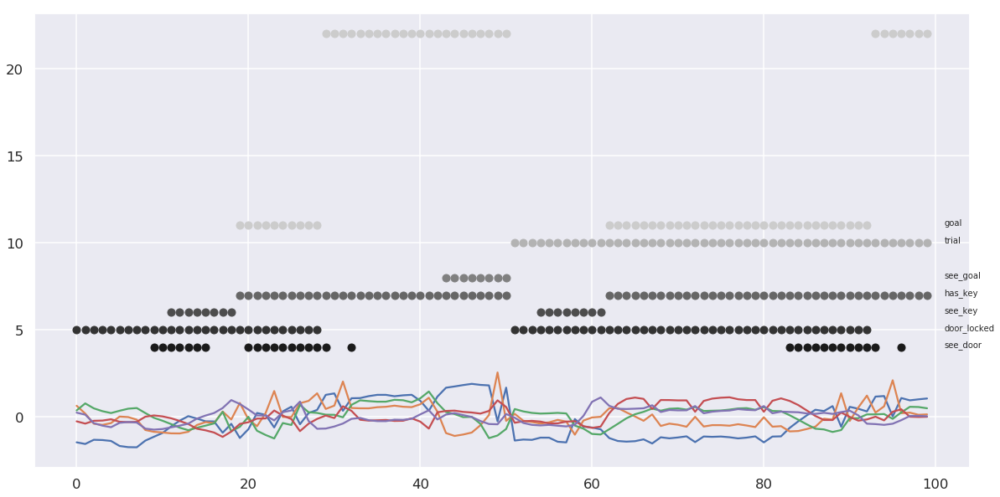

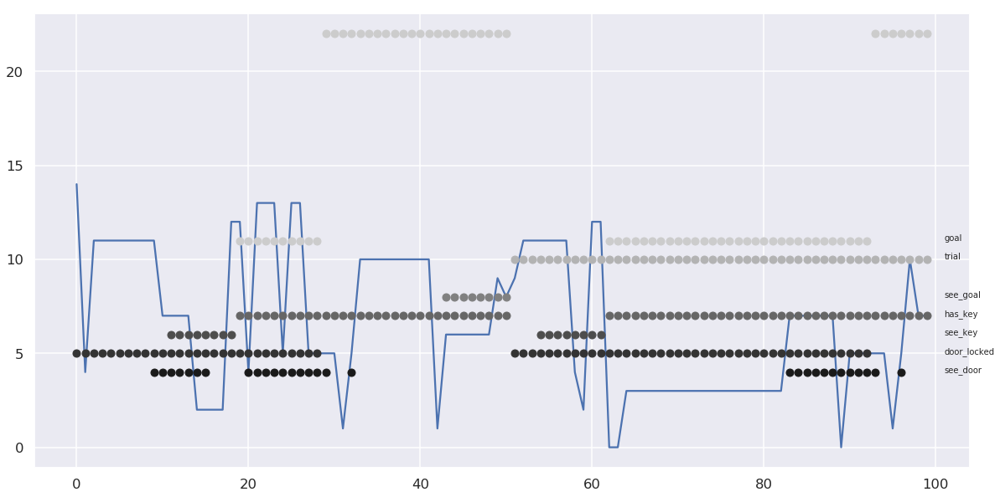

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 15, D: 10


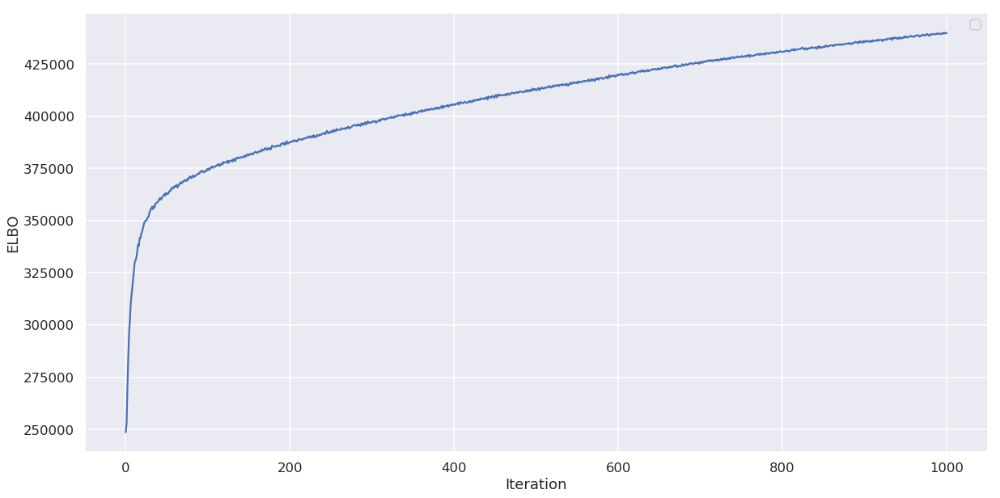

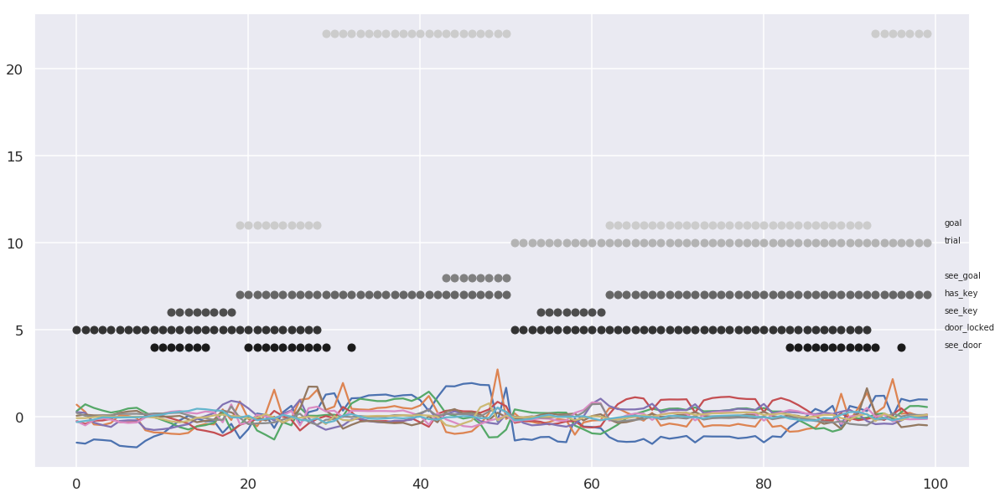

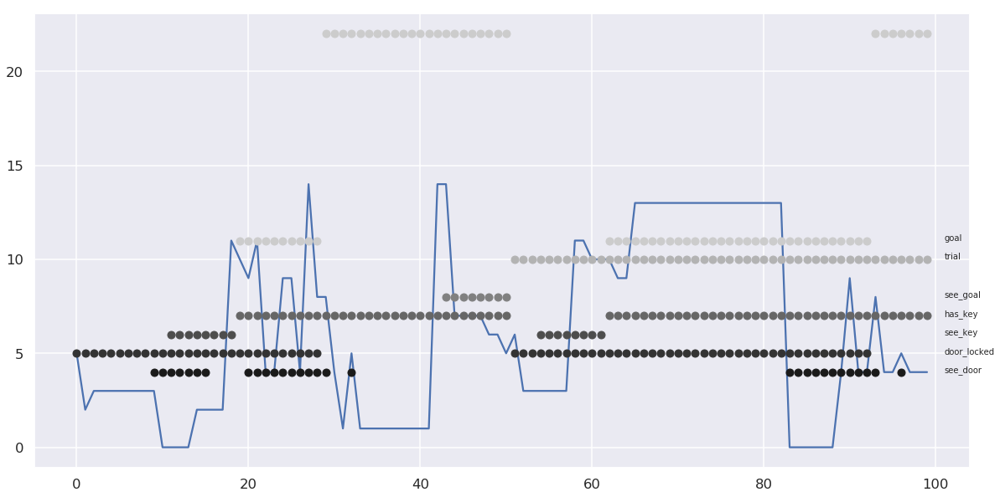

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 15, D: 15


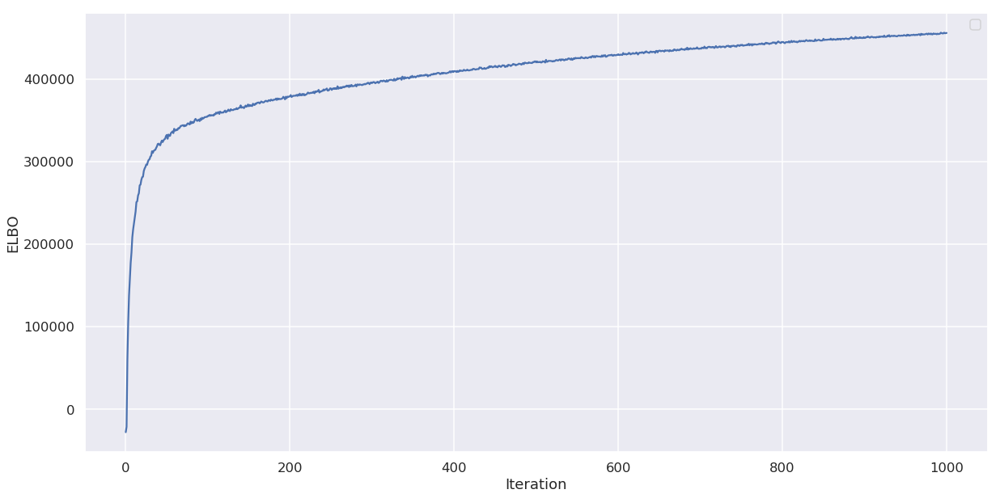

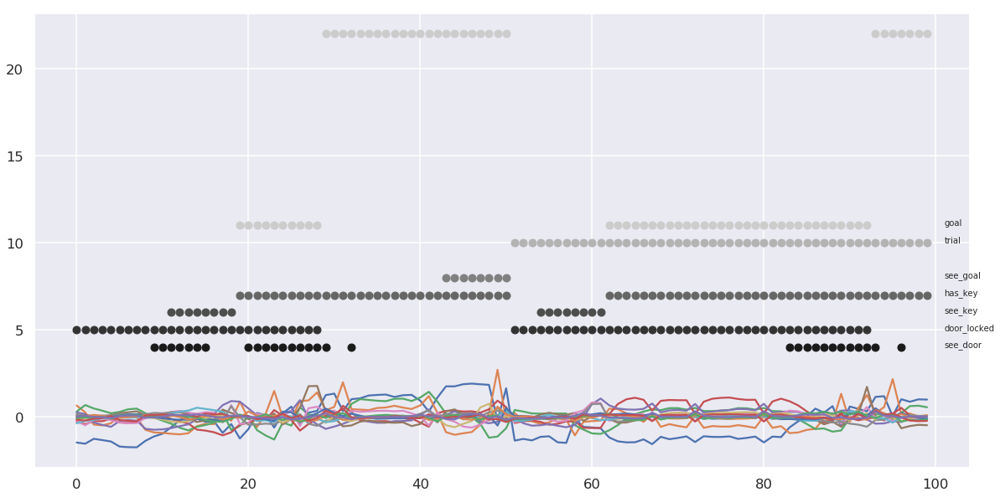

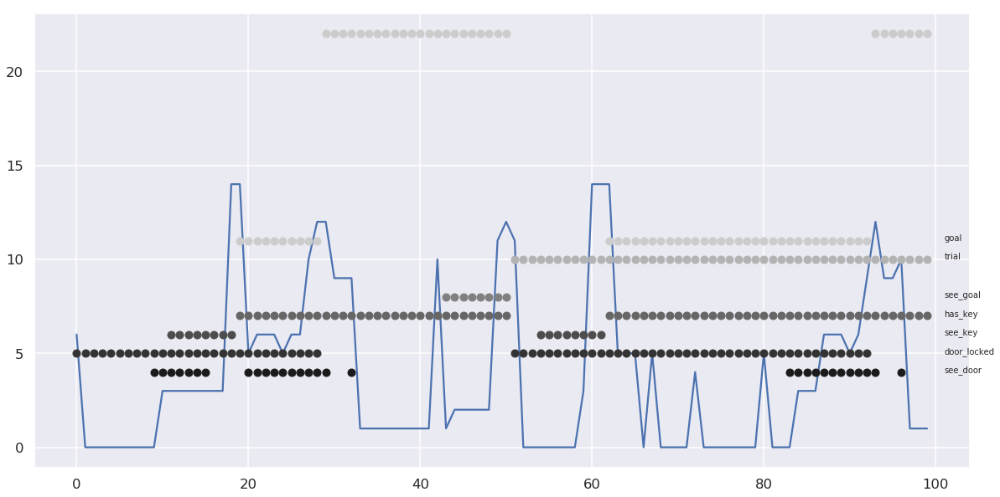

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 25, D: 2


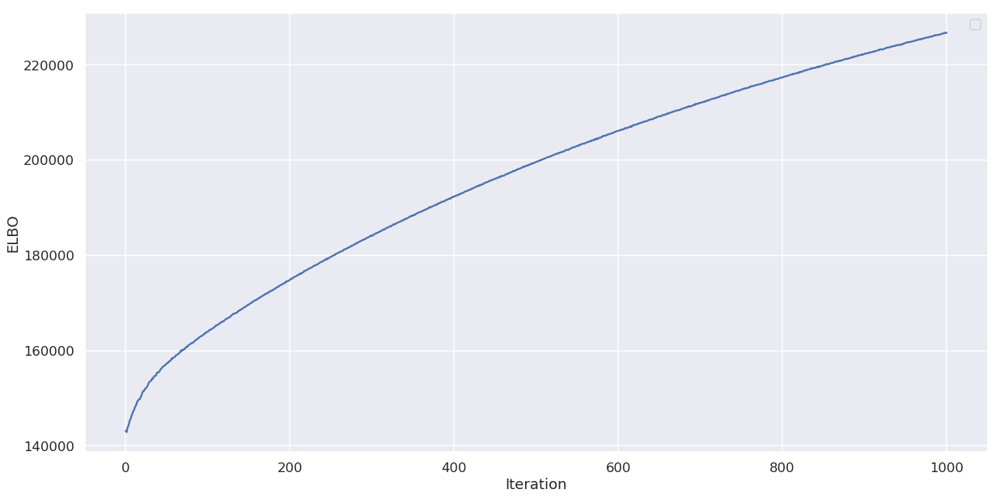

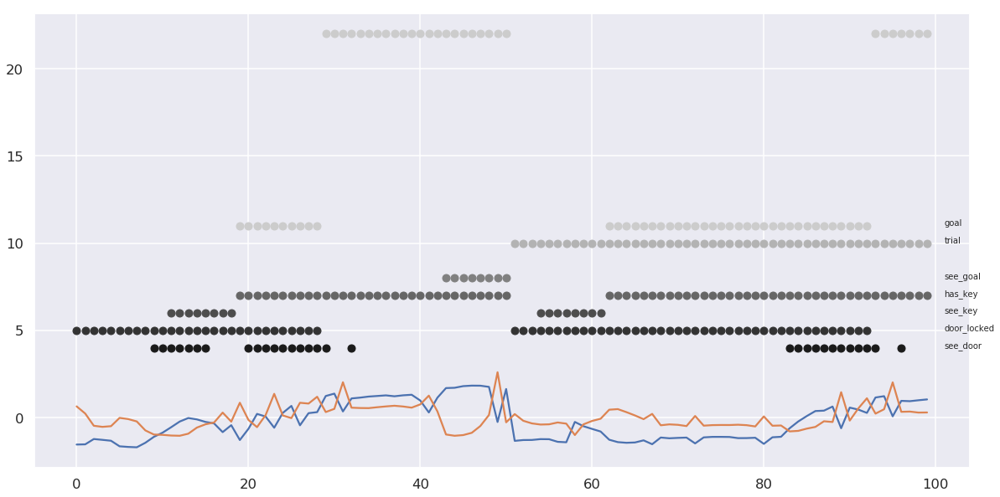

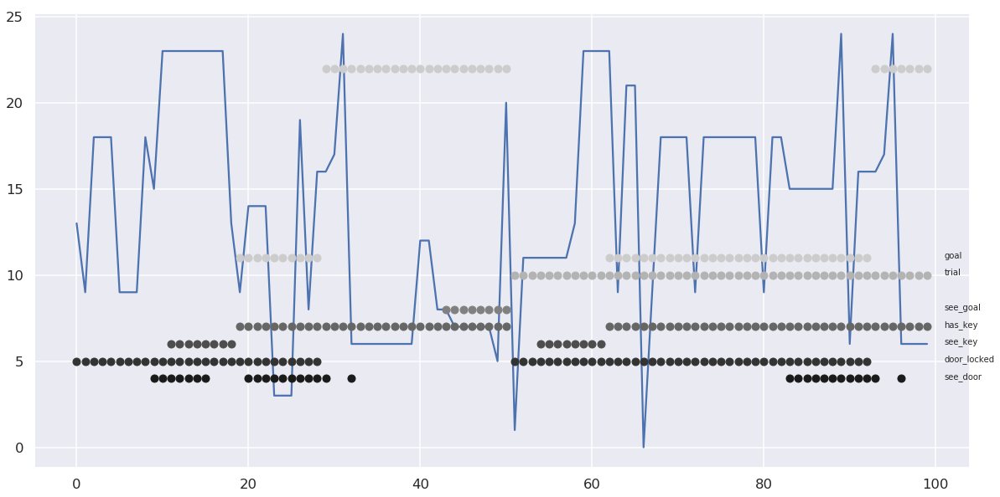

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 25, D: 5


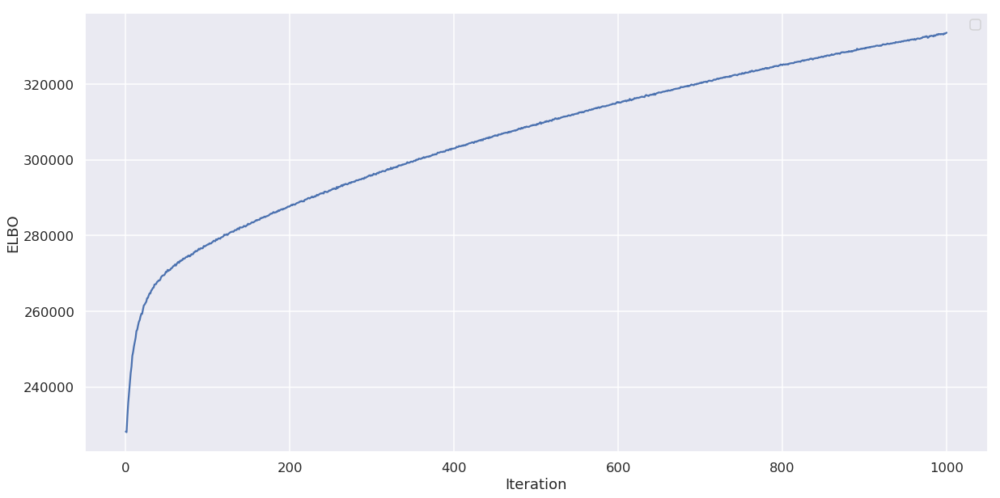

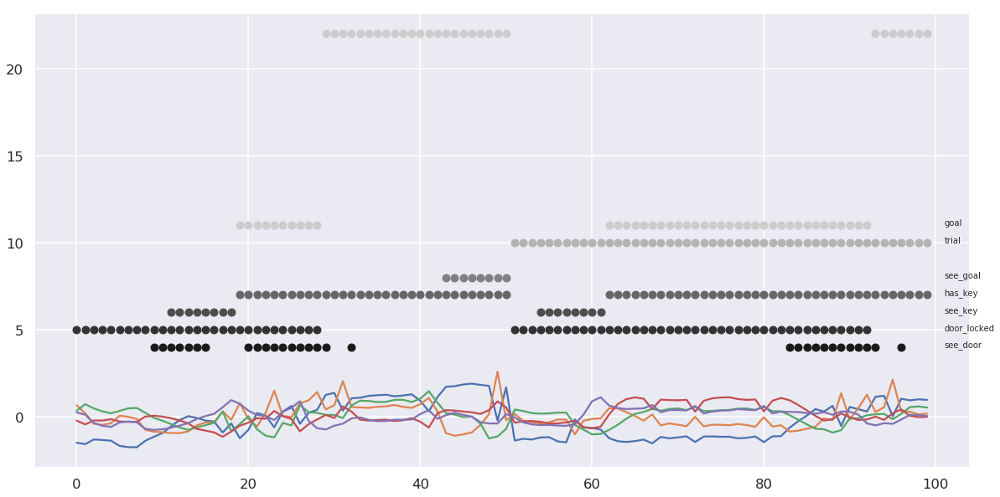

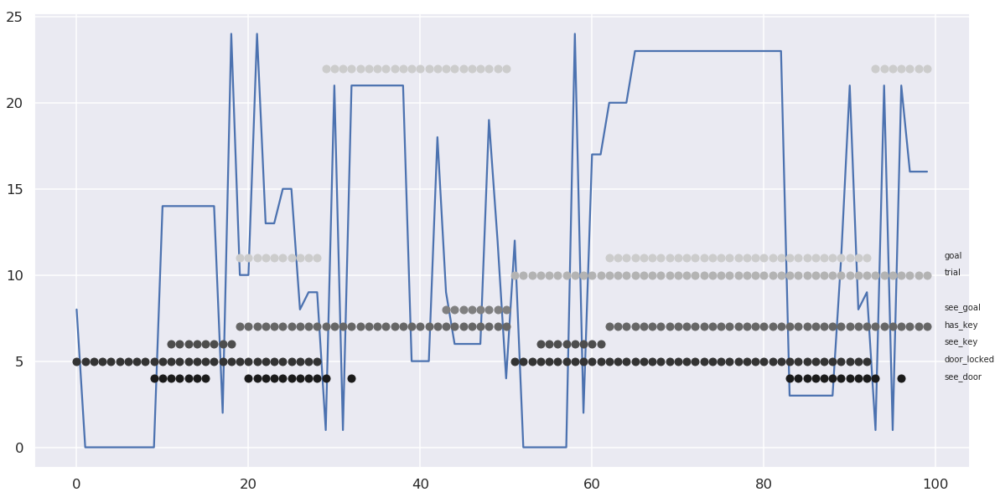

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 25, D: 10


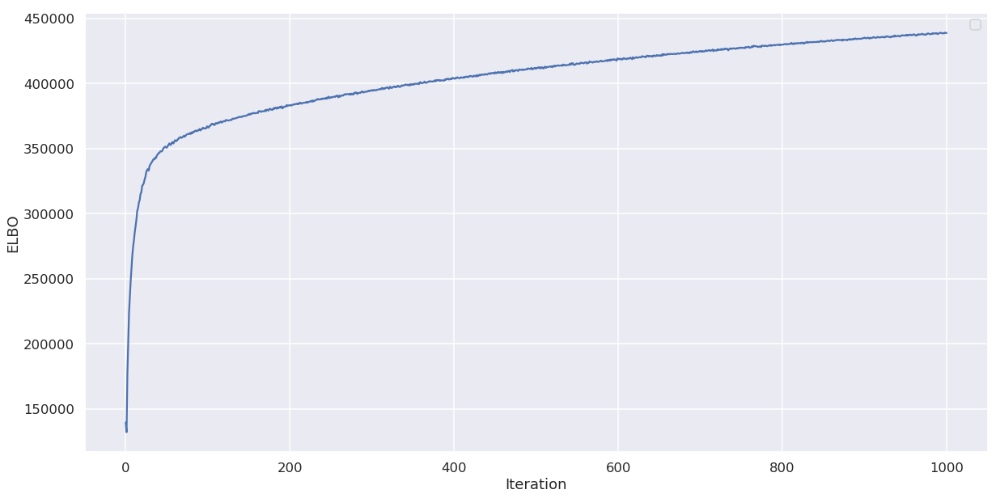

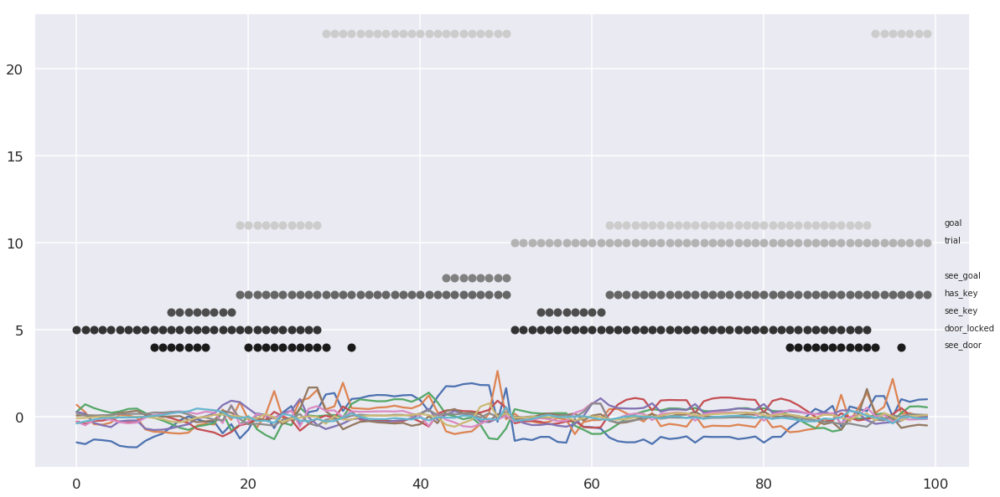

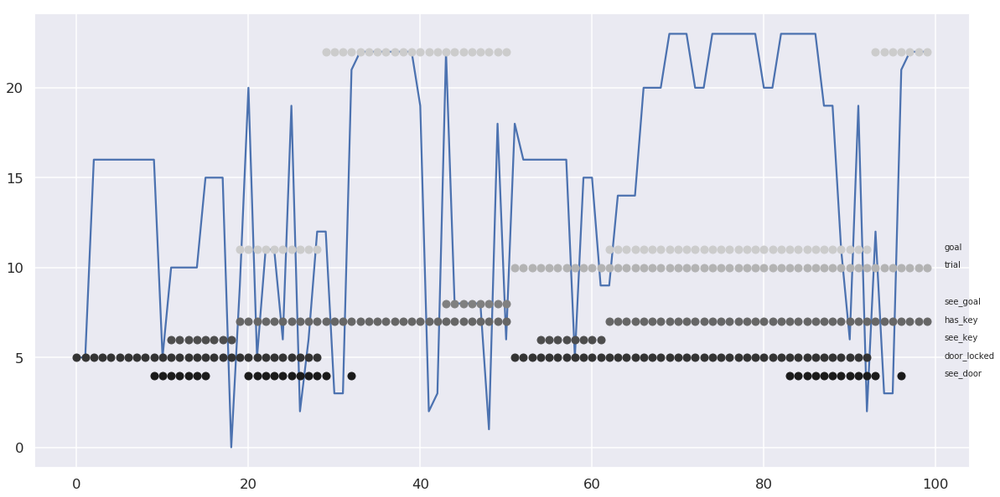

Initializing with an ARHMM using 150 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 25, D: 15


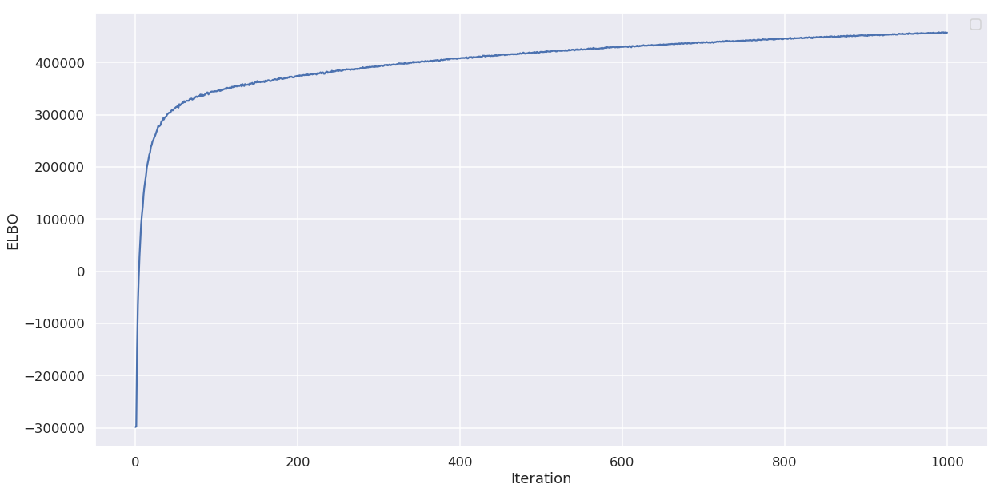

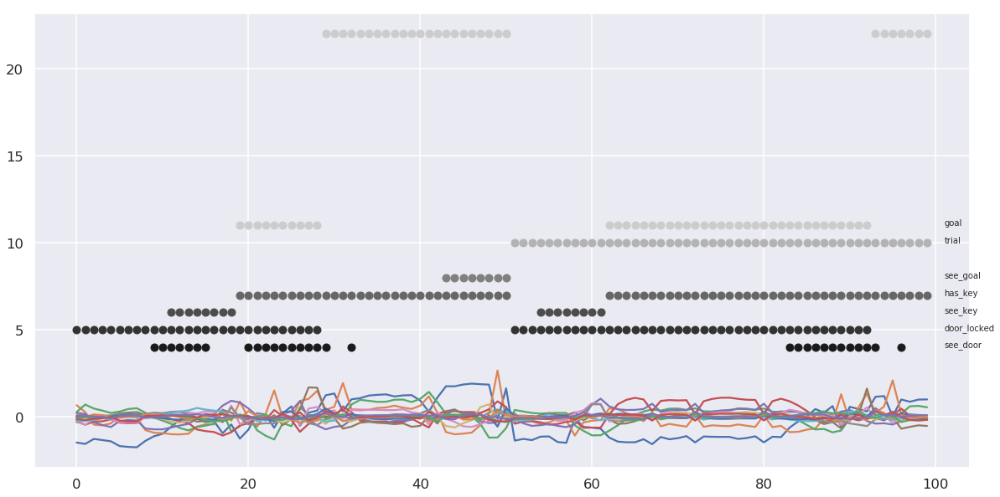

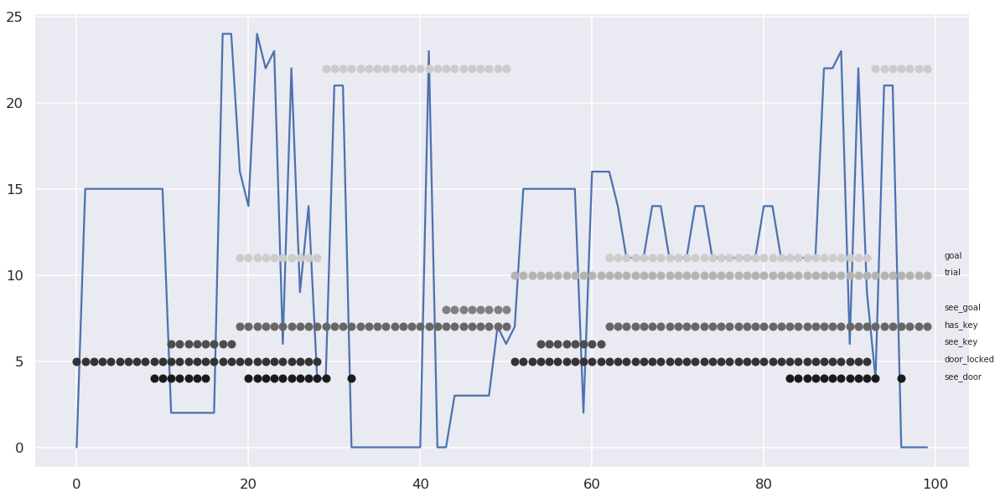

In [14]:
for K in [8,15,25]:
    for D_latent in [2,5,10,15]:
        # model parameters
        T = lstm.shape[0]
#         K = 10
        D_obs = lstm.shape[-1]
#         D_latent = 10

        # Fit a robust rSLDS with its default initialization
        rslds = ssm.SLDS(D_obs, K, D_latent,
                     transitions="recurrent",
#                      dynamics="gaussian",
#                      emissions="gaussian",
                     single_subspace=True)

        rslds.initialize(lstm, num_em_iters=150)

        # Fit with variational EM
        # q_vem = SLDSTriDiagVariationalPosterior(rslds, y)
        # elbos = rslds.fit(q_vem, y, method="vem", num_iters=500, initialize=False)
        # xhat = q_vem.mean[0]
        
        # Uncomment this to fit with stochastic variational inference instead
        q_svi = SLDSTriDiagVariationalPosterior(rslds, lstm)
        elbos = rslds.fit(q_svi, lstm, method="svi", num_iters=1000, initialize=False)
        xhat = q_svi.mean[0]
        zhat = rslds.most_likely_states(xhat, lstm)

        print('K: {}, D: {}'.format(K,D_latent))
        
        # Plot some results
        plt.figure()
        plt.plot(elbos)
        plt.legend()
        plt.xlabel("Iteration")
        plt.ylabel("ELBO")
        plt.show()

        
        # and estimated trajectories
        plt.plot(xhat[:100])
        for j, key in enumerate(annotation_data.keys()):
            if ('Unnamed' in key) or ('DIR' in key):
                pass
            else:
                k = (j+3)
                x,y = get_annotations(annotation_data, 100, k, key)
                plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
                plt.text(100+1, k, key)

        plt.show()

        # and estimated state
        plt.plot(zhat[:100])
        for j, key in enumerate(annotation_data.keys()):
            if ('Unnamed' in key) or ('DIR' in key):
                pass
            else:
                k = (j+3)
                x,y = get_annotations(annotation_data, 100, k, key)
                plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
                plt.text(100+1, k, key)

        plt.show()

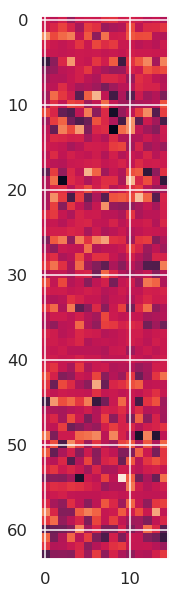

In [25]:
plt.imshow(rslds.emissions.Cs[0])

Initializing with an ARHMM using 25 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

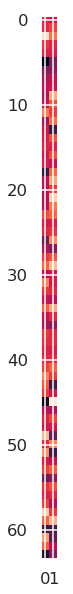

In [27]:
# Fit a robust rSLDS with its default initialization
rslds2 = ssm.SLDS(D_obs, 5, 2,
             transitions="recurrent",
#                      dynamics="gaussian",
#                      emissions="gaussian",
             single_subspace=True)

rslds2.initialize(lstm)
plt.imshow(rslds2.emissions.Cs[0])

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 3, D: 1


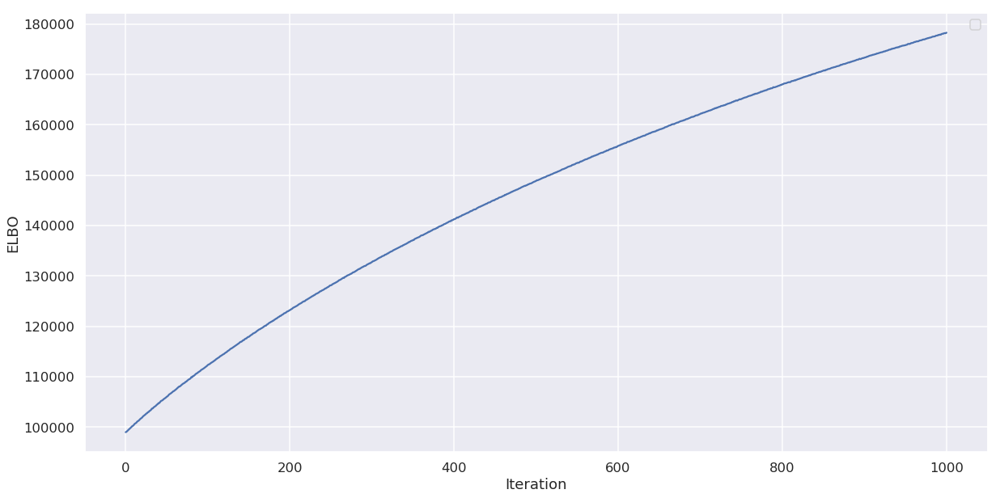

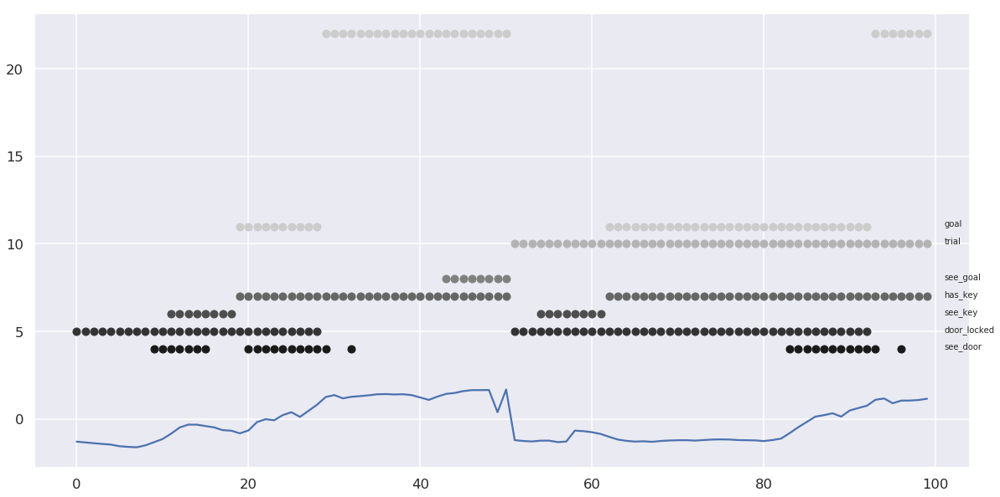

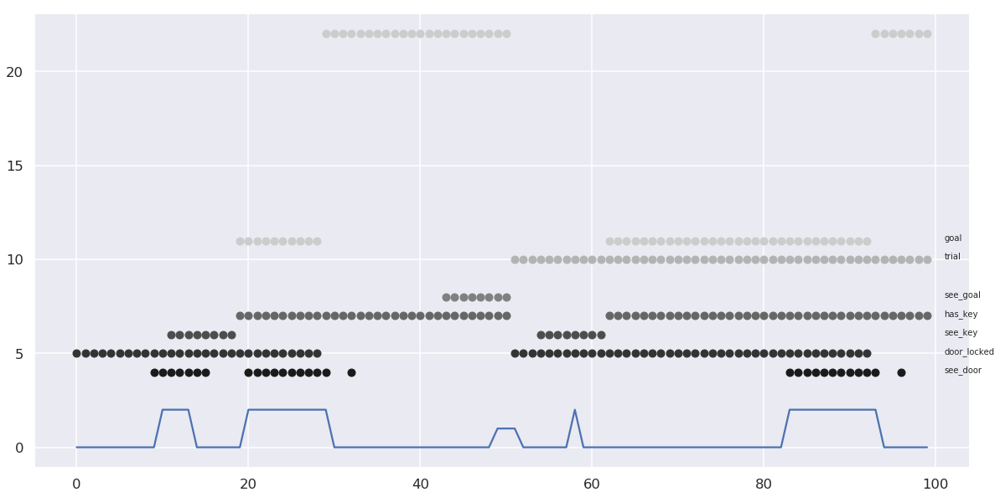

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 3, D: 3


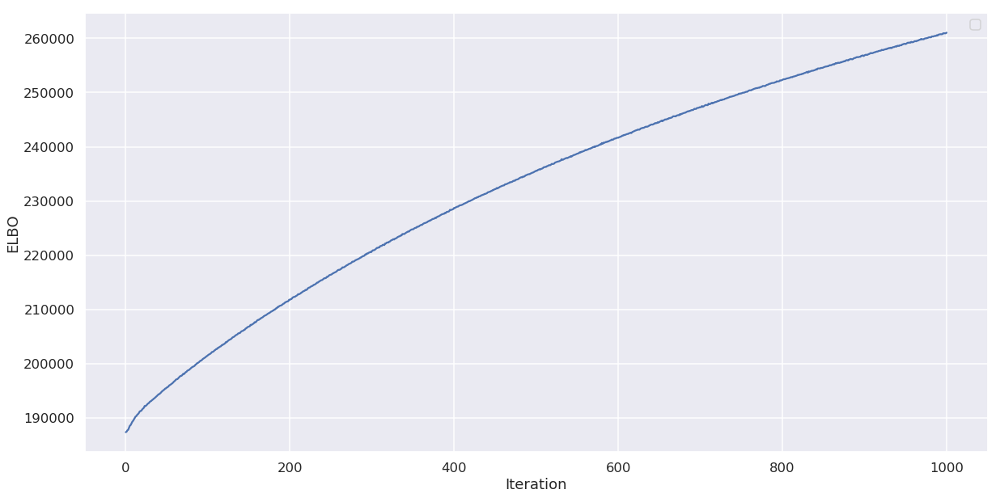

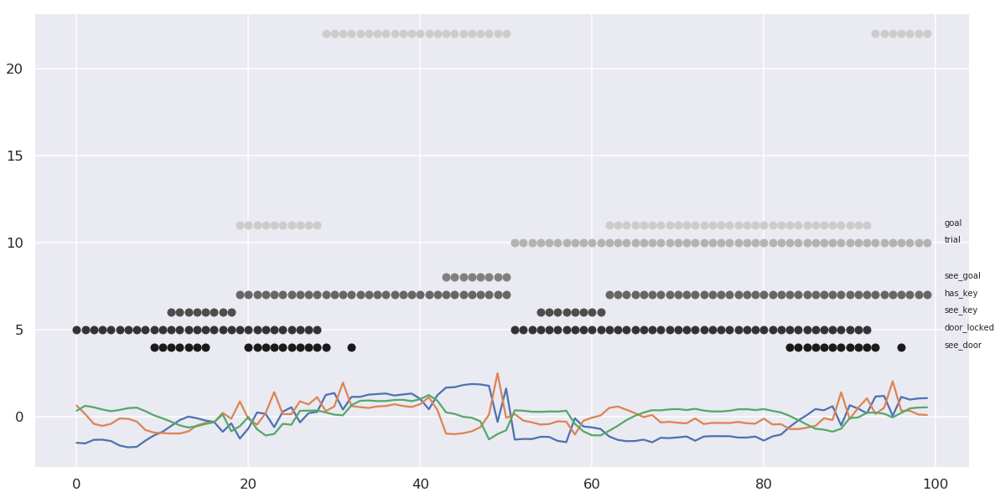

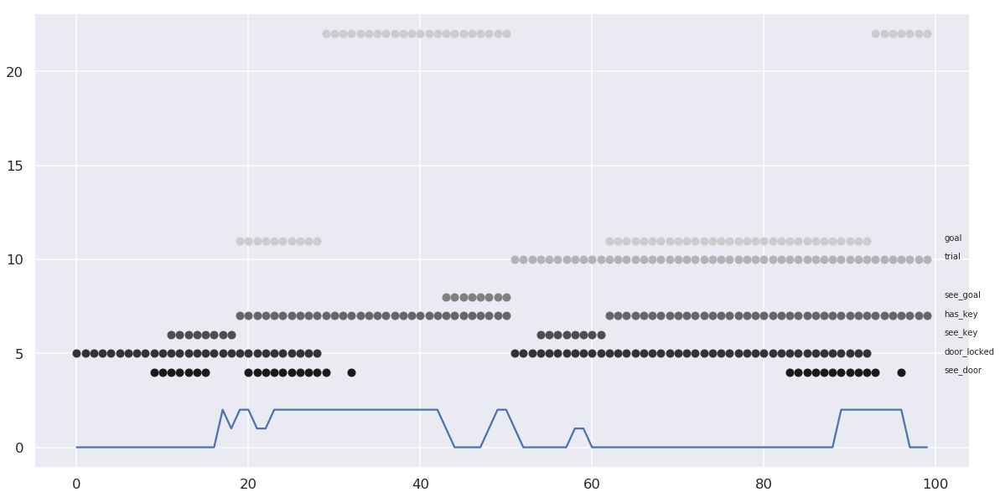

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 3, D: 5


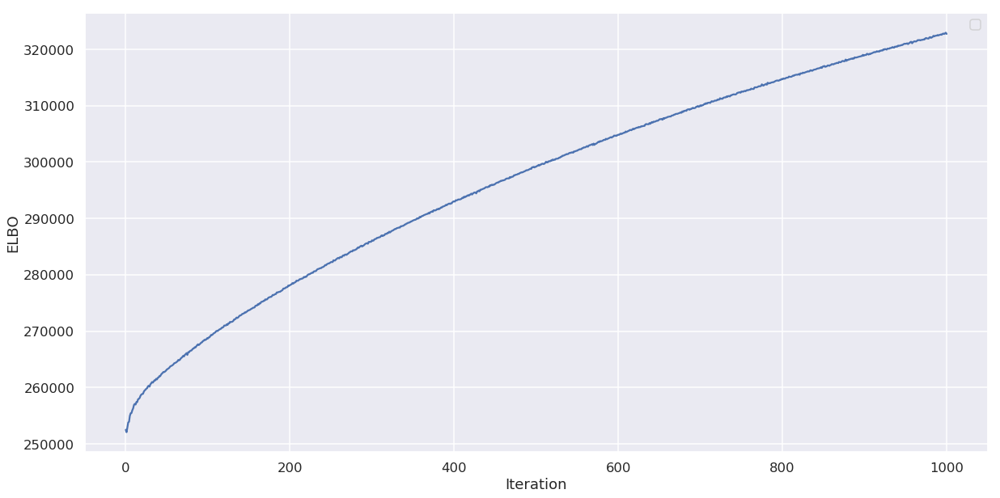

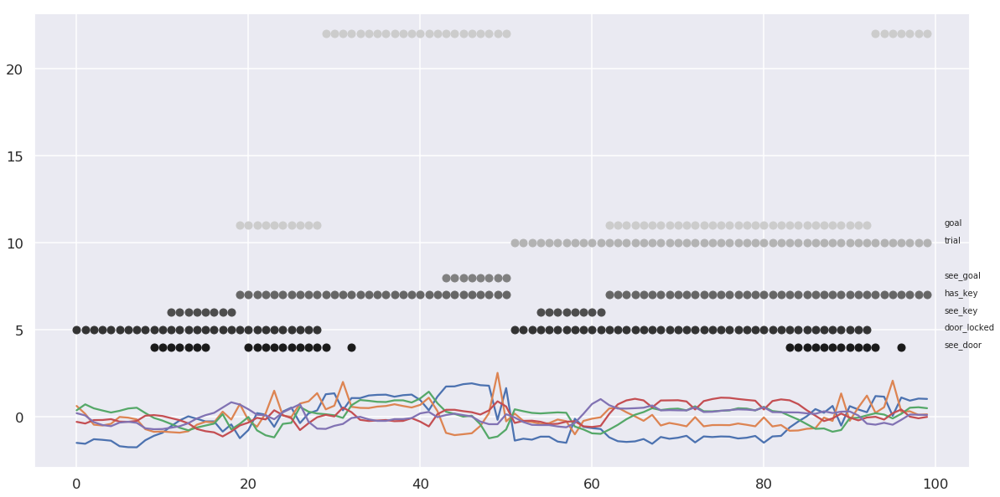

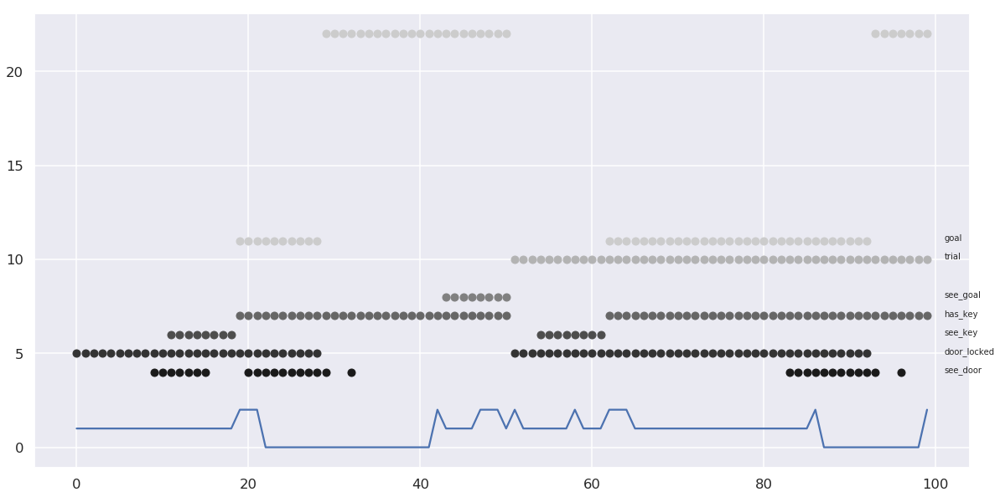

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 3, D: 7


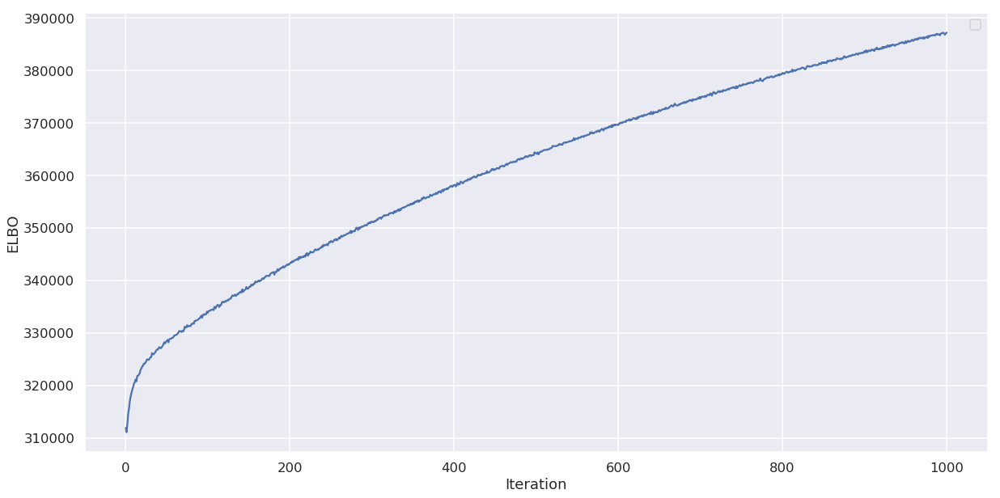

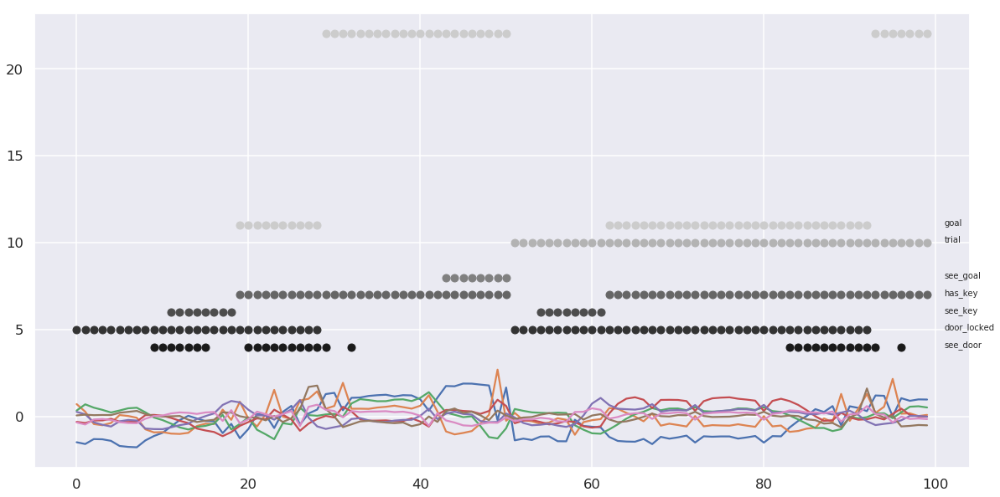

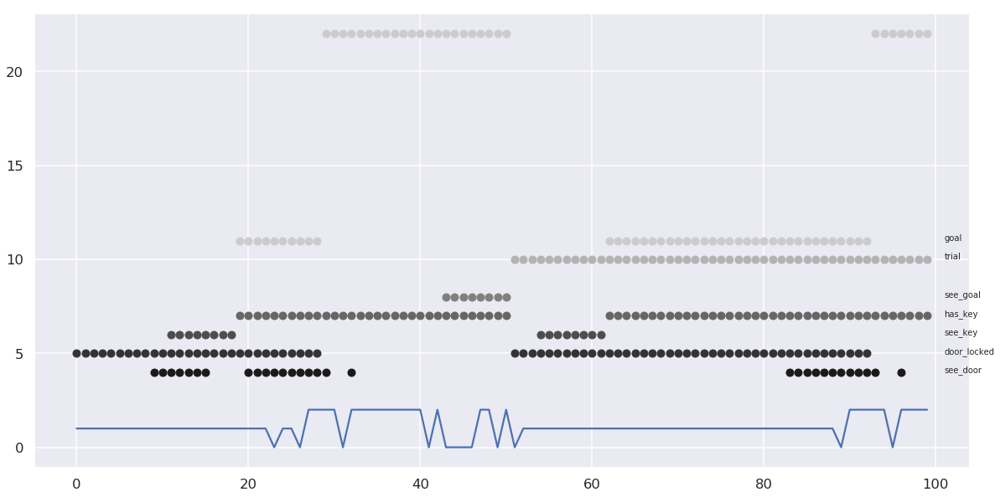

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 3, D: 10


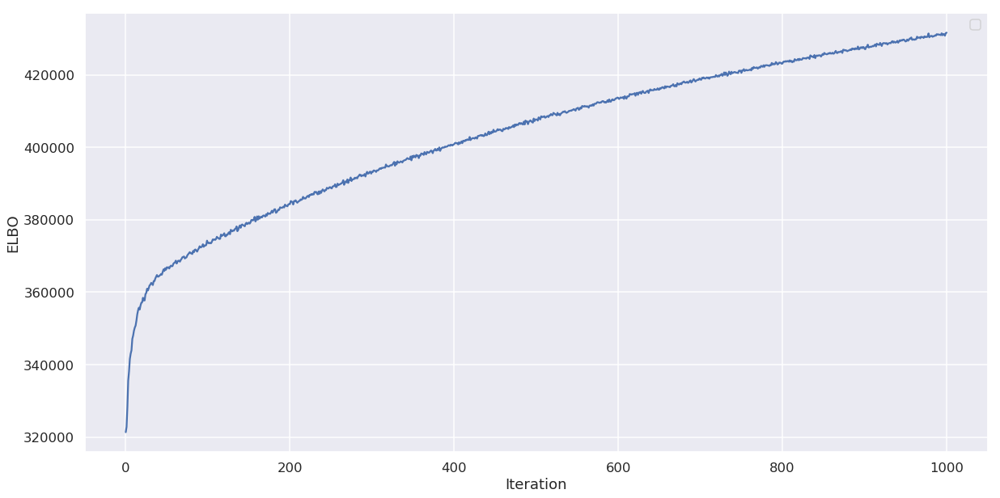

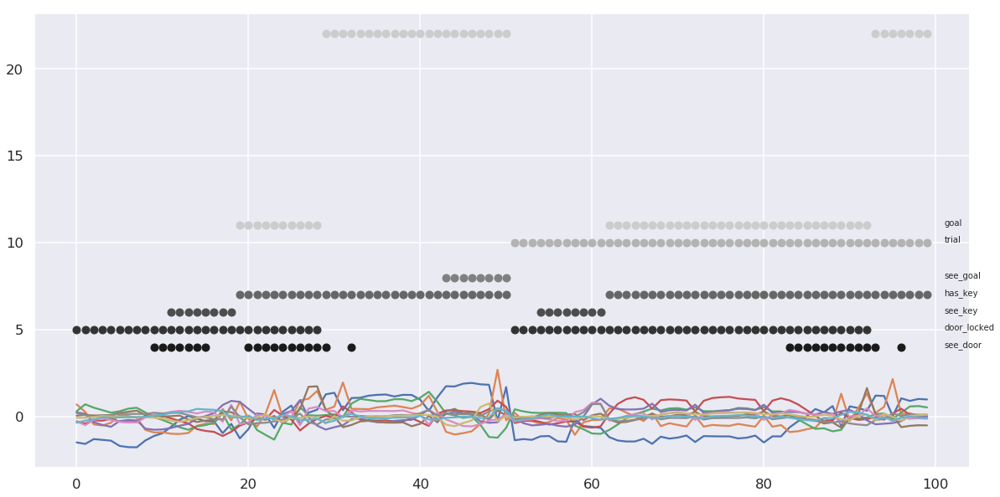

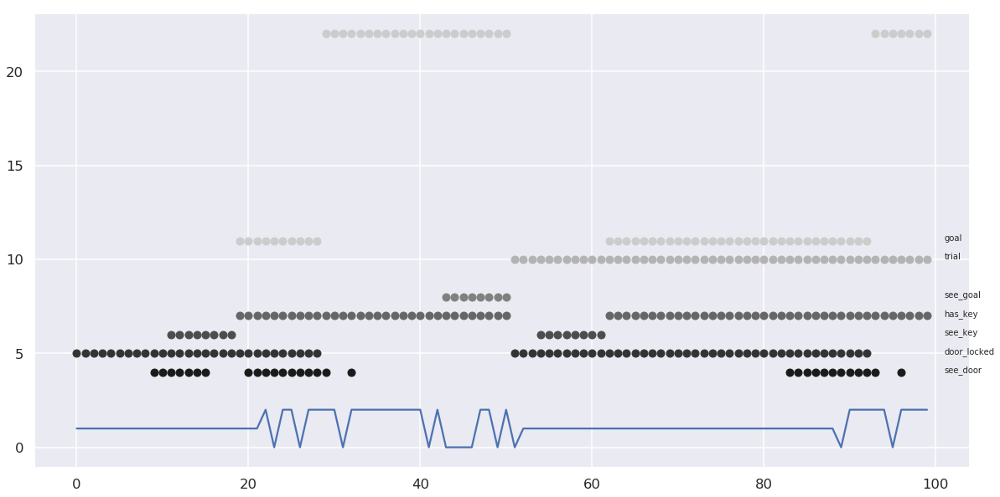

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 3, D: 15


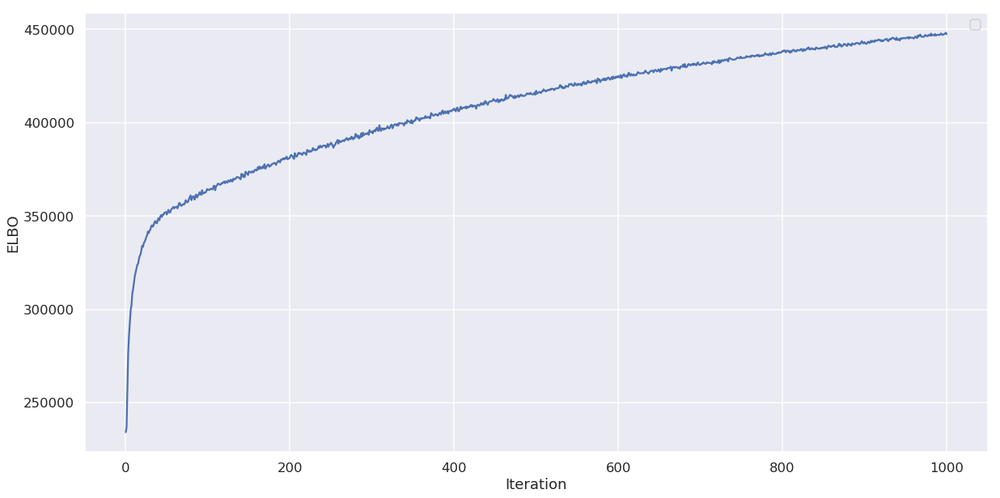

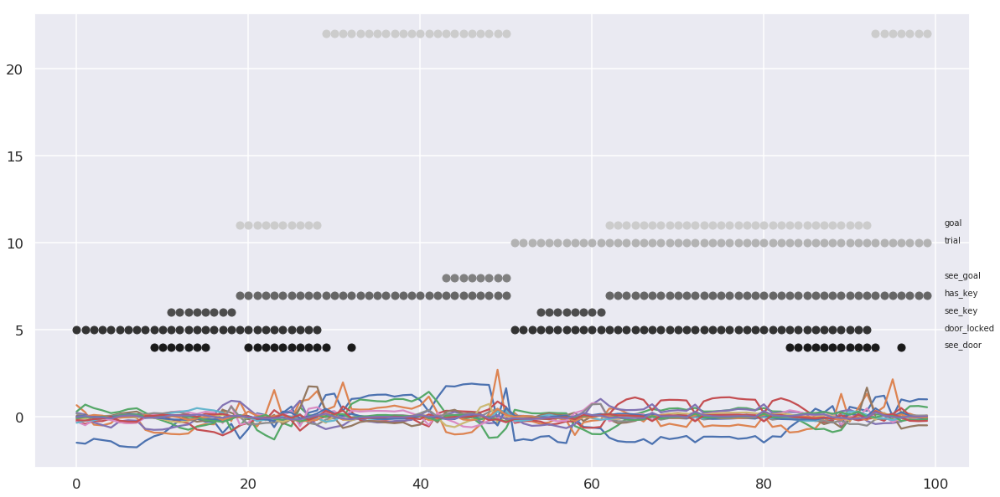

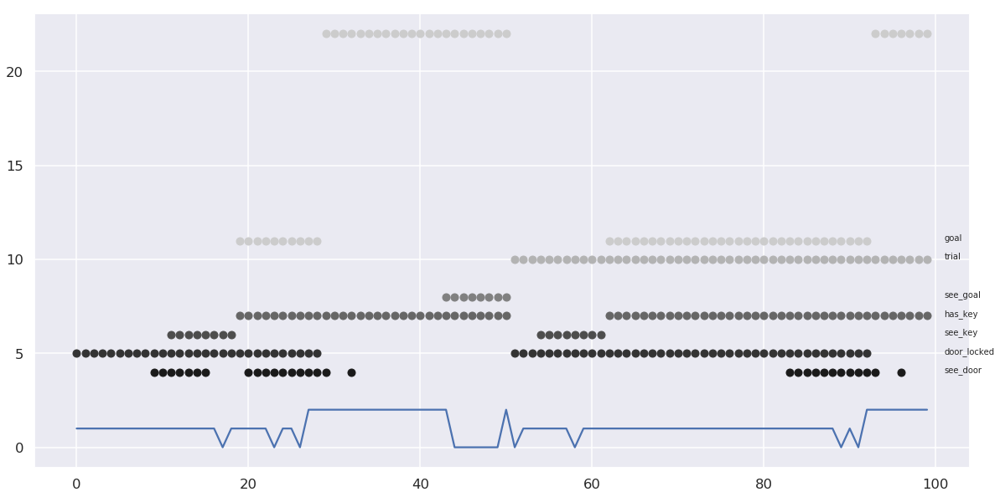

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 3, D: 25


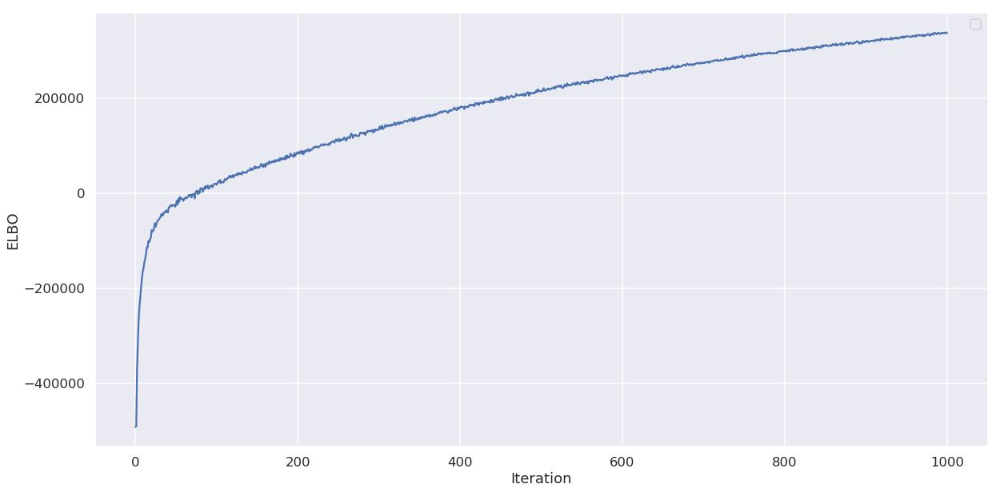

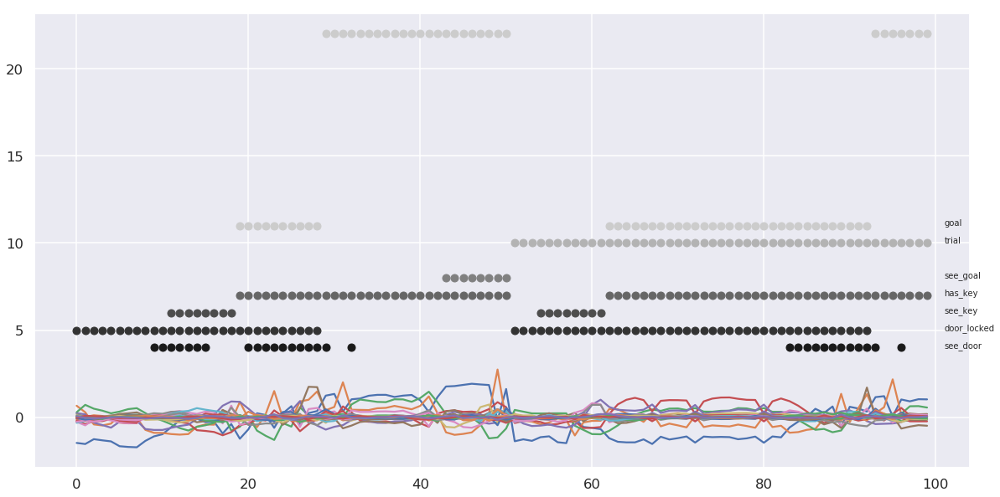

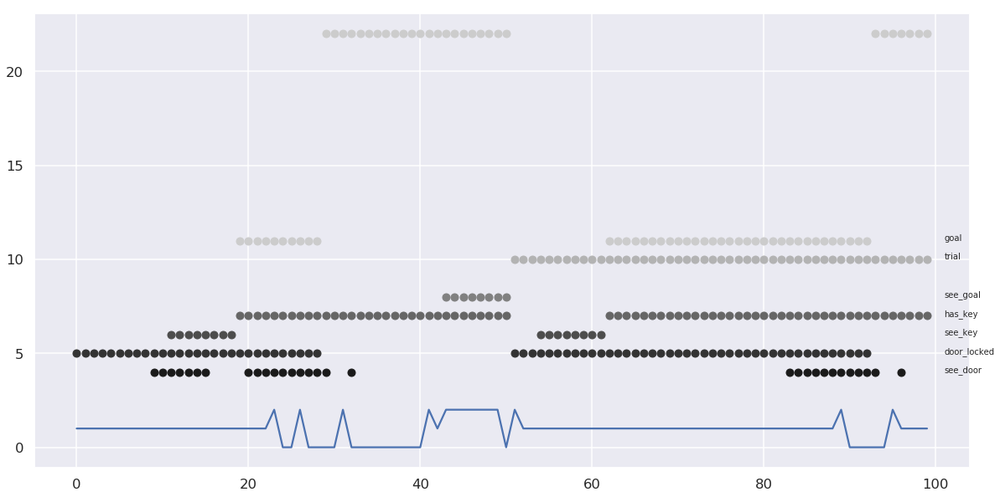

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 4, D: 1


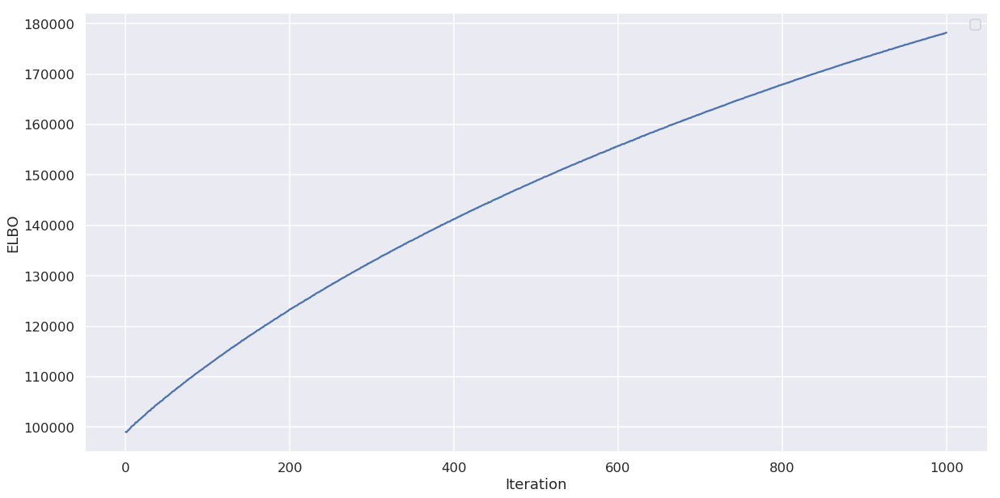

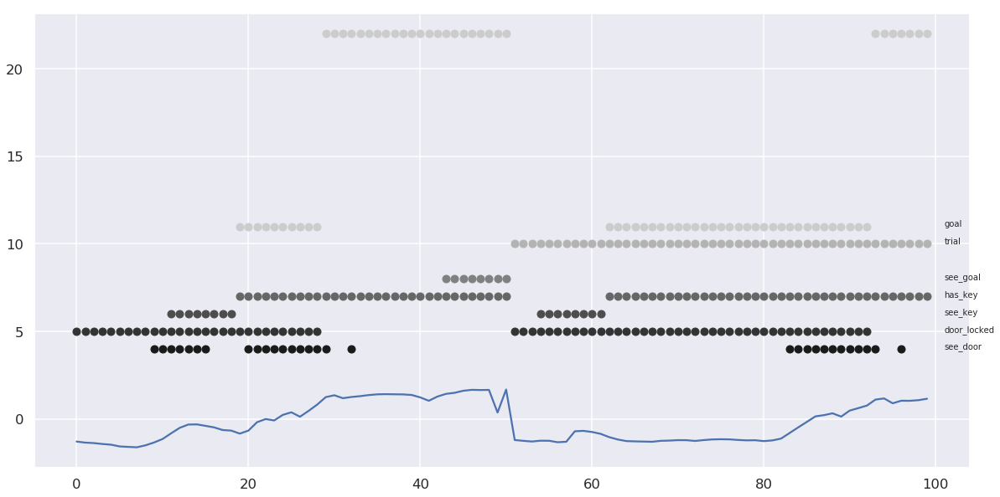

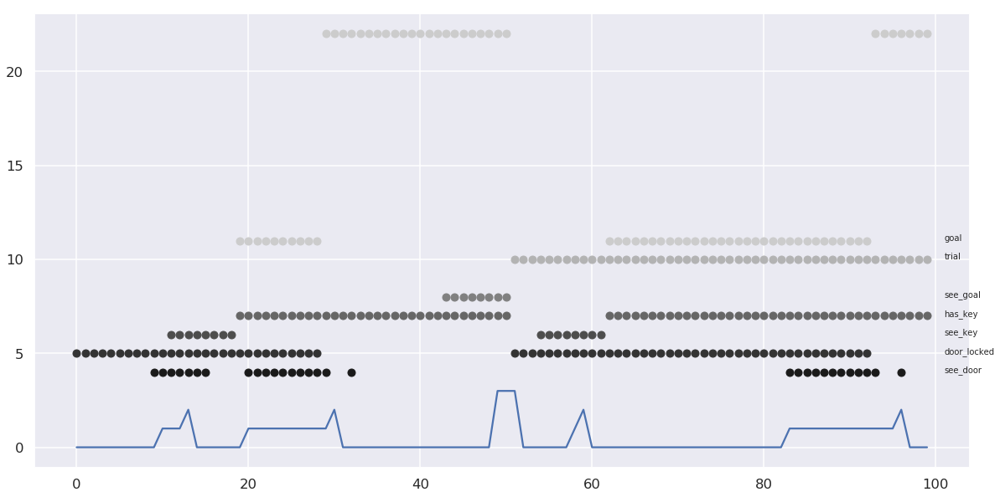

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 4, D: 3


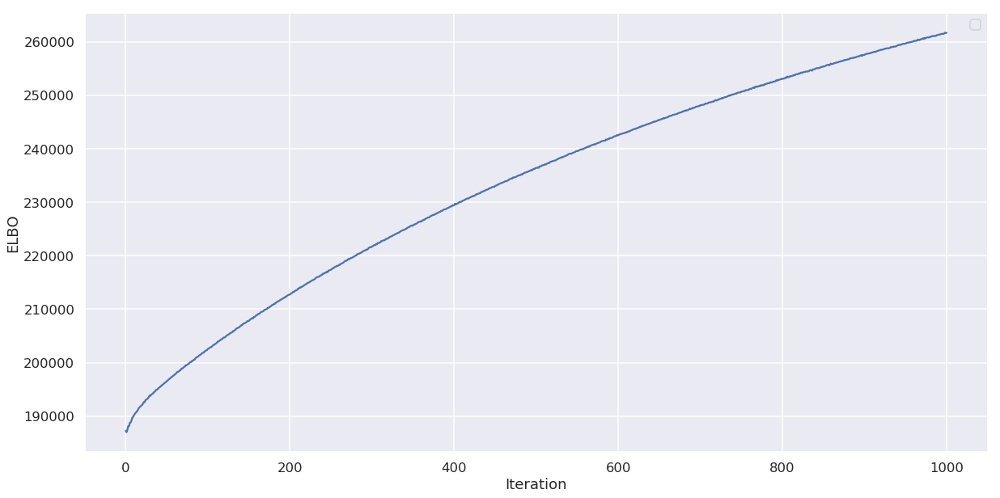

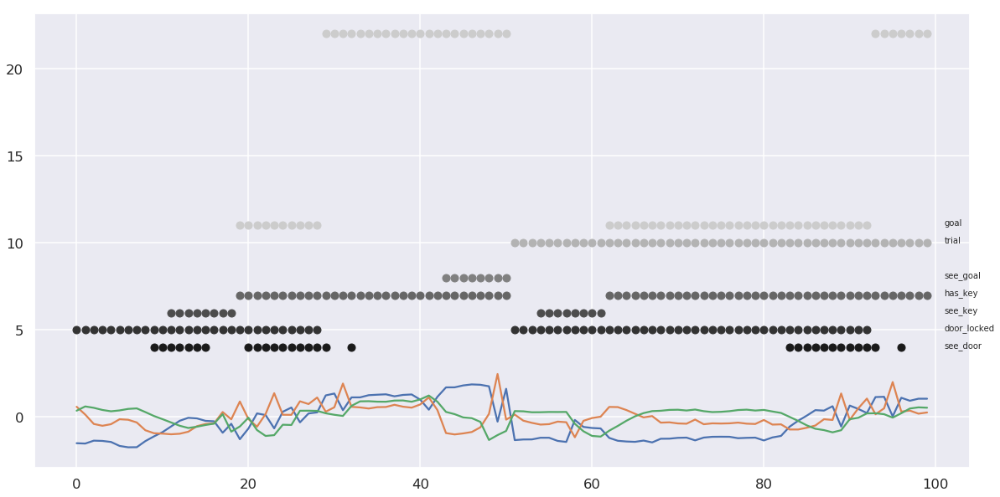

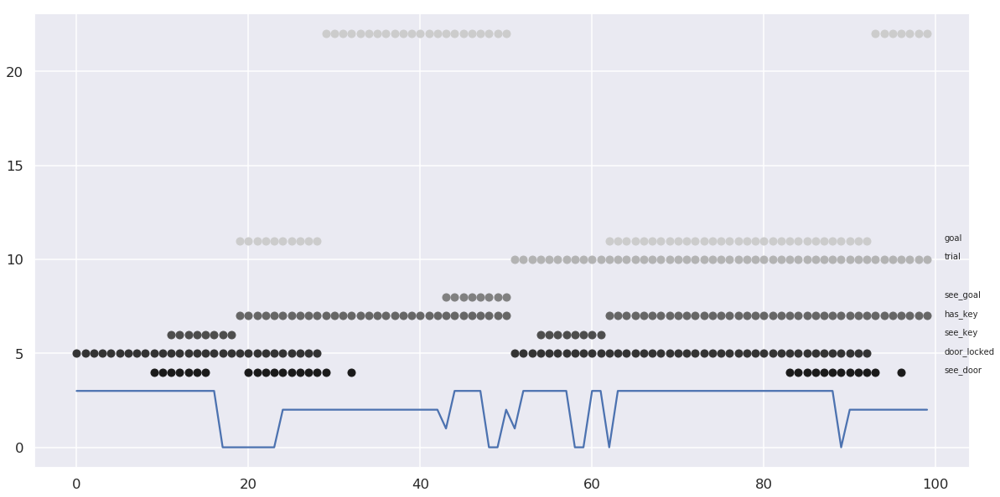

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 4, D: 5


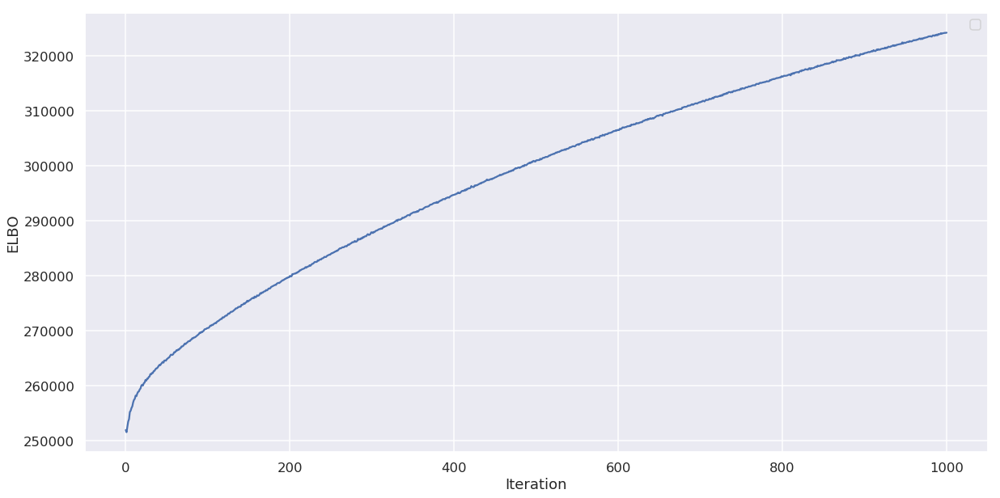

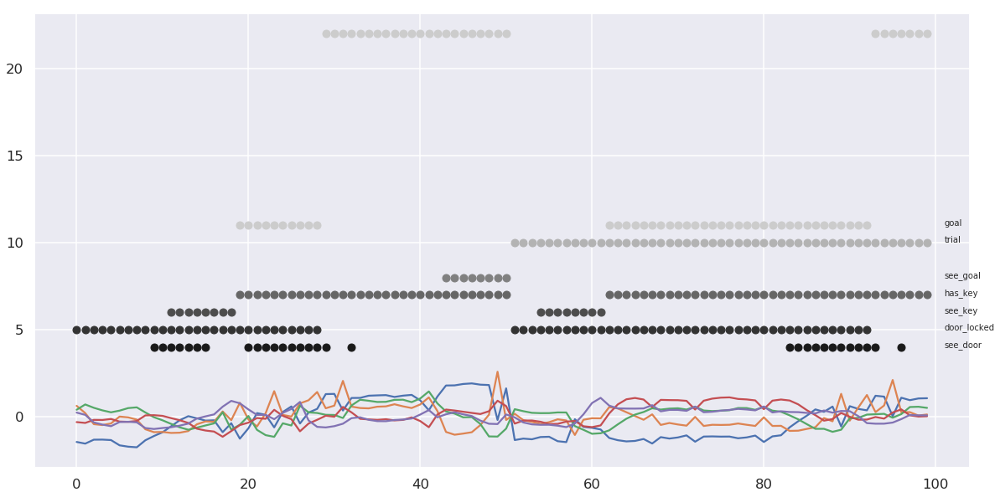

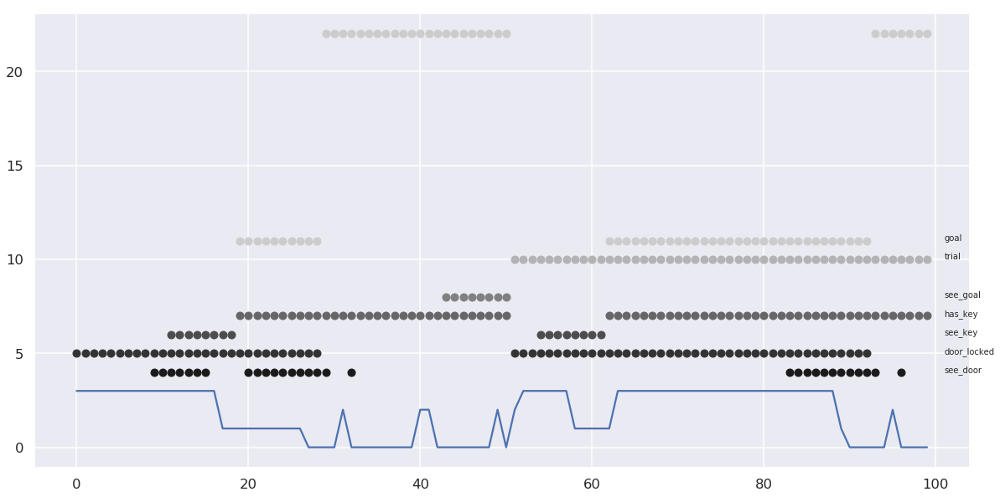

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 4, D: 7


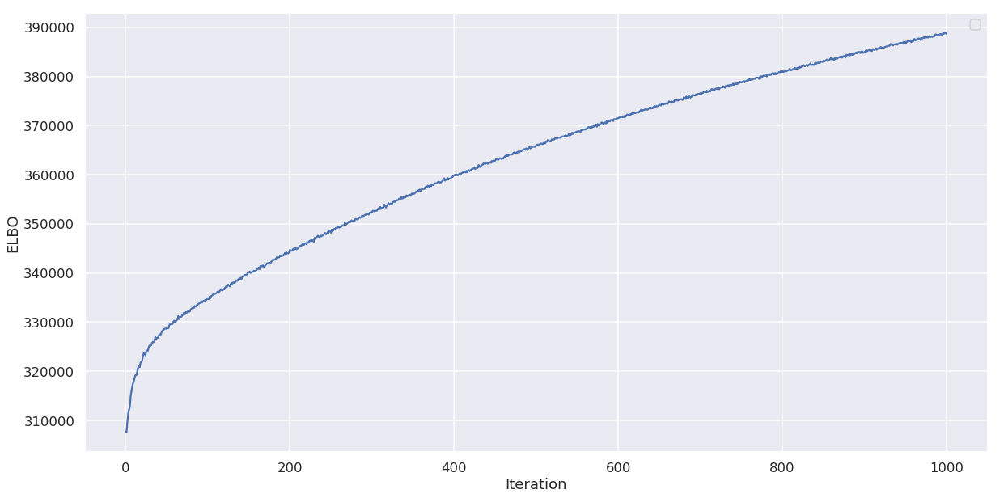

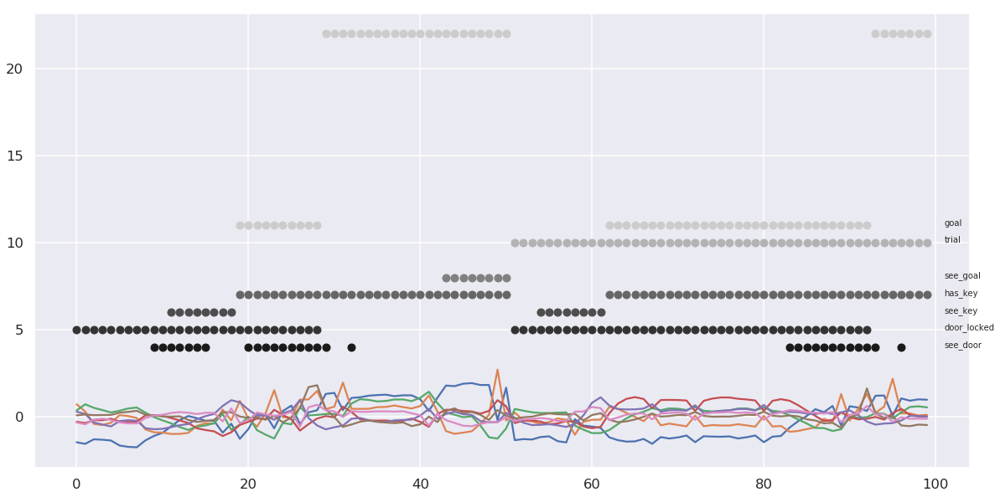

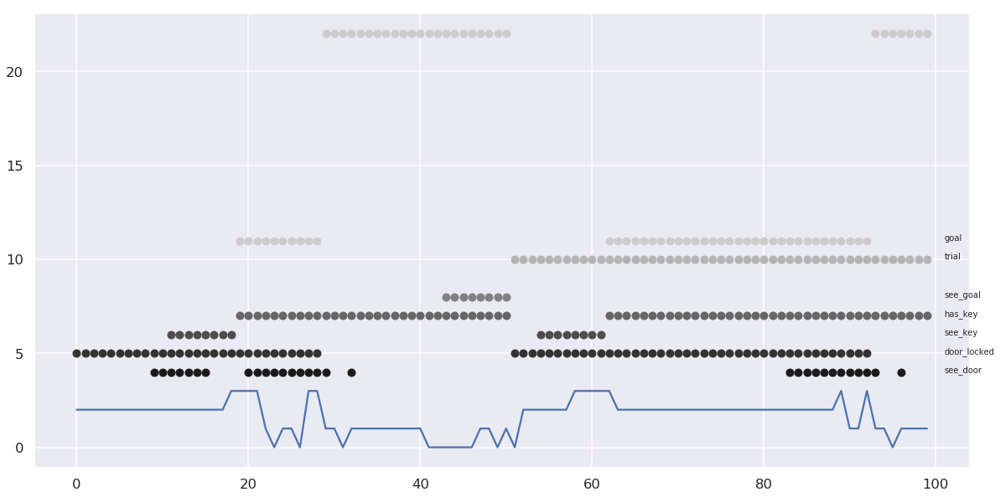

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 4, D: 10


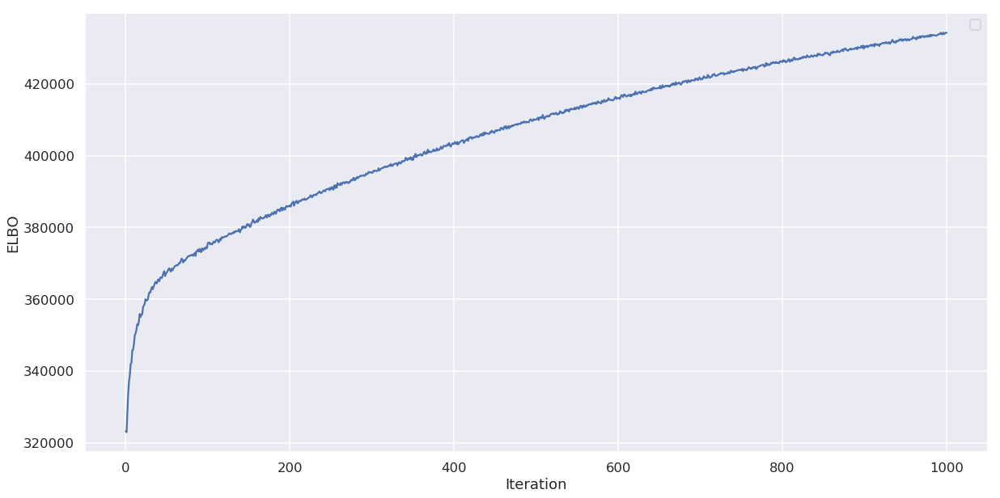

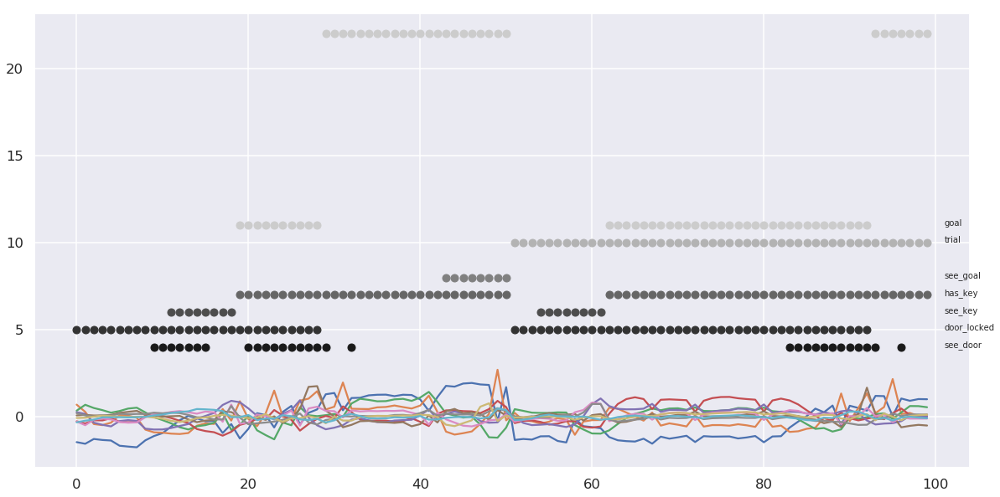

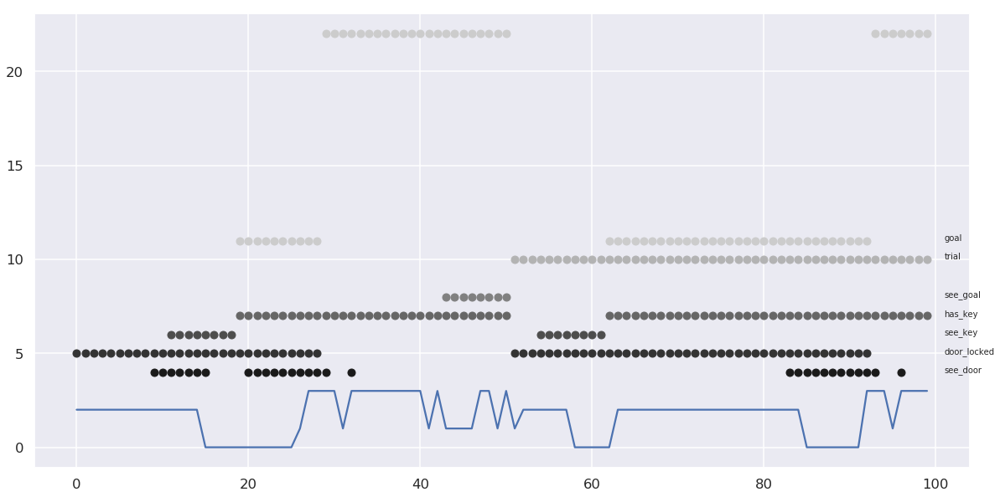

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 4, D: 15


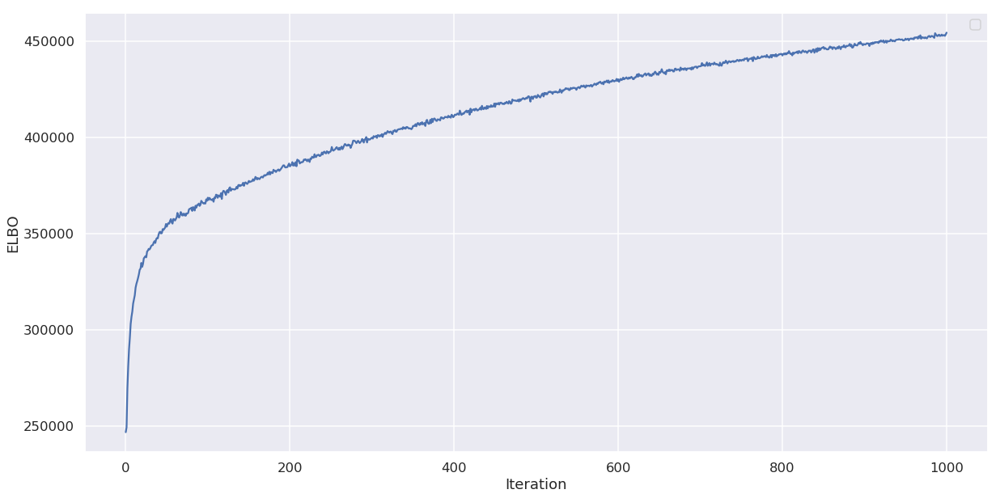

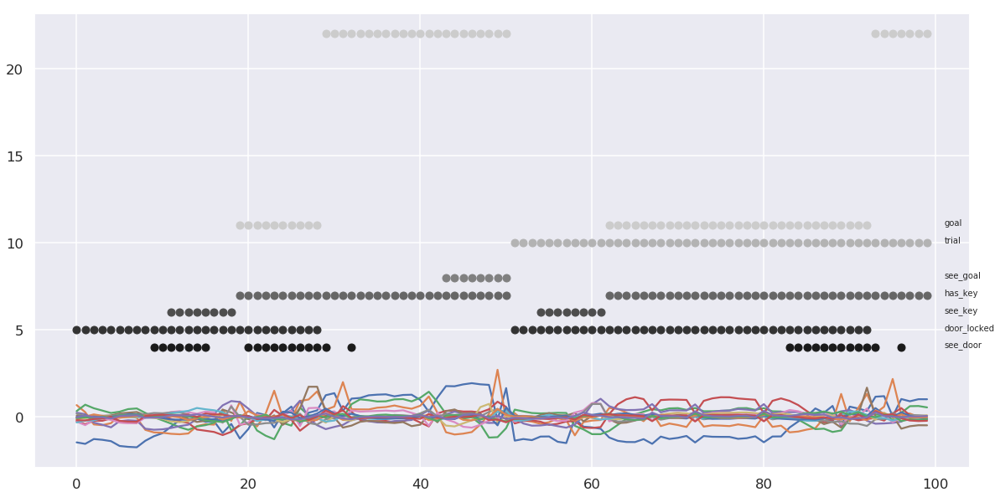

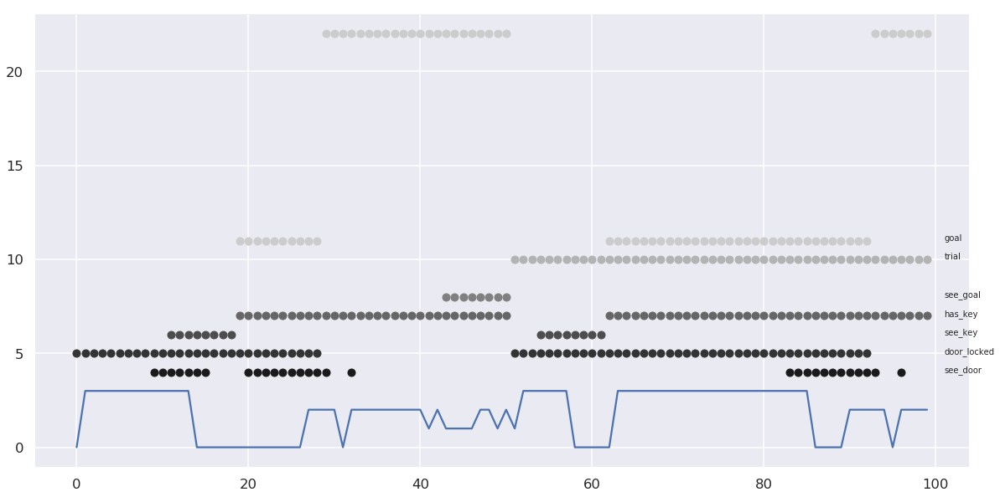

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 4, D: 25


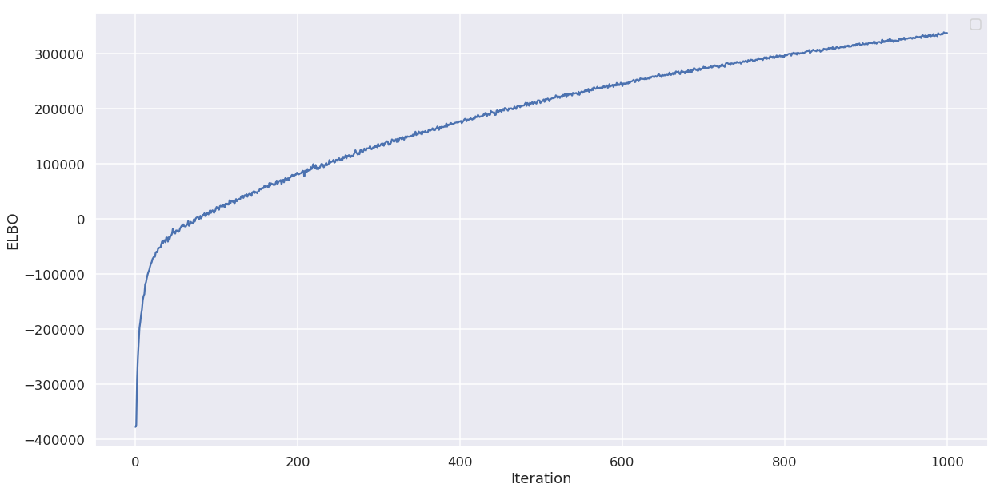

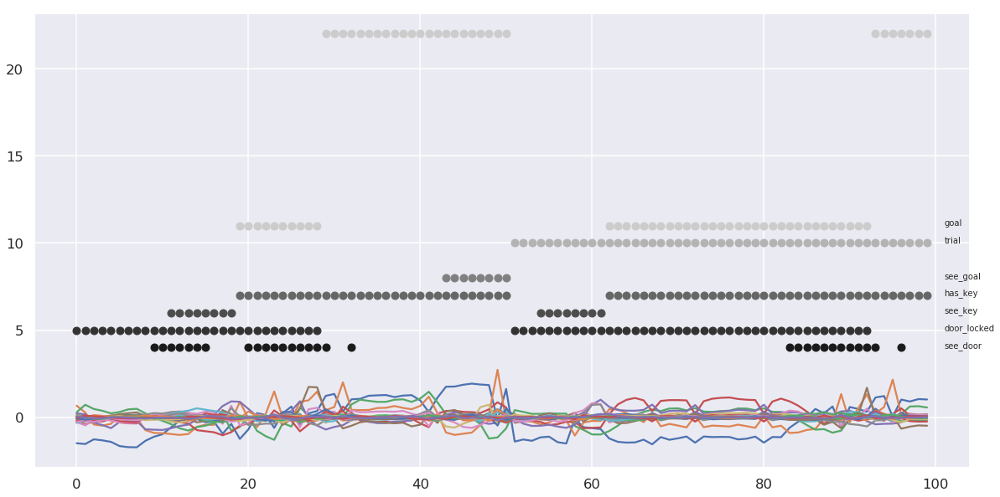

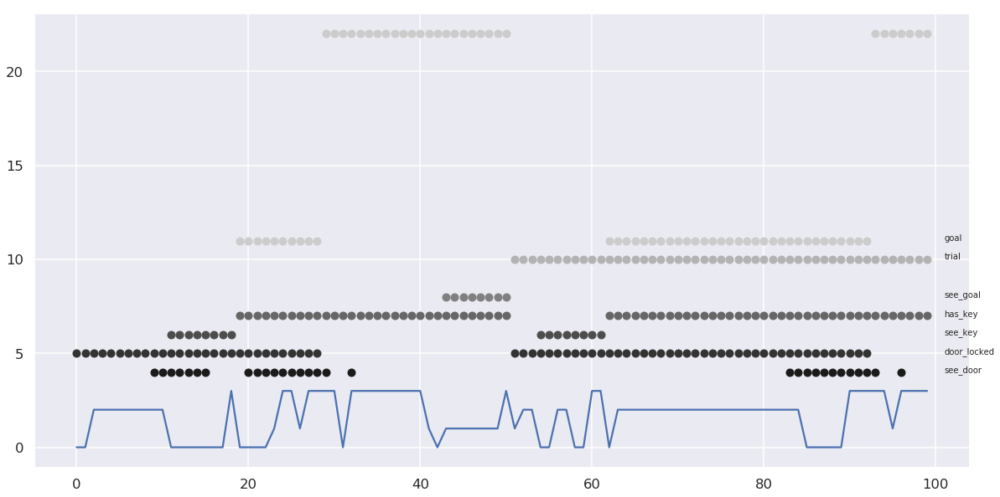

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 5, D: 1


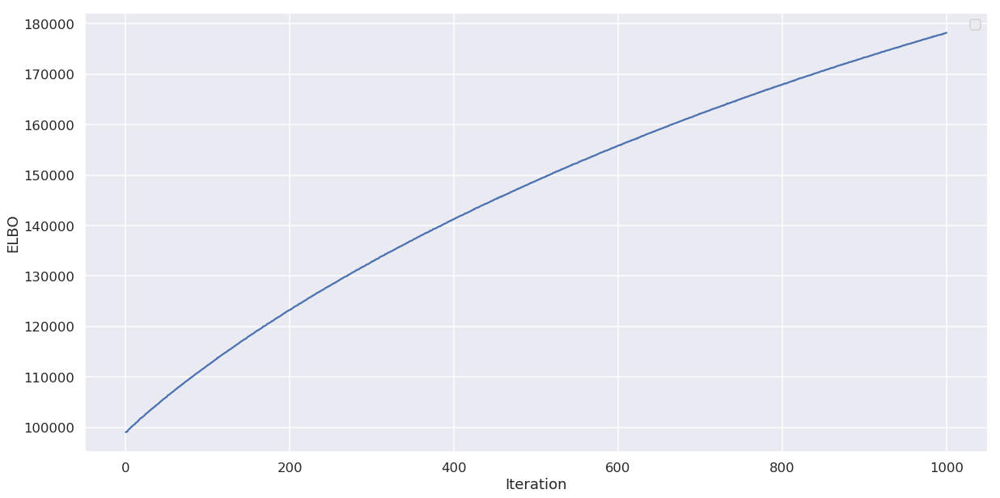

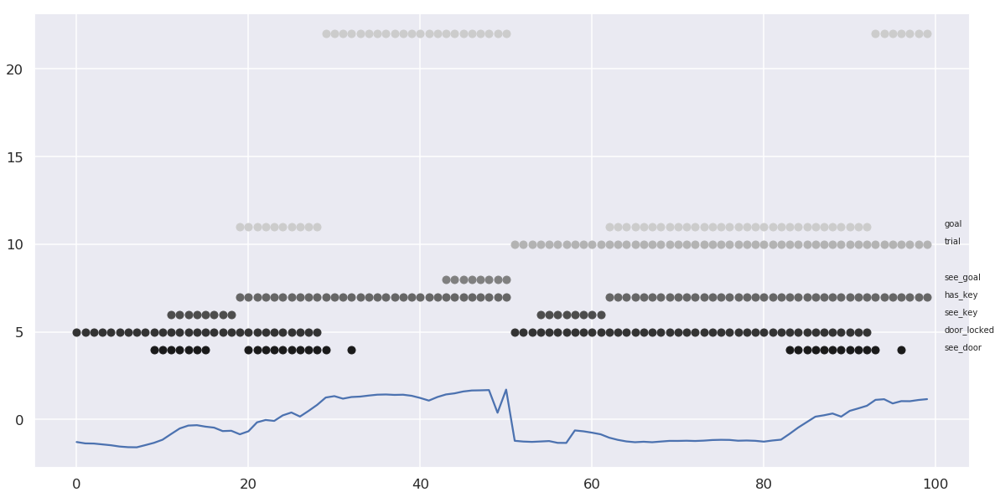

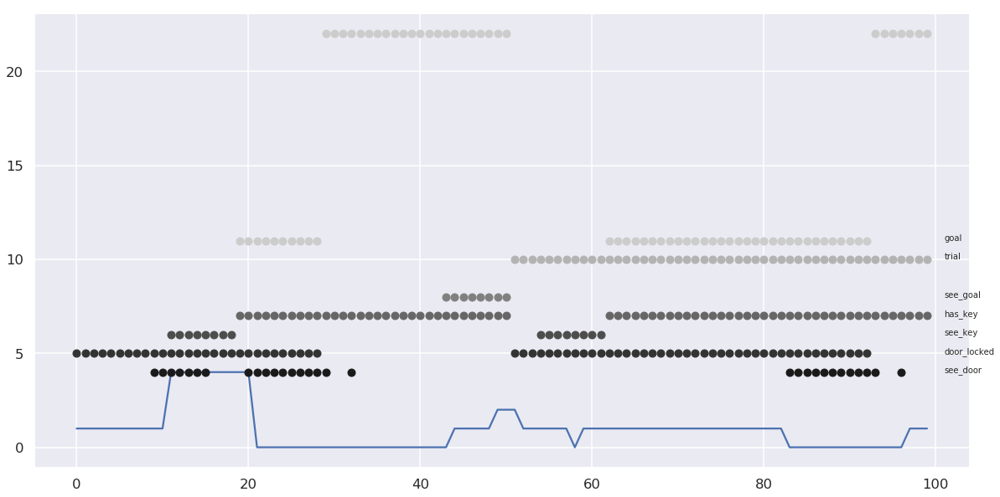

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 5, D: 3


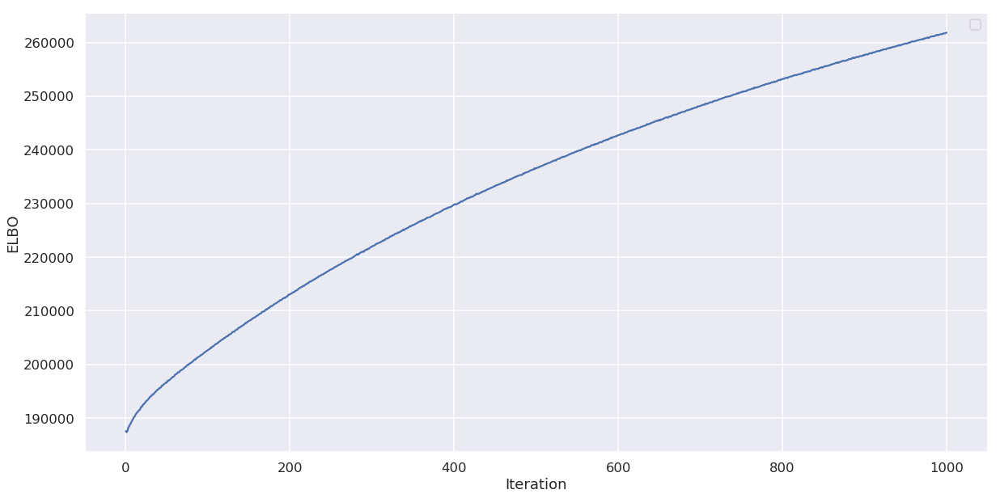

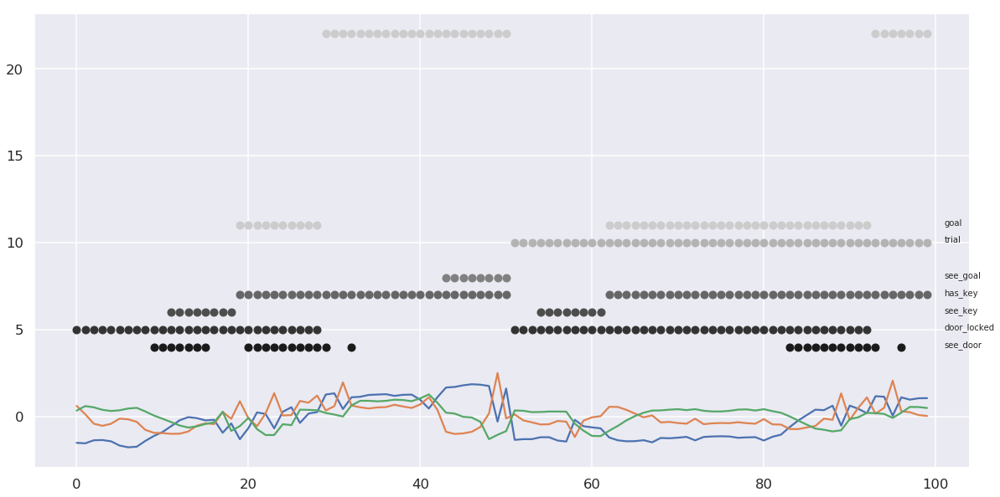

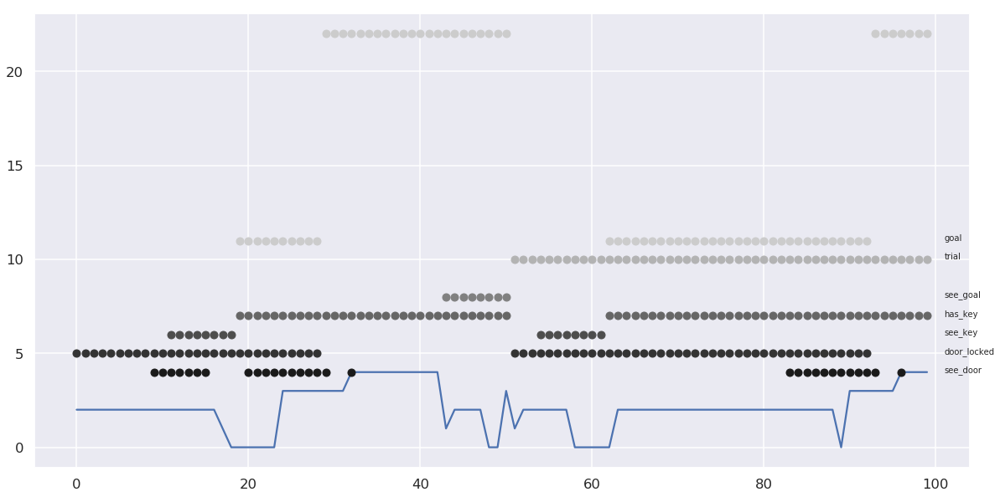

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 5, D: 5


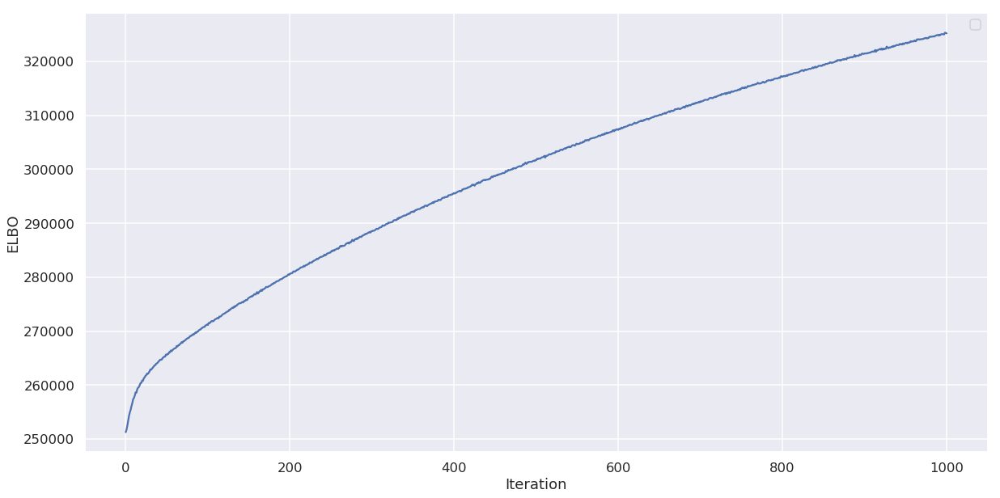

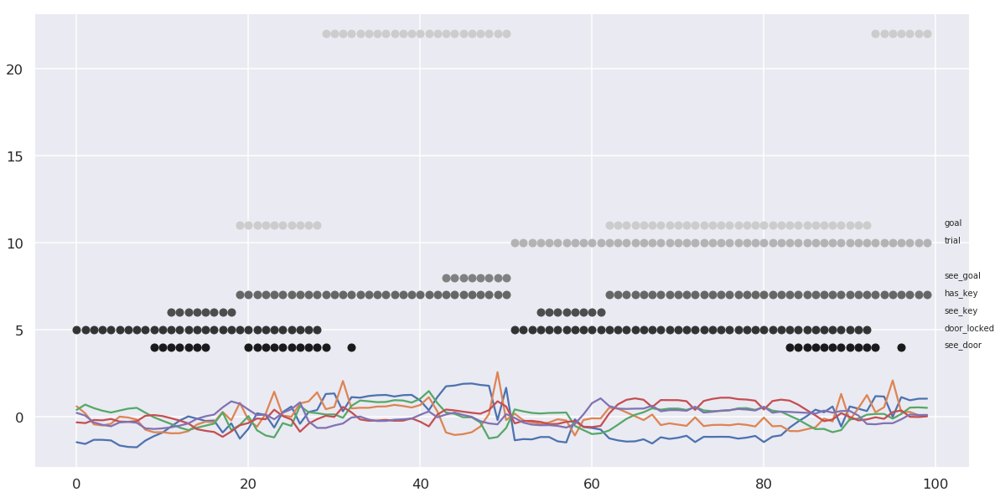

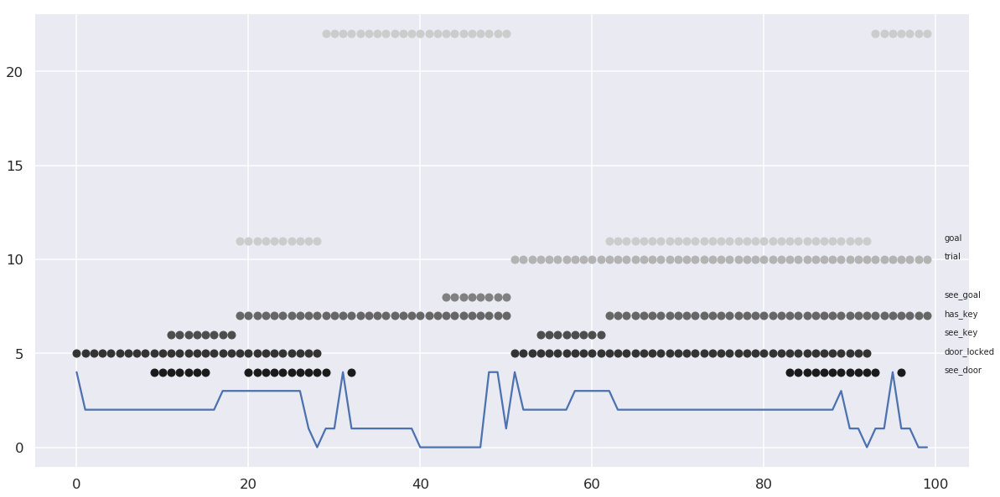

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 5, D: 7


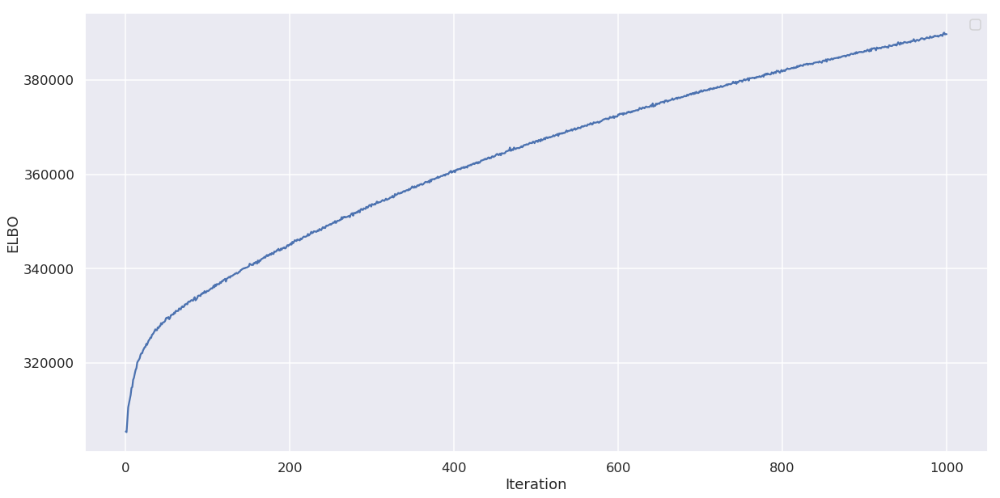

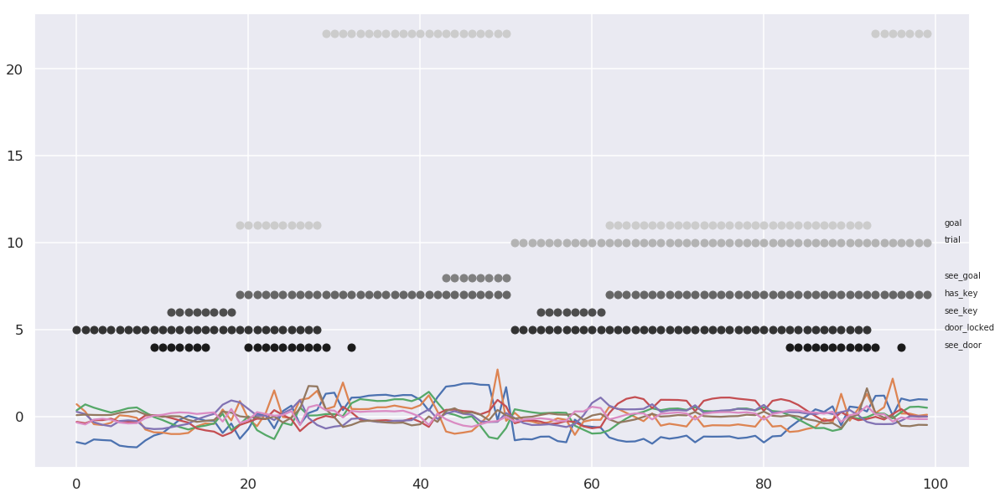

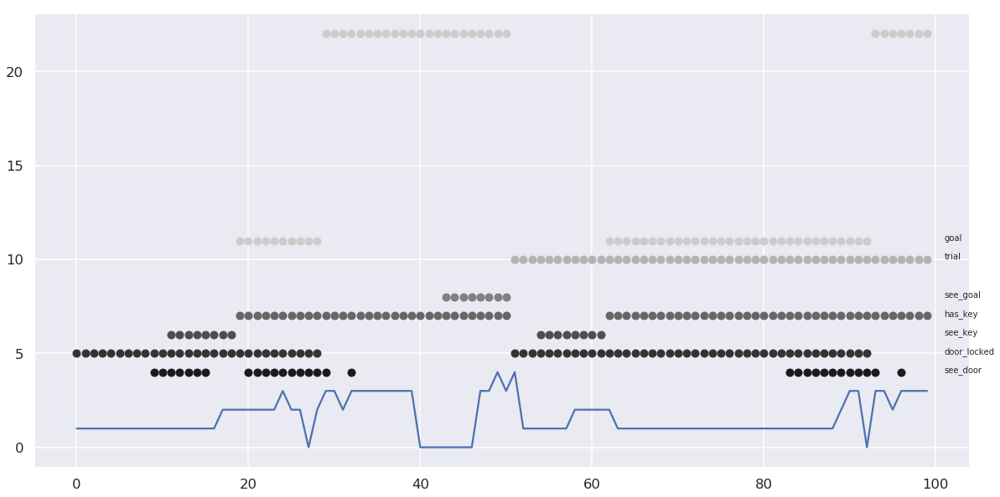

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 5, D: 10


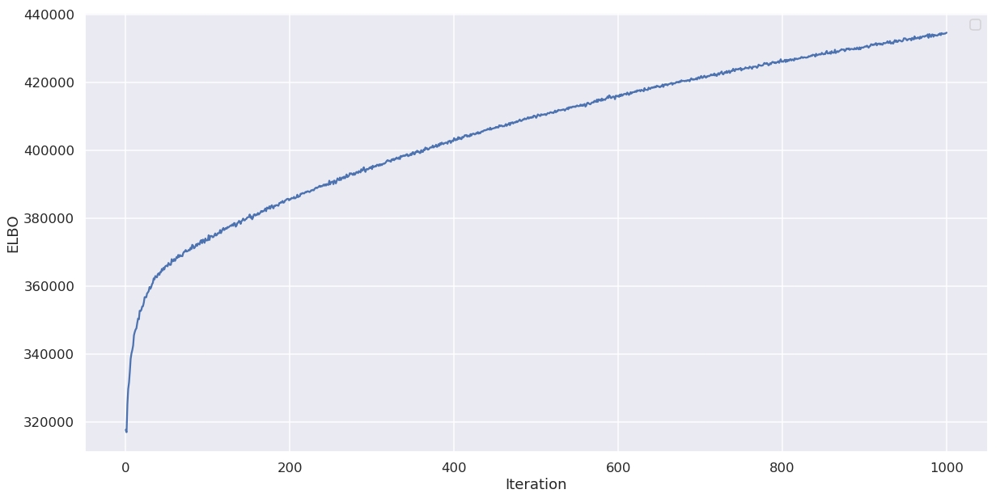

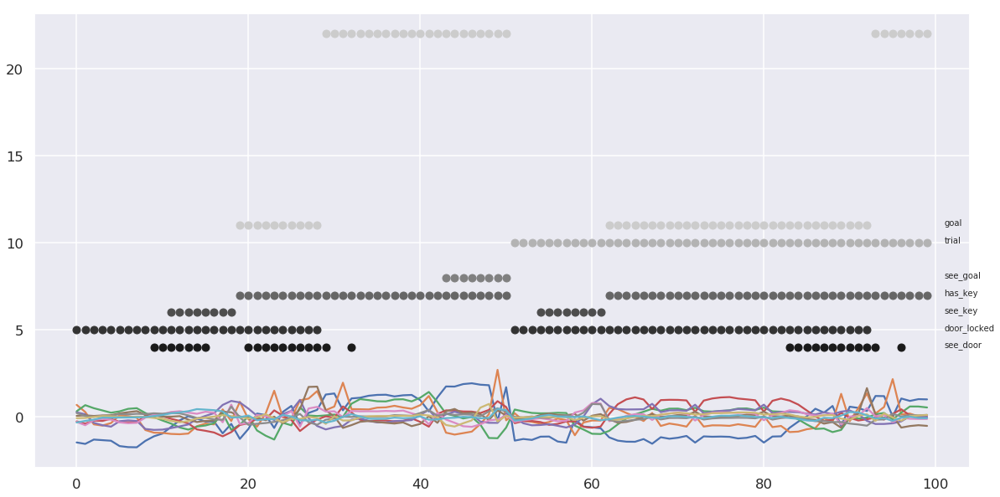

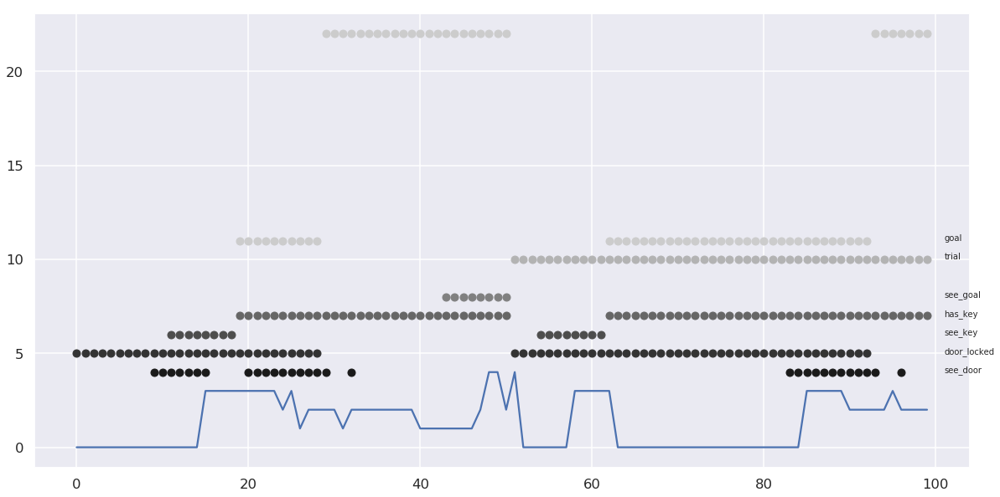

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 5, D: 15


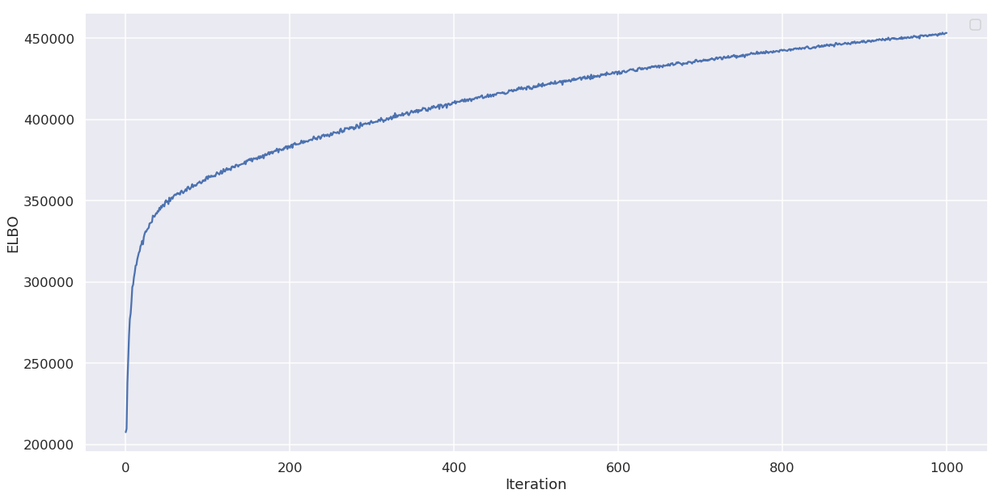

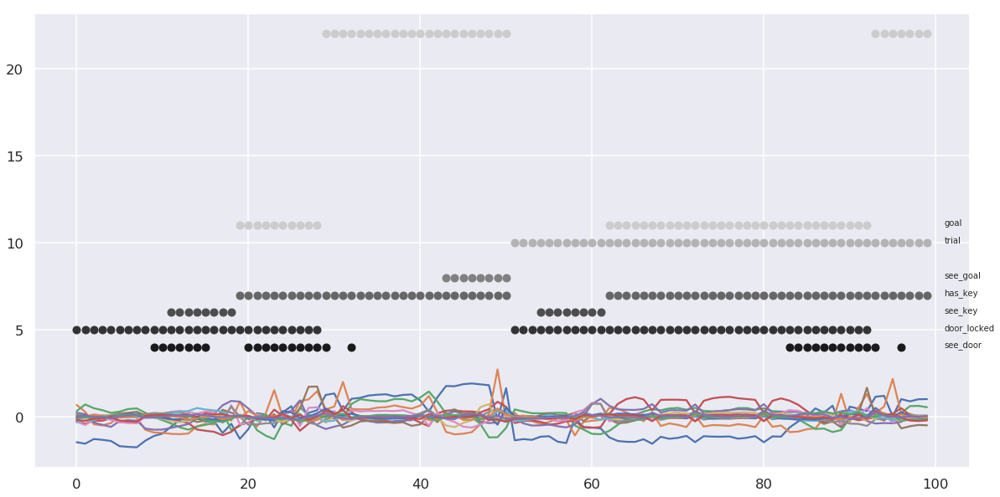

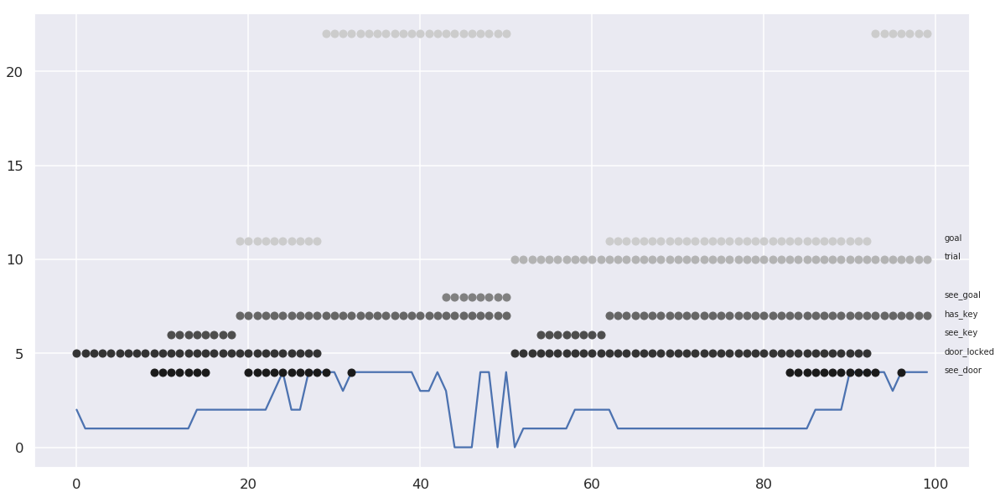

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 5, D: 25


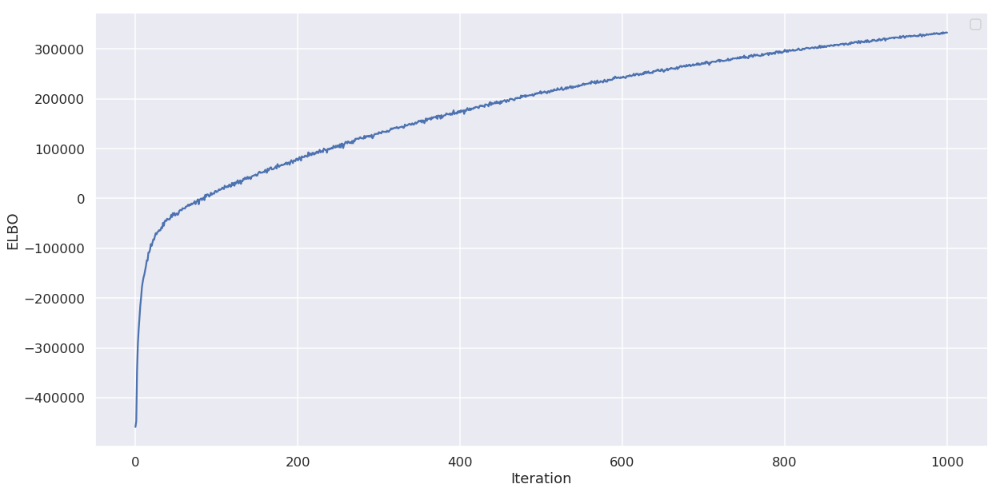

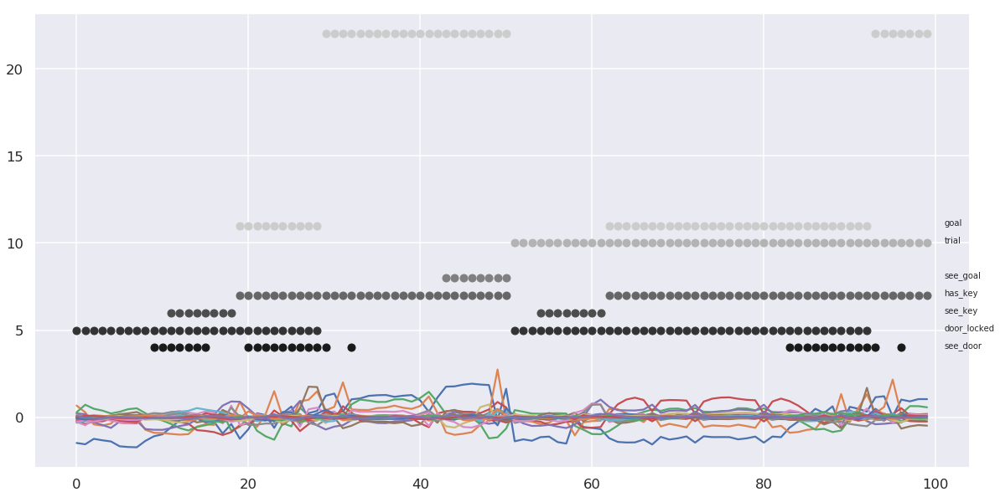

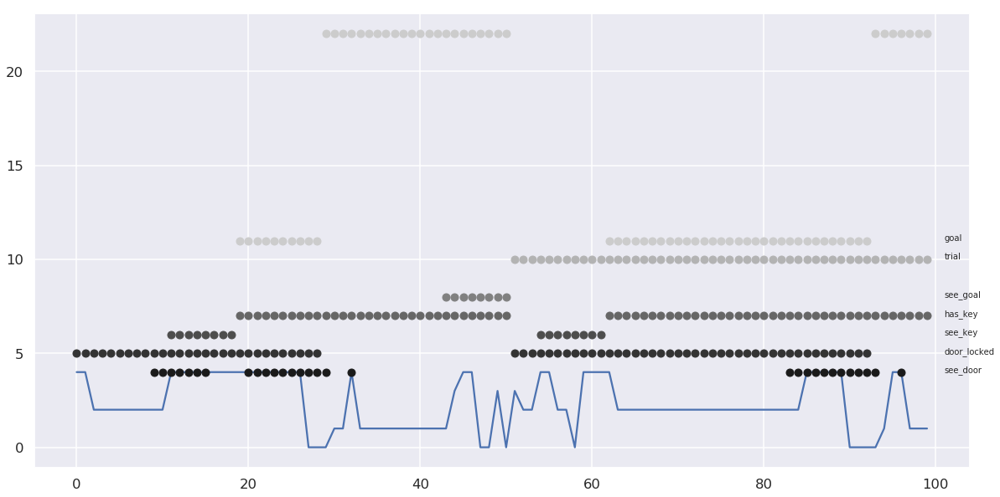

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 6, D: 1


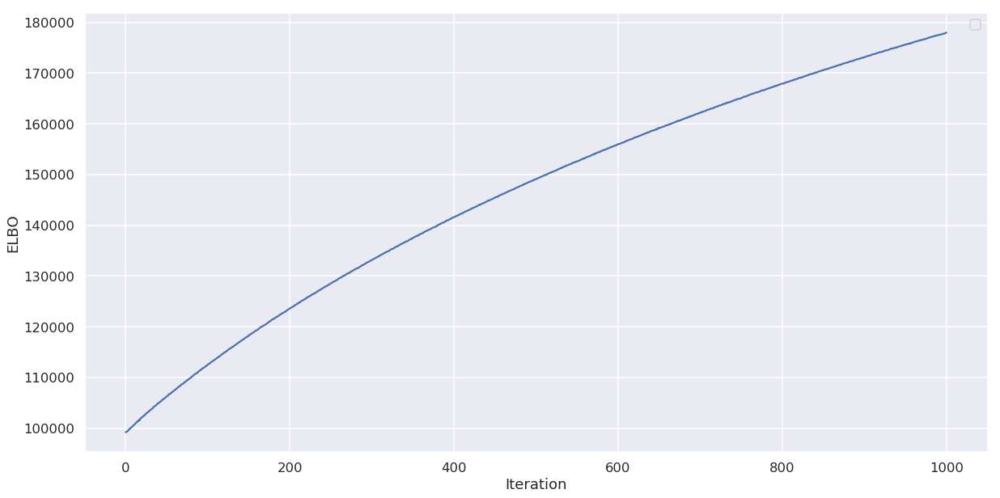

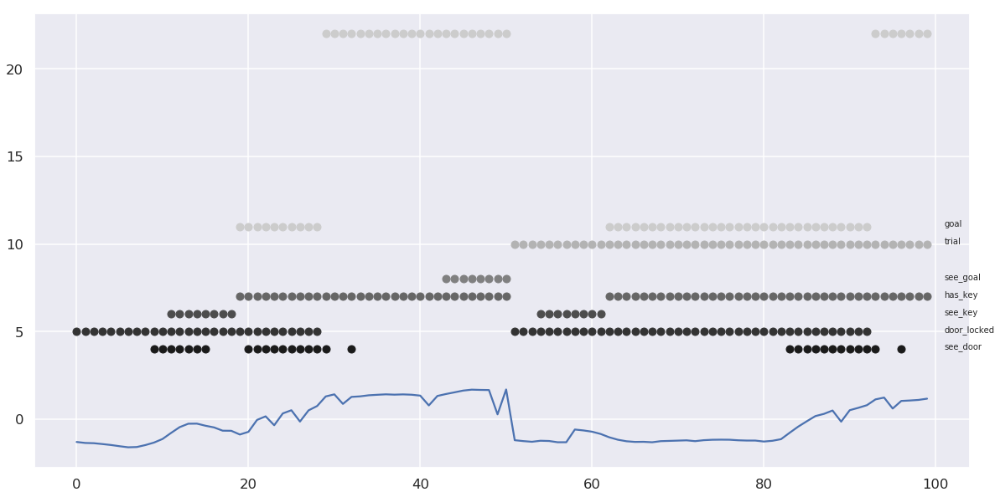

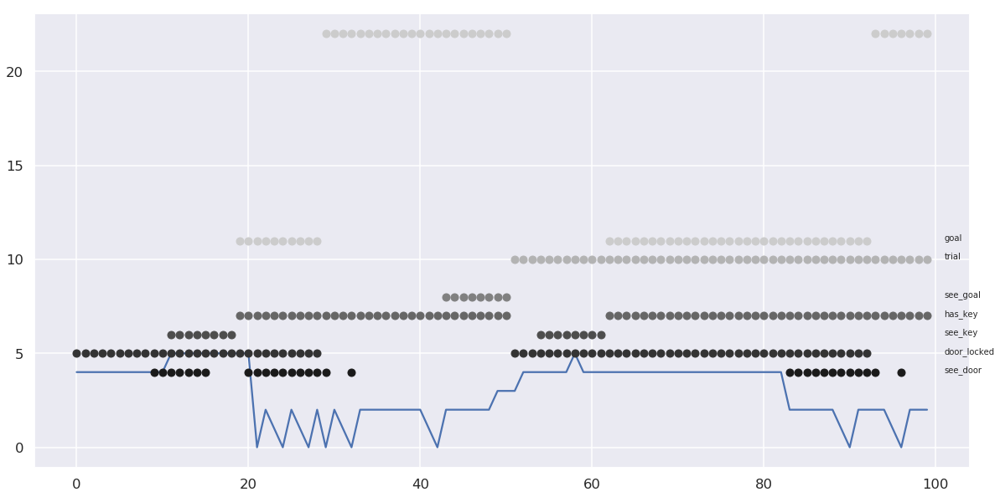

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 6, D: 3


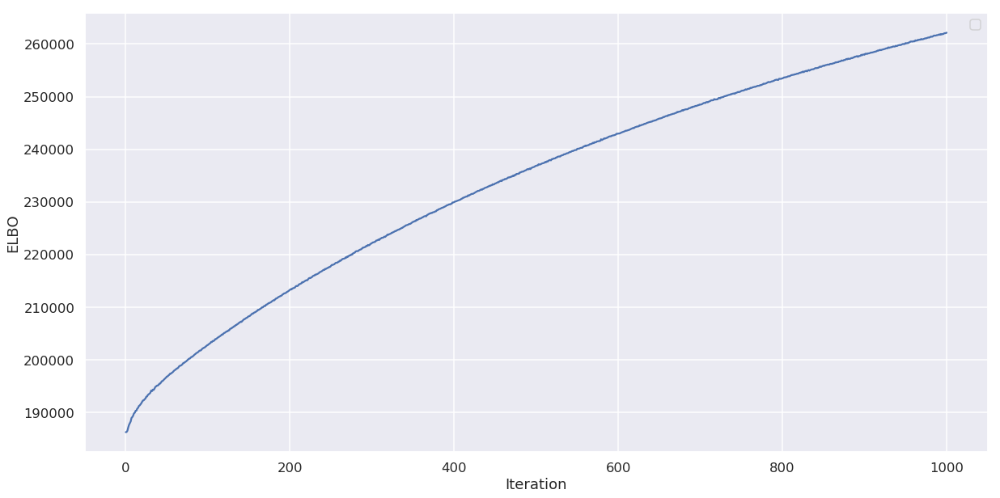

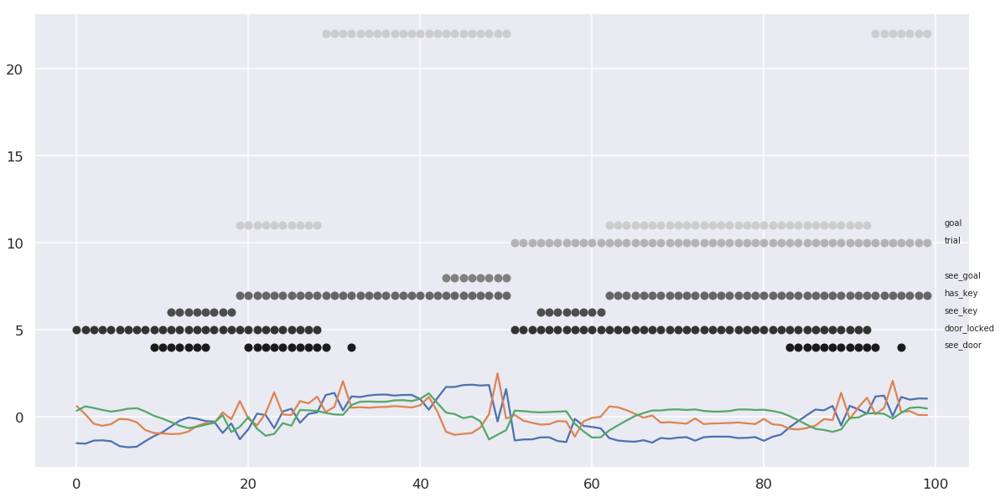

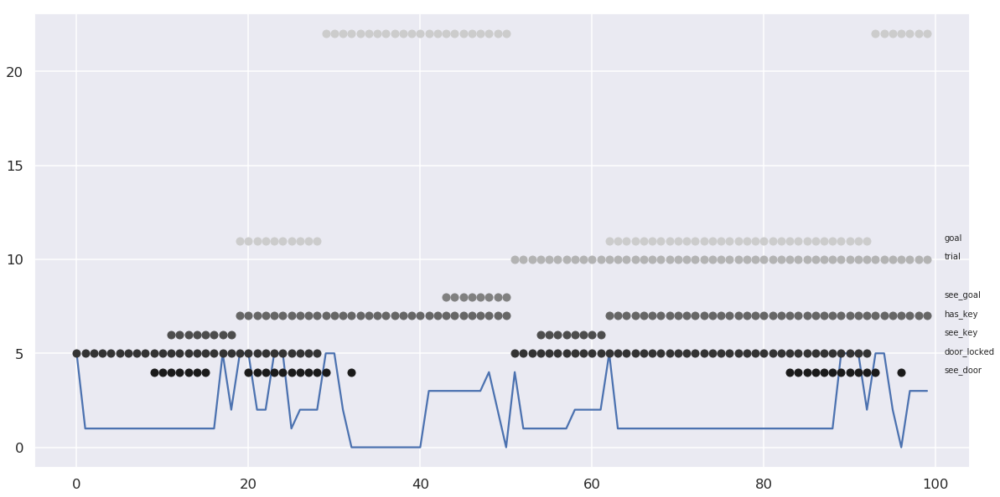

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 6, D: 5


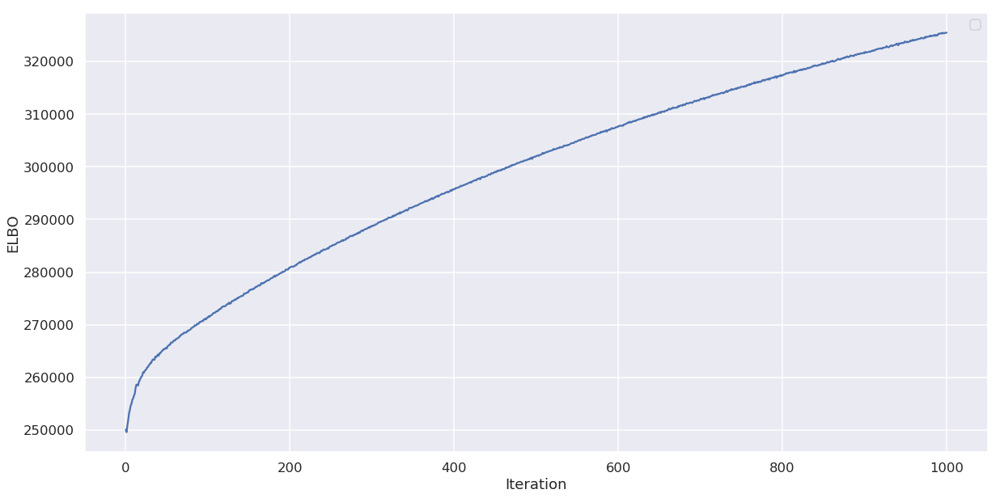

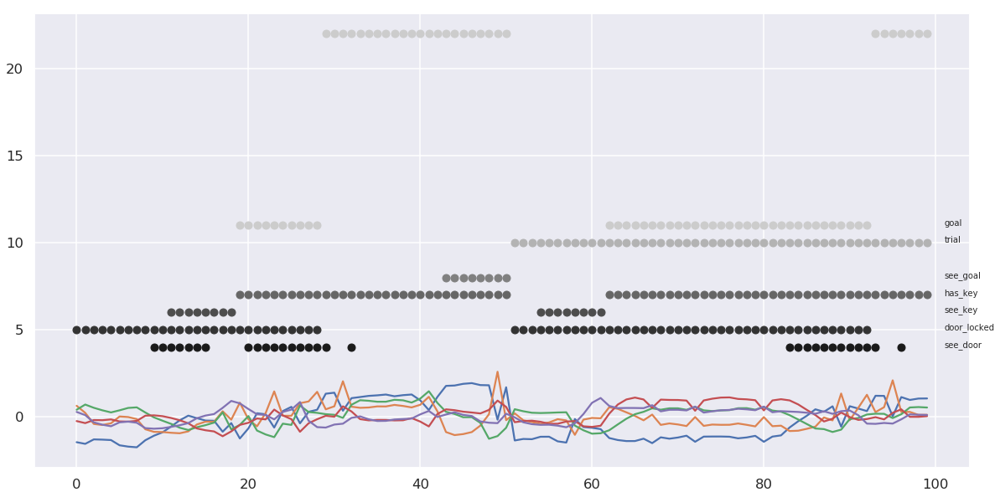

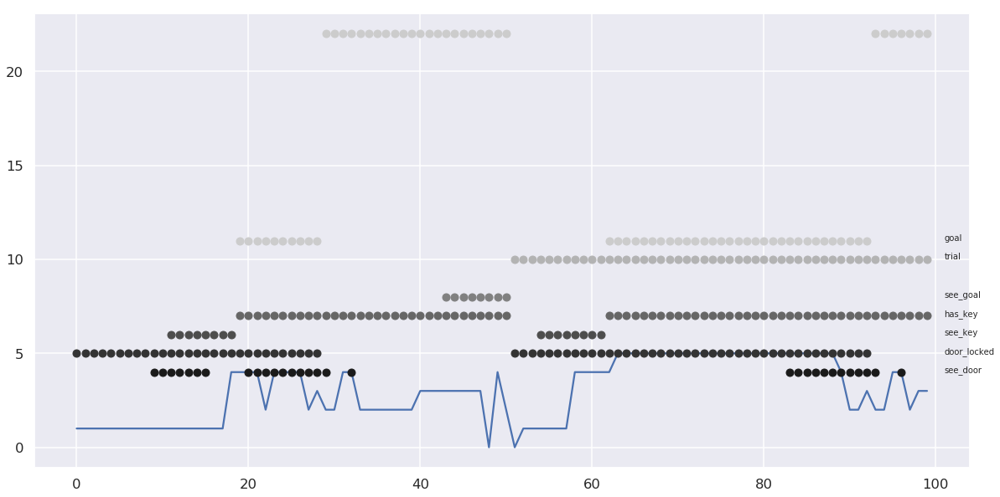

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 6, D: 7


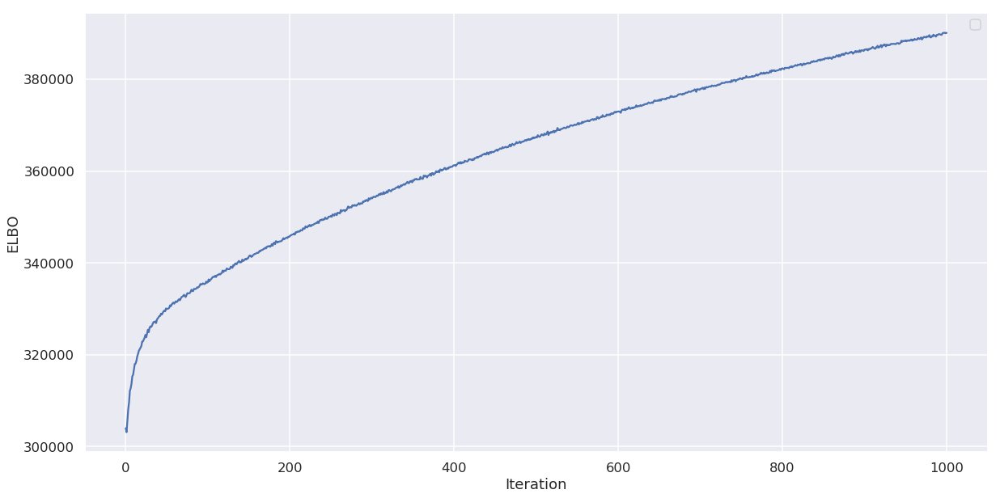

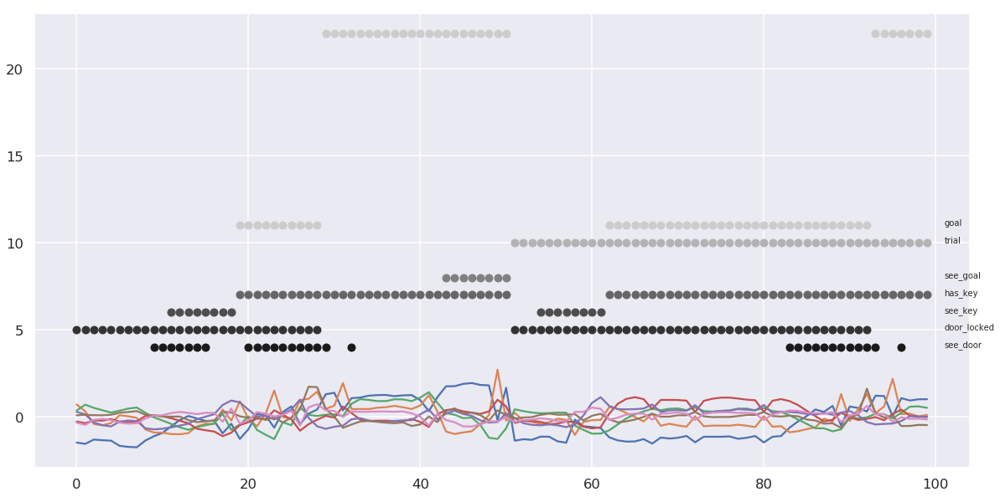

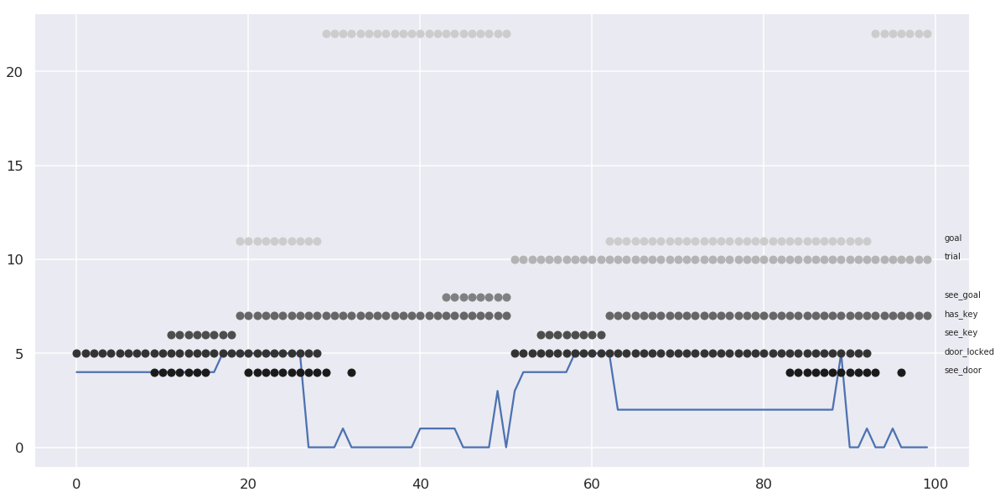

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 6, D: 10


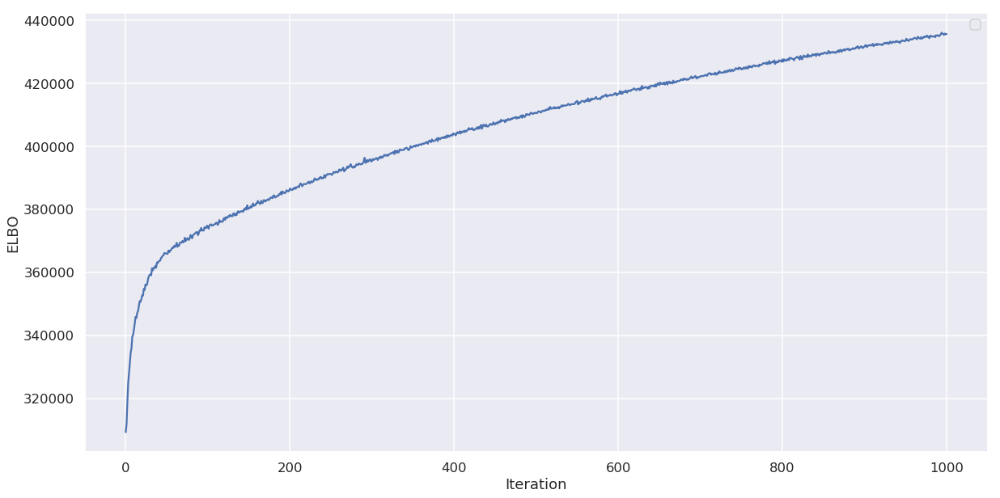

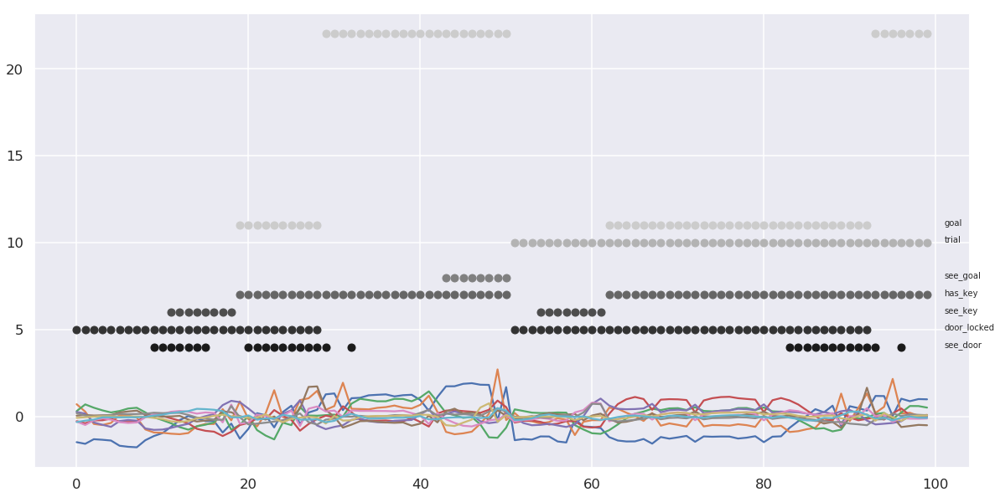

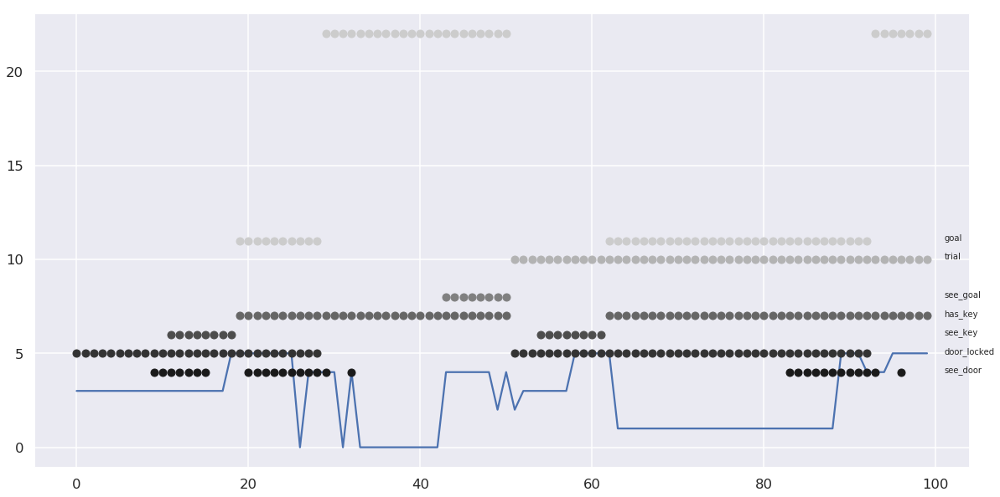

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 6, D: 15


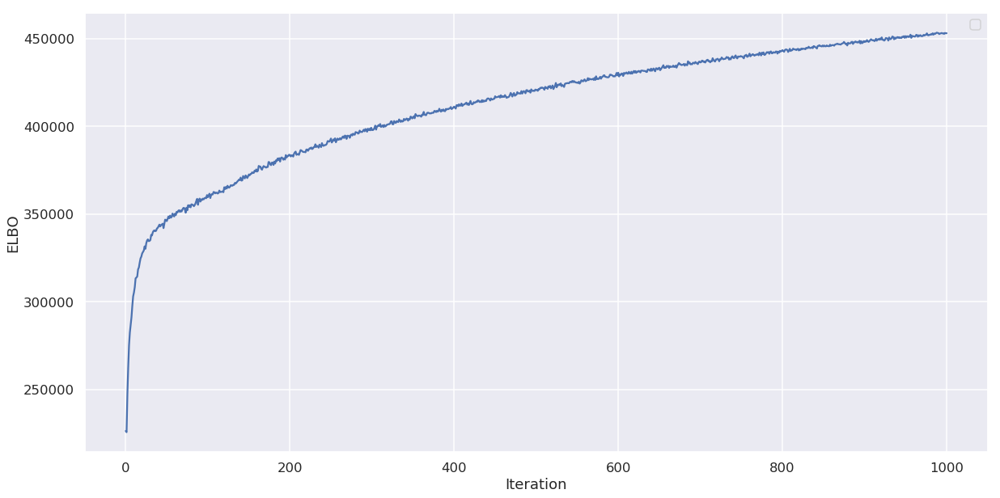

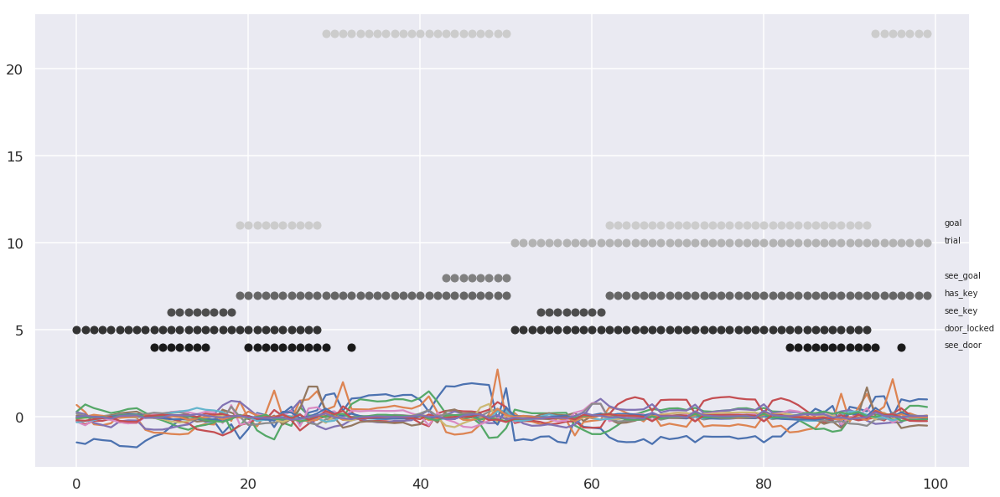

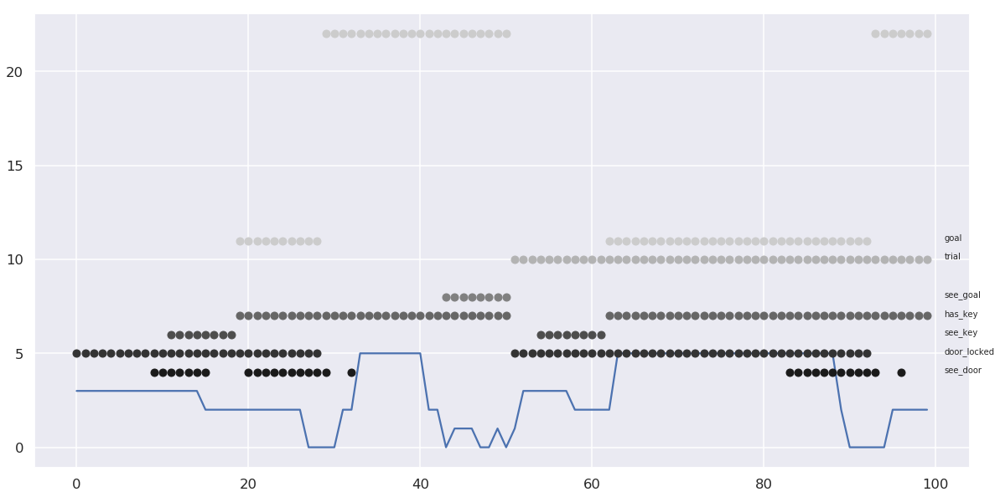

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 6, D: 25


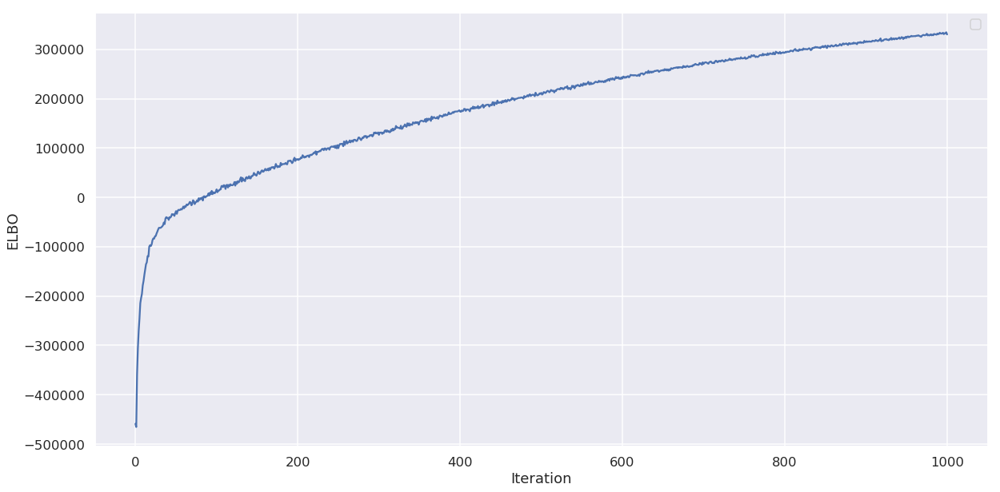

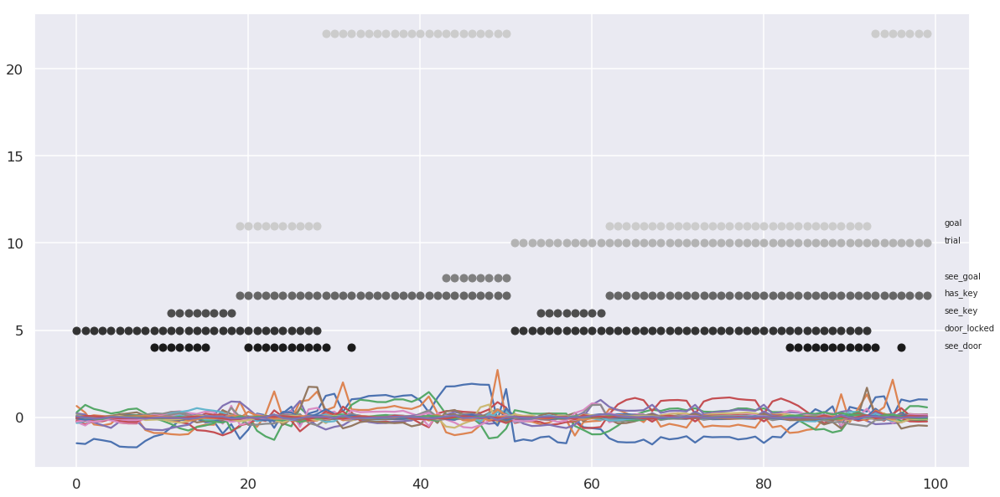

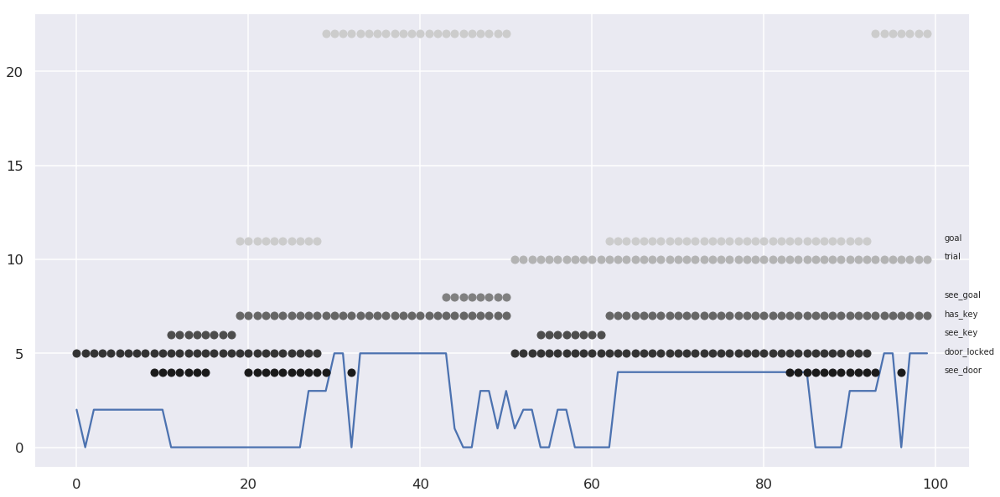

Initializing with an ARHMM using 25 steps of EM.


KeyboardInterrupt: 

In [106]:
for K in [3,4,5,6,7,8,9,10]:
    for D_latent in [1,3,5,7,10,15,25]:
        # model parameters
        T = lstm.shape[0]
#         K = 10
        D_obs = lstm.shape[-1]
#         D_latent = 10

        # Fit a robust rSLDS with its default initialization
        rslds = ssm.SLDS(D_obs, K, D_latent,
#                      transitions="recurrent",
#                      dynamics="gaussian",
#                      emissions="gaussian",
                     single_subspace=True)

        rslds.initialize(lstm)

        # Uncomment this to fit with stochastic variational inference instead
        q_svi = SLDSTriDiagVariationalPosterior(rslds, lstm)
        elbos = rslds.fit(q_svi, lstm, method="svi", num_iters=1000, initialize=False)
        xhat = q_svi.mean[0]
        zhat = rslds.most_likely_states(xhat, lstm)

        print('K: {}, D: {}'.format(K,D_latent))
        
        # Plot some results
        plt.figure()
        plt.plot(elbos)
        plt.legend()
        plt.xlabel("Iteration")
        plt.ylabel("ELBO")
        plt.show()

        
        # and estimated trajectories
        plt.plot(xhat[:100])
        for j, key in enumerate(annotation_data.keys()):
            if ('Unnamed' in key) or ('DIR' in key):
                pass
            else:
                k = (j+3)
                x,y = get_annotations(annotation_data, 100, k, key)
                plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
                plt.text(100+1, k, key)

        plt.show()

        # and estimated state
        plt.plot(zhat[:100])
        for j, key in enumerate(annotation_data.keys()):
            if ('Unnamed' in key) or ('DIR' in key):
                pass
            else:
                k = (j+3)
                x,y = get_annotations(annotation_data, 100, k, key)
                plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
                plt.text(100+1, k, key)

        plt.show()

Initializing with an ARHMM using 25 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


K: 5, D: 7


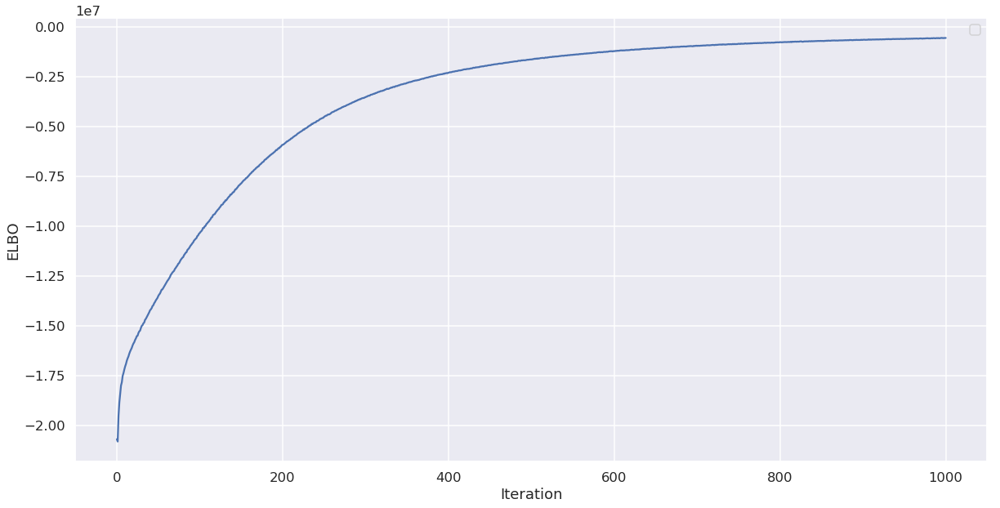

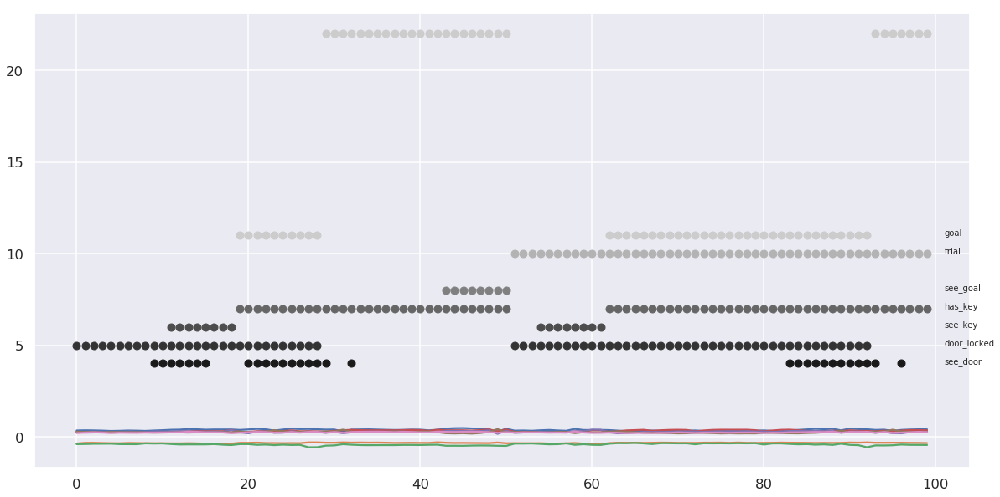

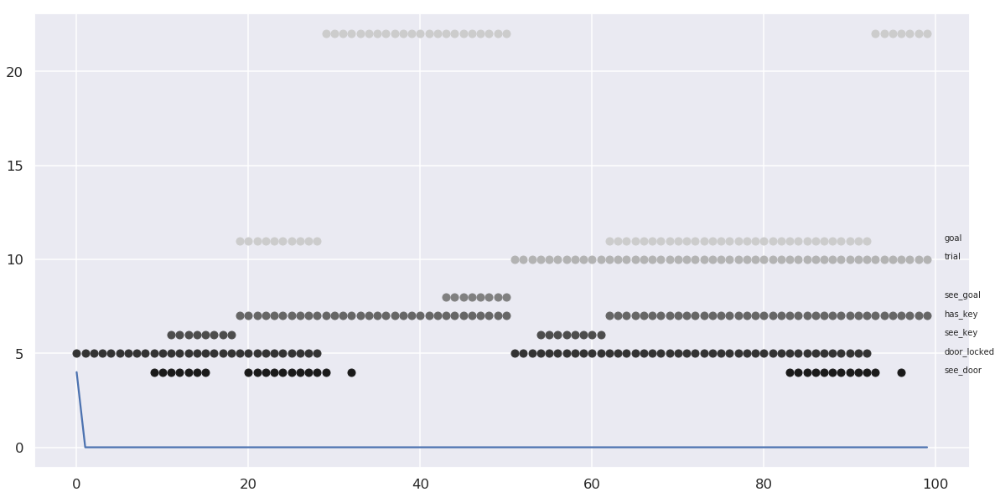

In [30]:
T = lstm.shape[0]
K = 5
D_obs = lstm.shape[-1]
D_latent = 7

# Fit a robust rSLDS with its default initialization
rslds = ssm.SLDS(D_obs, K, D_latent,
             transitions="recurrent",
             dynamics="gaussian",
             emissions="gaussian",
             single_subspace=True)

rslds.initialize(lstm)

# Uncomment this to fit with stochastic variational inference instead
q_svi = SLDSTriDiagVariationalPosterior(rslds, lstm)
elbos = rslds.fit(q_svi, lstm, method="svi", num_iters=1000, initialize=False)
xhat = q_svi.mean[0]
zhat = rslds.most_likely_states(xhat, lstm)

print('K: {}, D: {}'.format(K,D_latent))

# Plot some results
plt.figure()
plt.plot(elbos)
plt.legend()
plt.xlabel("Iteration")
plt.ylabel("ELBO")
plt.show()


# and estimated trajectories
plt.plot(xhat[:100])
for j, key in enumerate(annotation_data.keys()):
    if ('Unnamed' in key) or ('DIR' in key):
        pass
    else:
        k = (j+3)
        x,y = get_annotations(annotation_data, 100, k, key)
        plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
        plt.text(100+1, k, key)

plt.show()

# and estimated state
plt.plot(zhat[:100])
for j, key in enumerate(annotation_data.keys()):
    if ('Unnamed' in key) or ('DIR' in key):
        pass
    else:
        k = (j+3)
        x,y = get_annotations(annotation_data, 100, k, key)
        plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
        plt.text(100+1, k, key)

plt.show()

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 7, D: 1


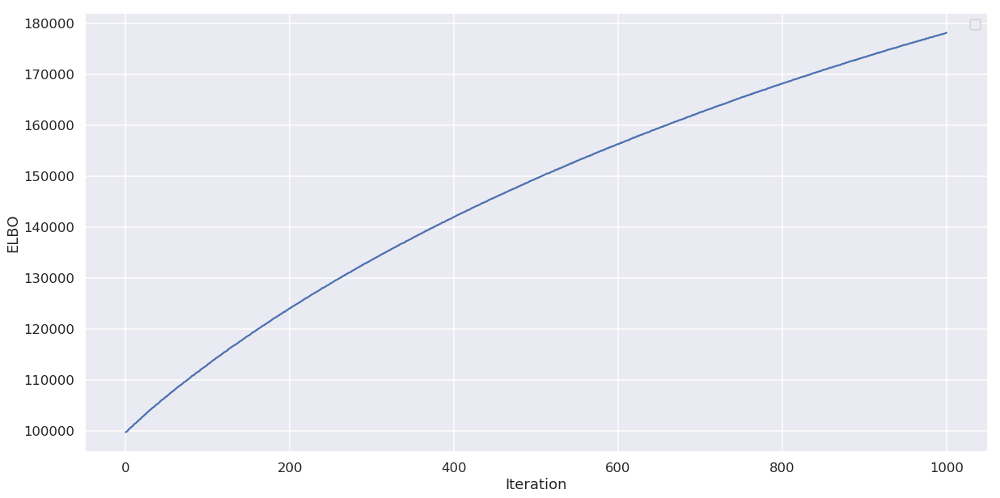

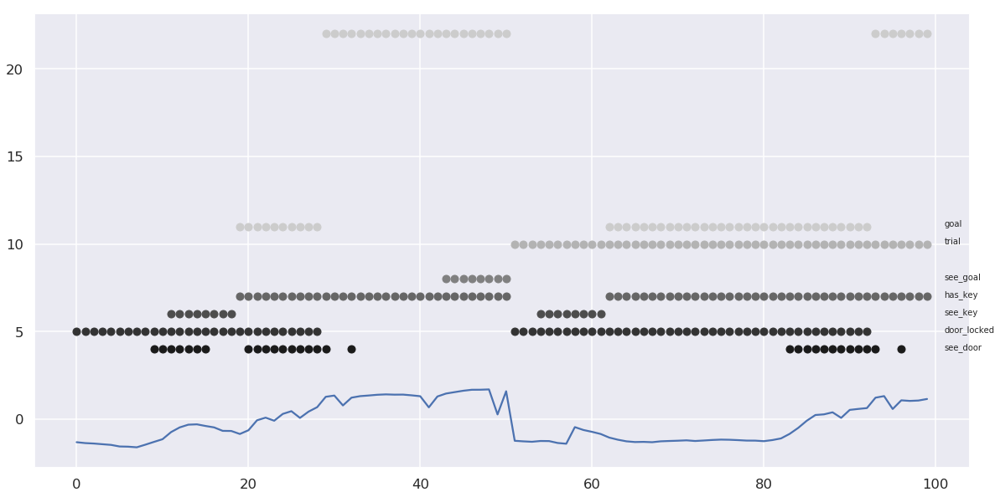

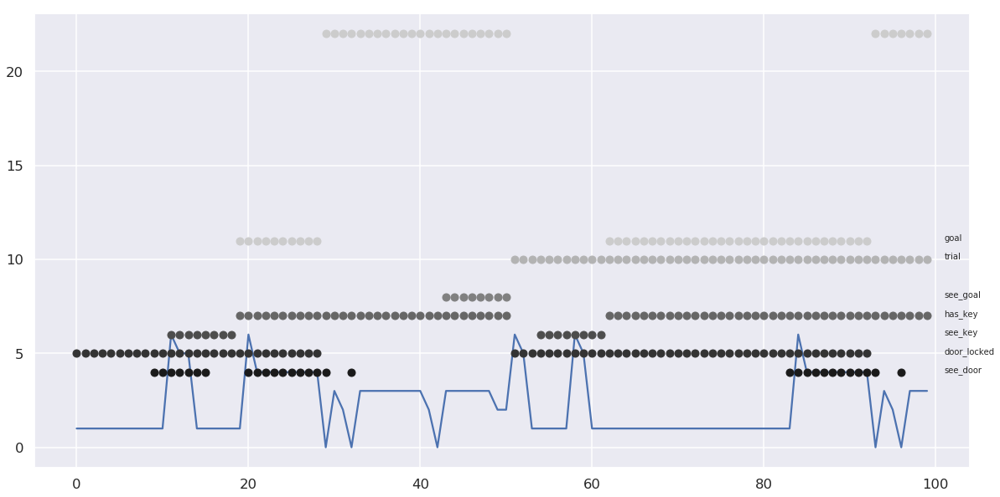

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 7, D: 3


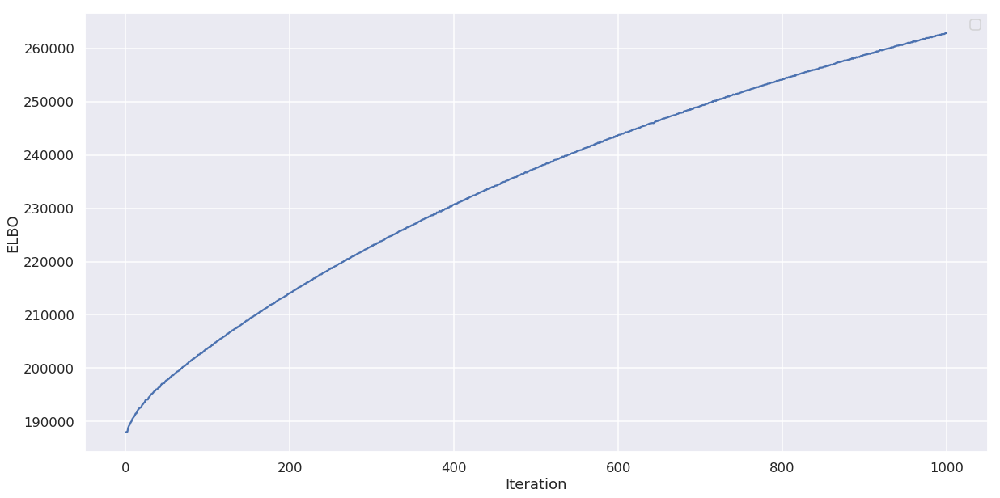

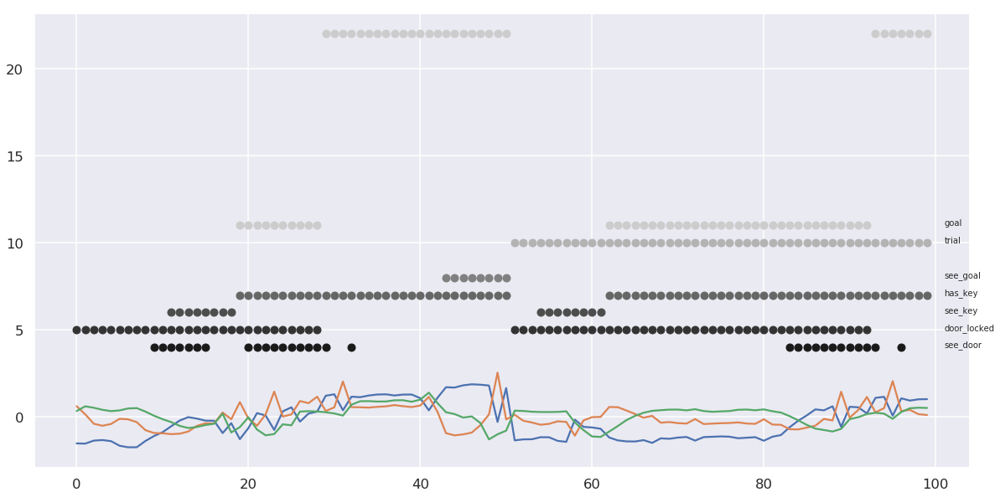

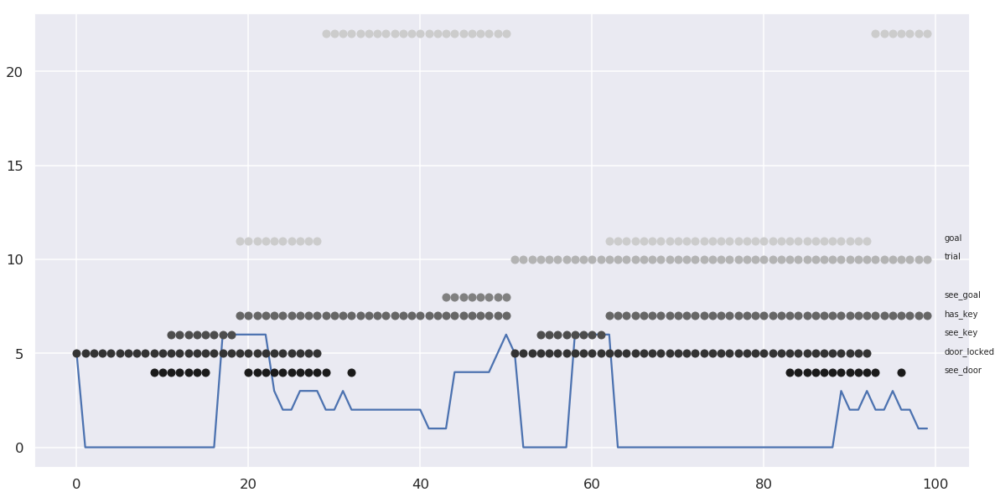

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 7, D: 5


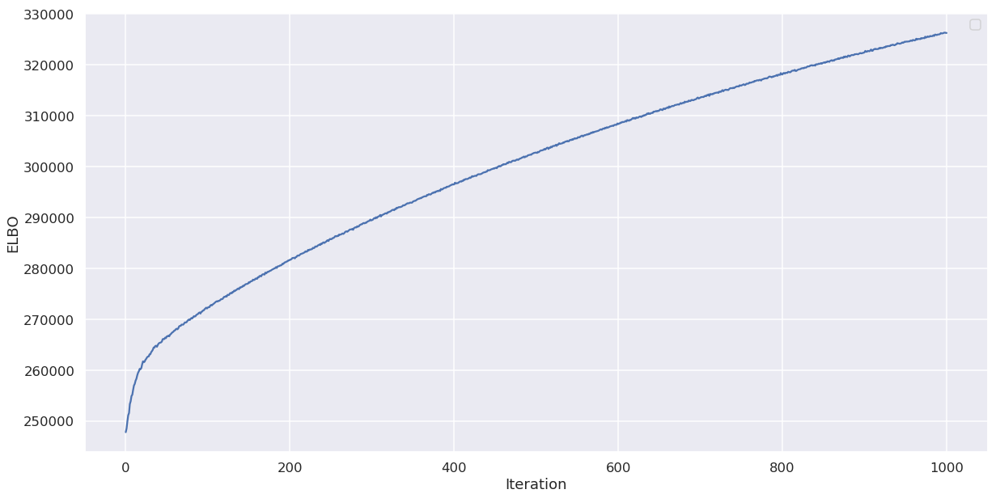

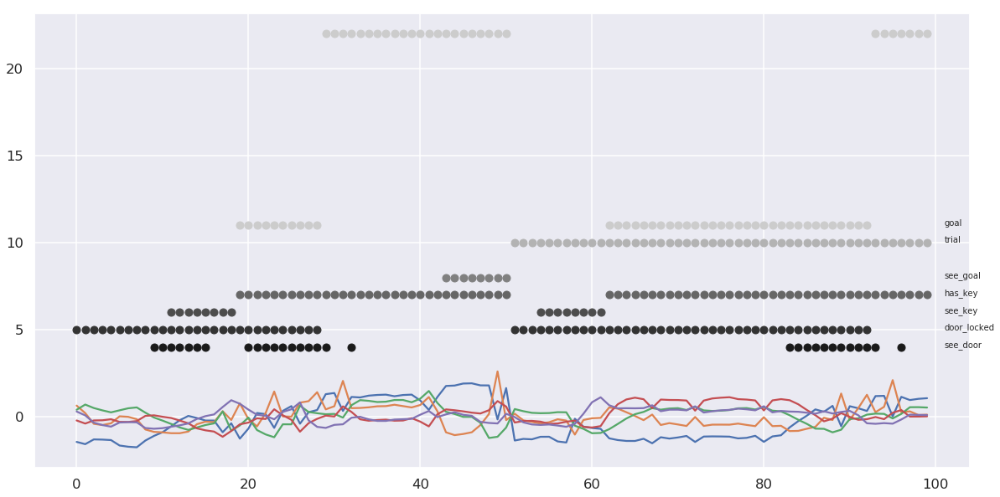

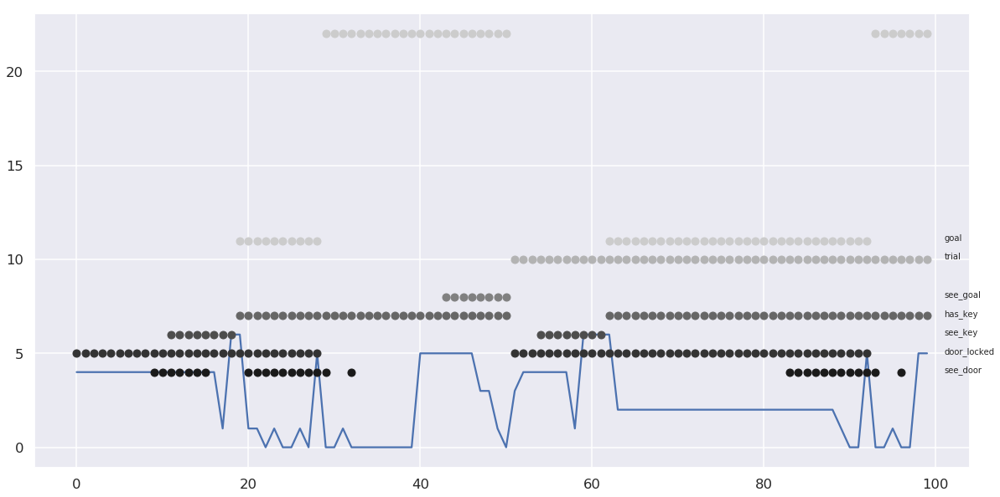

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 7, D: 10


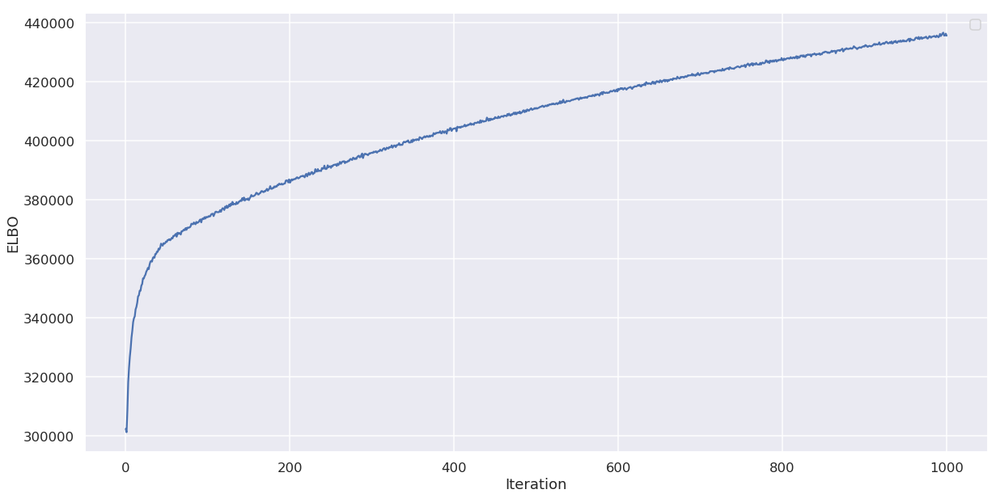

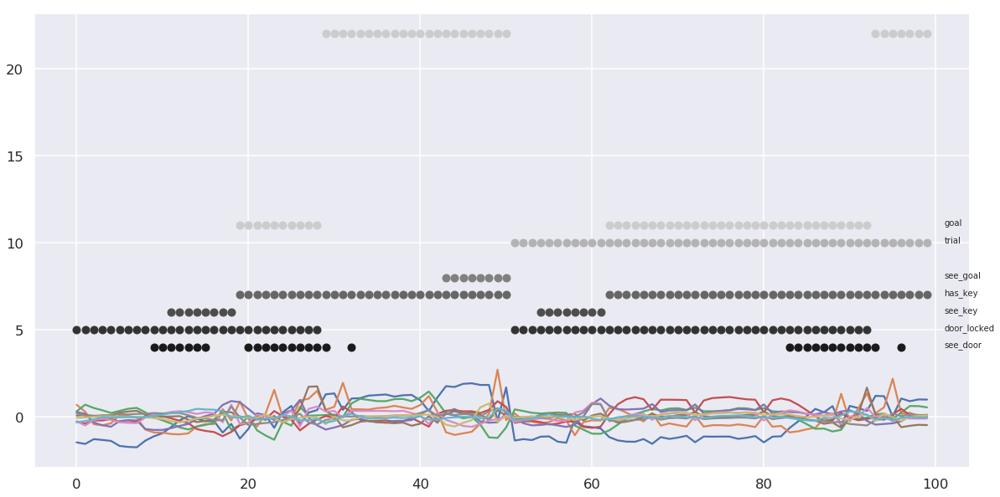

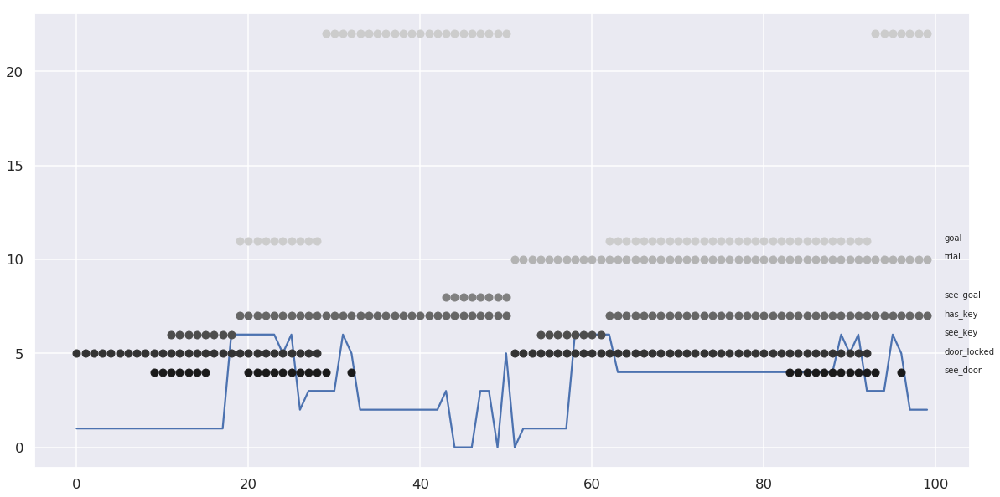

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 7, D: 15


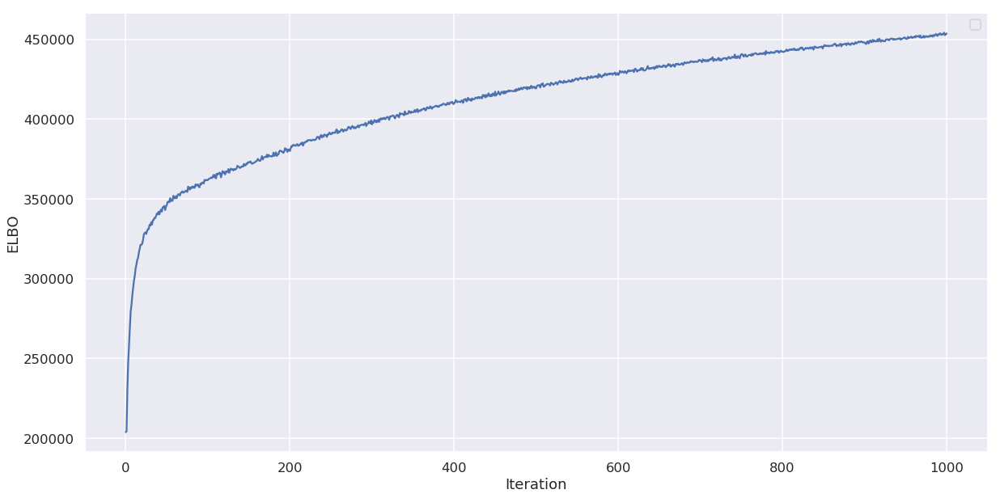

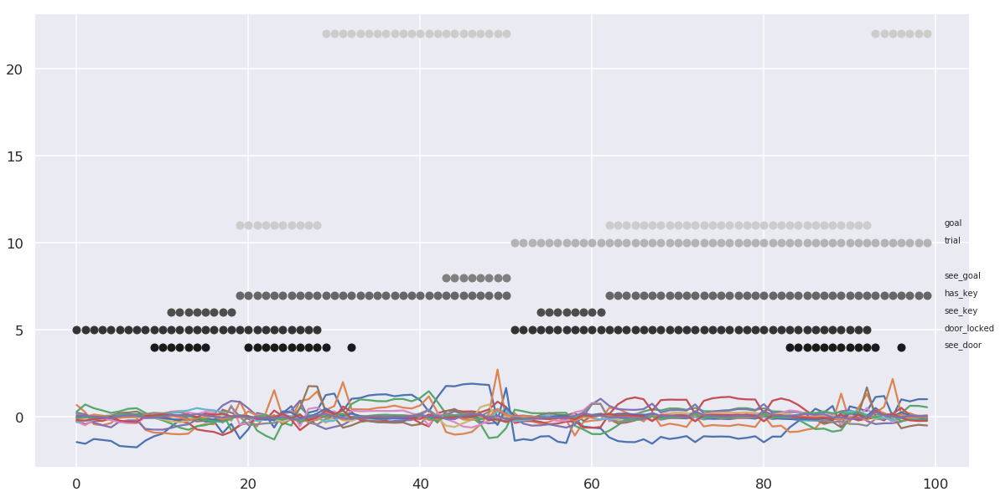

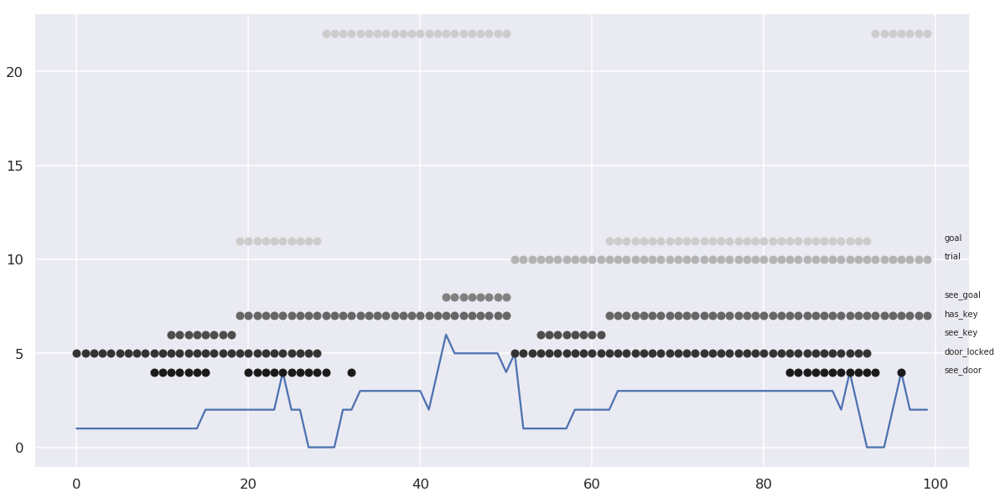

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 10, D: 1


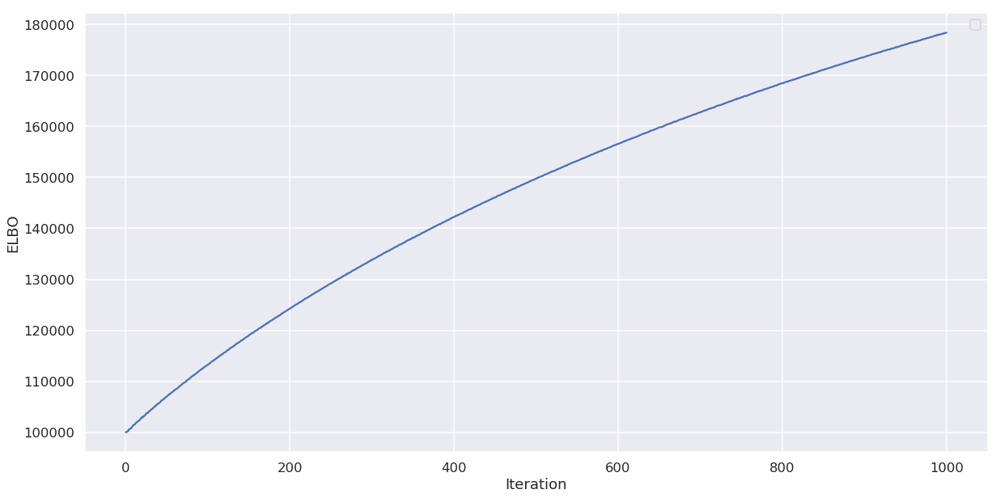

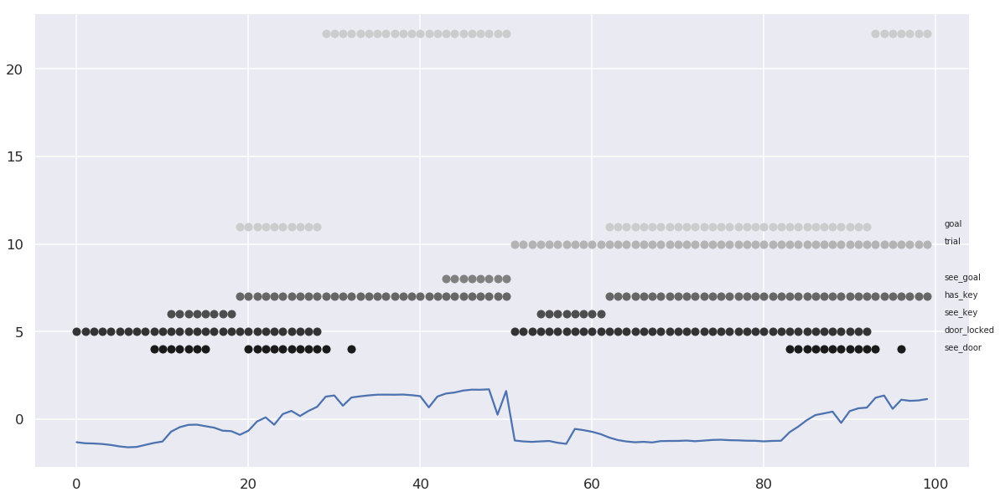

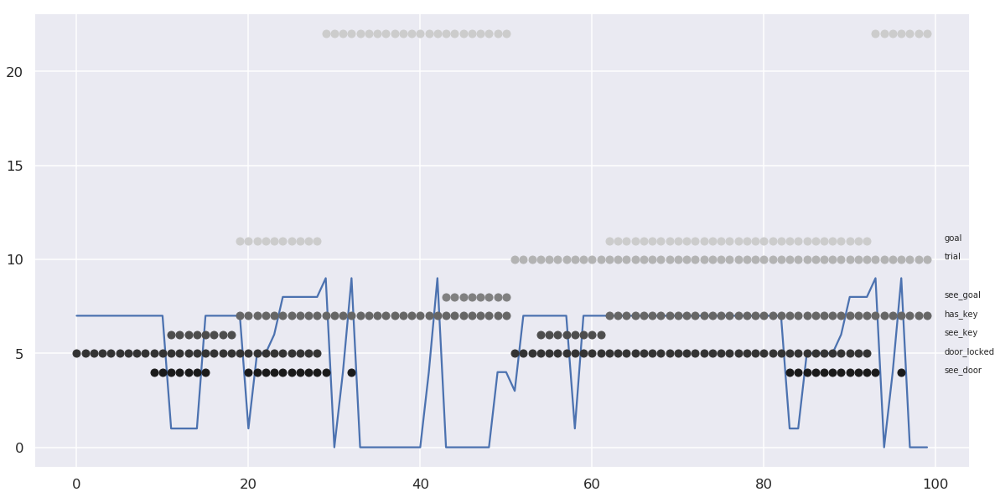

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 10, D: 3


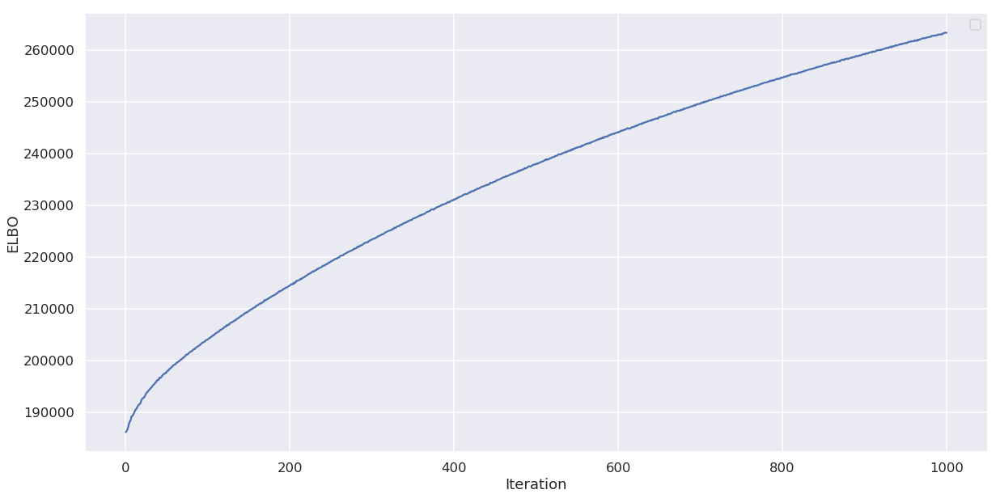

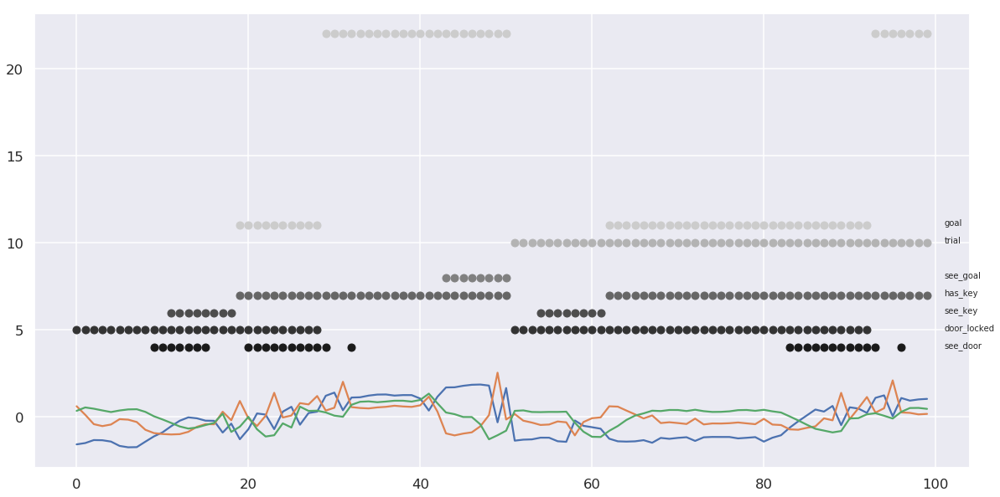

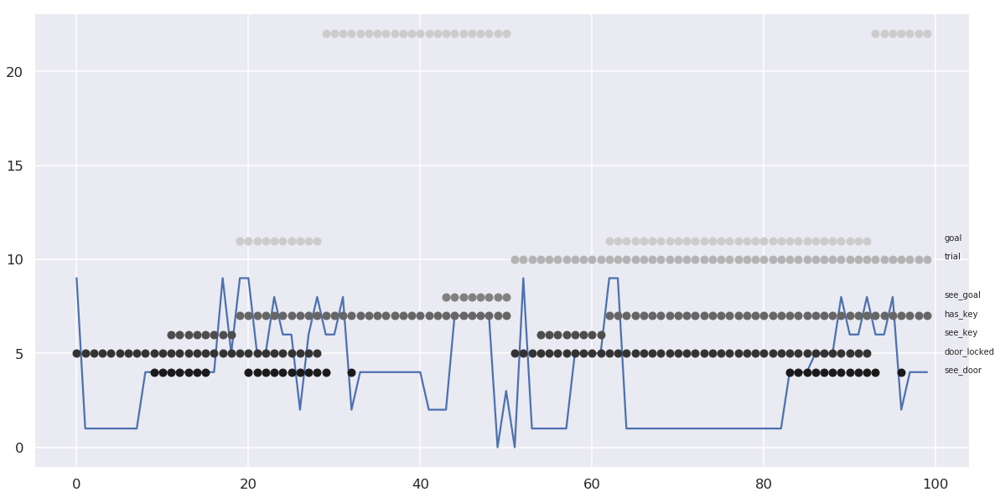

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 10, D: 5


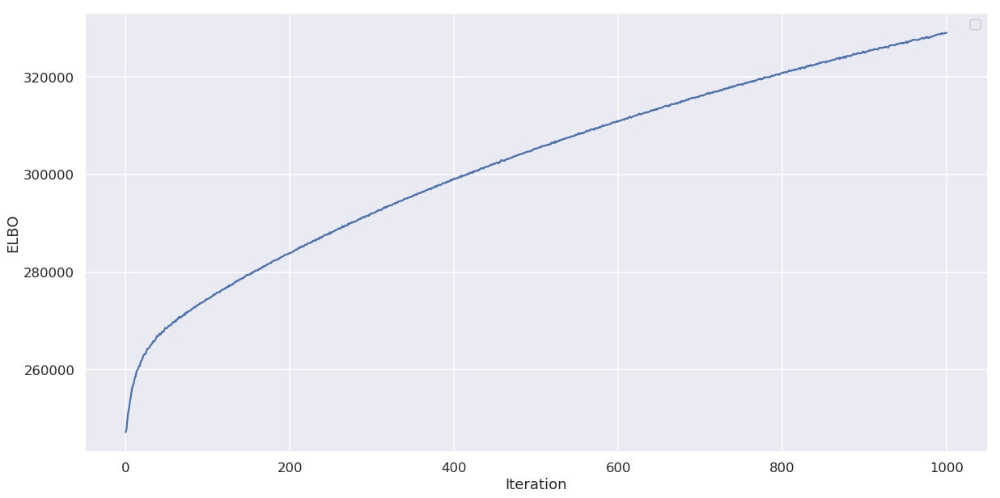

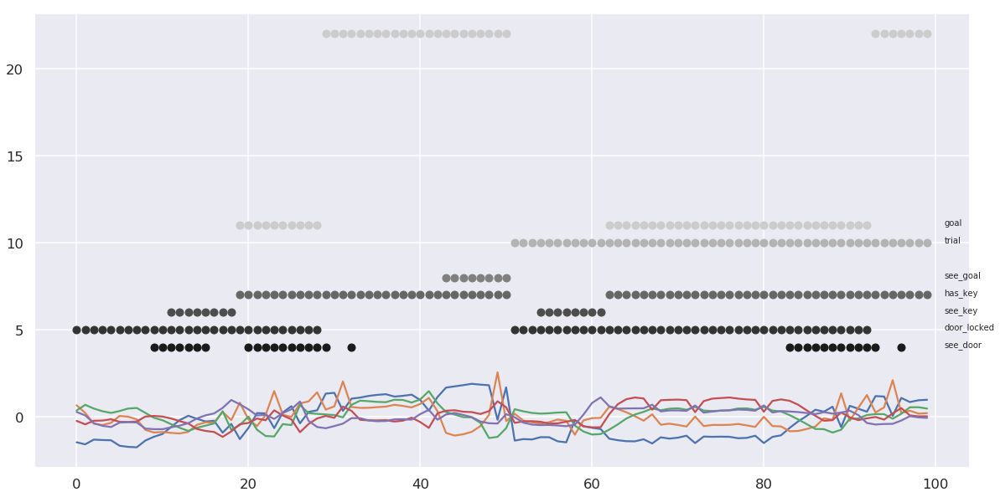

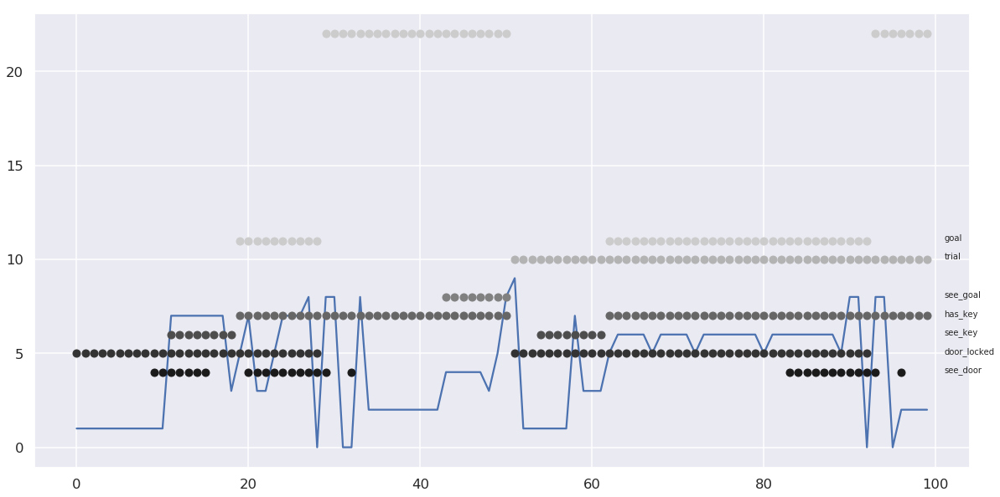

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 10, D: 10


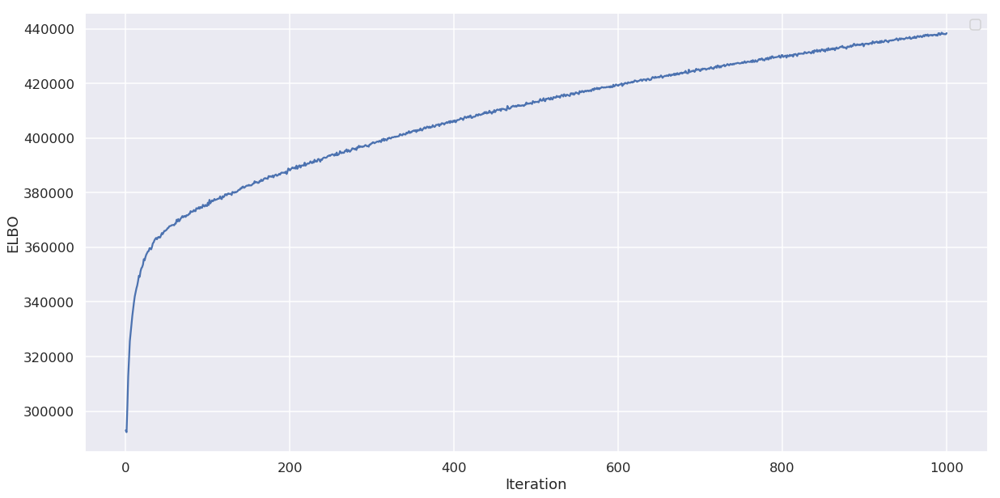

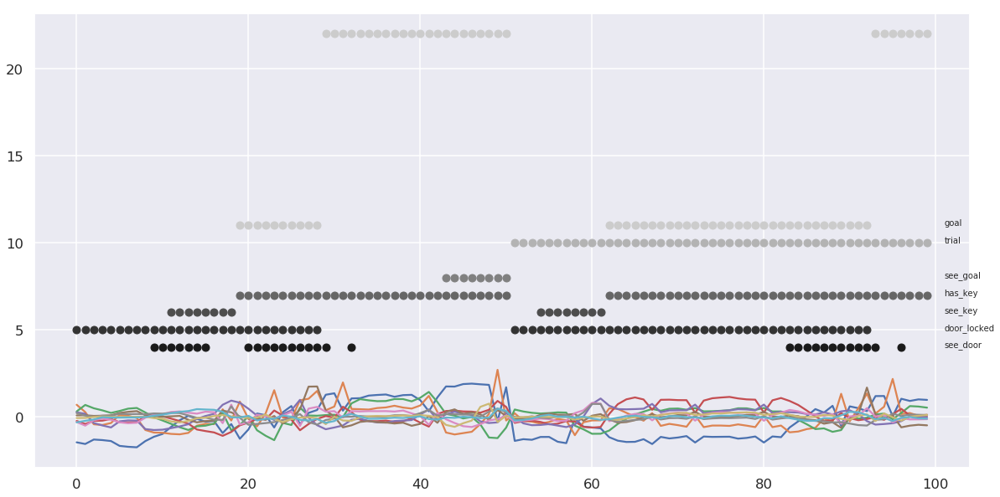

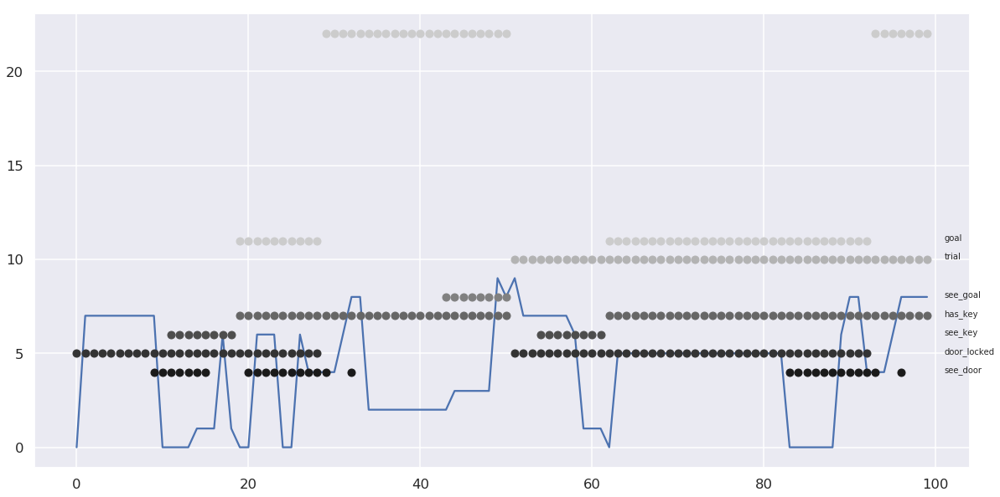

Initializing with an ARHMM using 25 steps of EM.


No handles with labels found to put in legend.


K: 10, D: 15


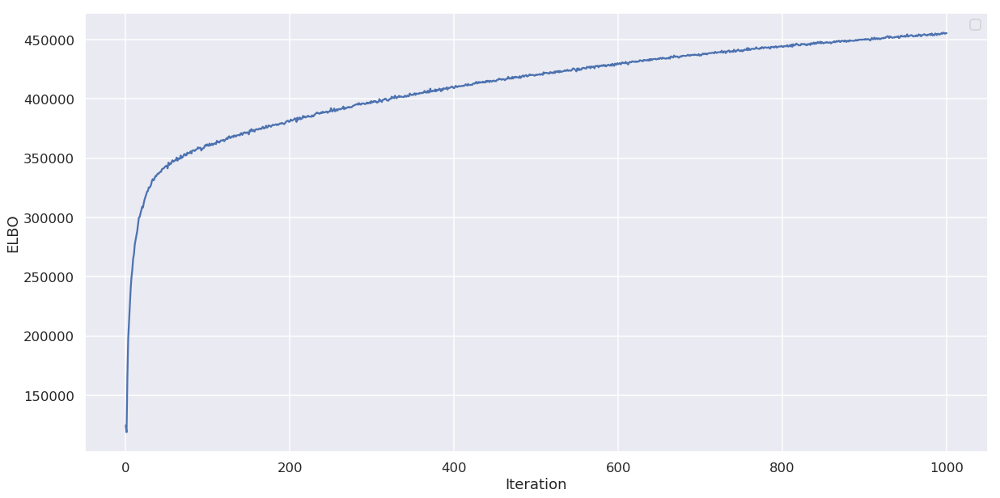

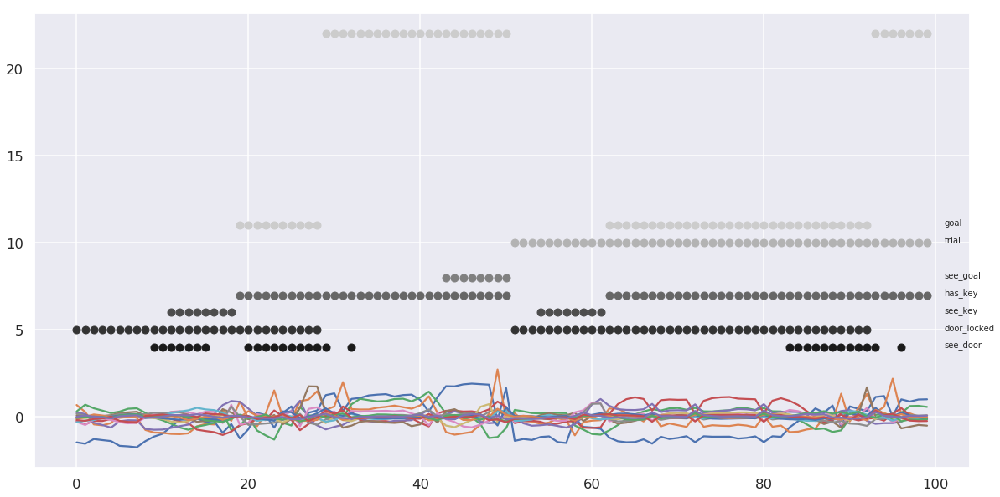

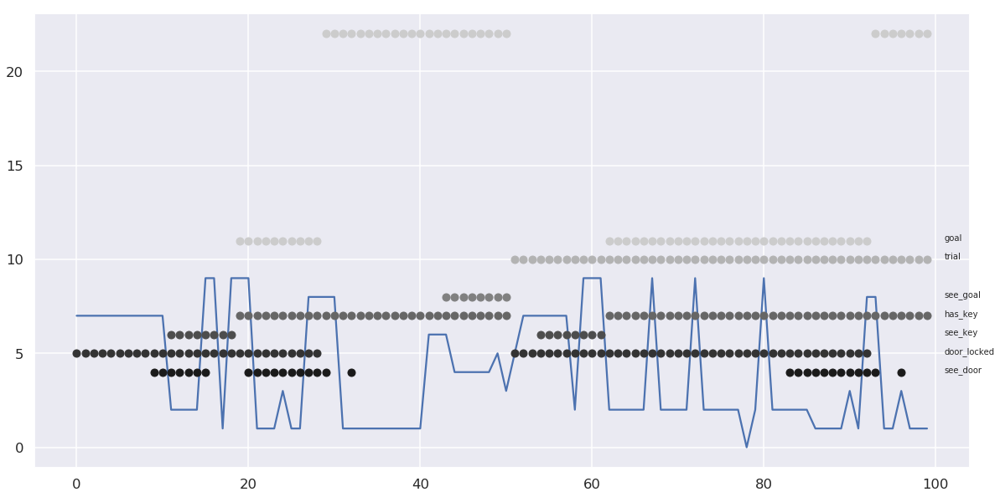

In [107]:
for K in [7,10]:
    for D_latent in [1,3,5,10,15]:
        # model parameters
        T = lstm.shape[0]
#         K = 10
        D_obs = lstm.shape[-1]
#         D_latent = 10

        # Fit a robust rSLDS with its default initialization
        rslds = ssm.SLDS(D_obs, K, D_latent,
#                      transitions="recurrent",
#                      dynamics="gaussian",
#                      emissions="gaussian",
                     single_subspace=True)

        rslds.initialize(lstm)

        # Uncomment this to fit with stochastic variational inference instead
        q_svi = SLDSTriDiagVariationalPosterior(rslds, lstm)
        elbos = rslds.fit(q_svi, lstm, method="svi", num_iters=1000, initialize=False)
        xhat = q_svi.mean[0]
        zhat = rslds.most_likely_states(xhat, lstm)

        print('K: {}, D: {}'.format(K,D_latent))
        
        # Plot some results
        plt.figure()
        plt.plot(elbos)
        plt.legend()
        plt.xlabel("Iteration")
        plt.ylabel("ELBO")
        plt.show()

        
        # and estimated trajectories
        plt.plot(xhat[:100])
        for j, key in enumerate(annotation_data.keys()):
            if ('Unnamed' in key) or ('DIR' in key):
                pass
            else:
                k = (j+3)
                x,y = get_annotations(annotation_data, 100, k, key)
                plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
                plt.text(100+1, k, key)

        plt.show()

        # and estimated state
        plt.plot(zhat[:100])
        for j, key in enumerate(annotation_data.keys()):
            if ('Unnamed' in key) or ('DIR' in key):
                pass
            else:
                k = (j+3)
                x,y = get_annotations(annotation_data, 100, k, key)
                plt.plot(x, y, linestyle='none', marker='o', color=(j/10,j/10,j/10))
                plt.text(100+1, k, key)

        plt.show()

## Scott's rSLDS ordeal

In [4]:
import os
import pickle

import autograd.numpy as np
import autograd.numpy.random as npr
npr.seed(12345)

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.font_manager import FontProperties

import seaborn as sns
color_names = ["windows blue", "red", "amber", "faded green"]
colors = sns.xkcd_palette(color_names)
sns.set_style("white")
sns.set_context("talk")

import ssm
from ssm.variational import SLDSMeanFieldVariationalPosterior, SLDSTriDiagVariationalPosterior
from ssm.util import random_rotation

In [6]:
# Global parameters
T = 10000
K = 4 
D_obs = 10
D_latent = 2 

# Helper functions for plotting results
def plot_trajectory(z, x, ax=None, ls="-"):
    zcps = np.concatenate(([0], np.where(np.diff(z))[0] + 1, [z.size]))
    if ax is None:
        fig = plt.figure(figsize=(4, 4)) 
        ax = fig.gca()
    for start, stop in zip(zcps[:-1], zcps[1:]):
        ax.plot(x[start:stop + 1, 0], 
                x[start:stop + 1, 1], 
                lw=1, ls=ls,
                color=colors[z[start] % len(colors)],
                alpha=1.0)

    return ax


def plot_most_likely_dynamics(model,
    xlim=(-4, 4), ylim=(-3, 3), nxpts=30, nypts=30,
    alpha=0.8, ax=None, figsize=(3, 3)):
    
    K = model.K
    assert model.D == 2
    x = np.linspace(*xlim, nxpts)
    y = np.linspace(*ylim, nypts)
    X, Y = np.meshgrid(x, y)
    xy = np.column_stack((X.ravel(), Y.ravel()))

    # Get the probability of each state at each xy location
    log_Ps = model.transitions.log_transition_matrices(
        xy, np.zeros((nxpts * nypts, 0)), np.ones_like(xy, dtype=bool), None)
    z = np.argmax(log_Ps[:, 0, :], axis=-1)
    z = np.concatenate([[z[0]], z]) 

    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111)

    for k, (A, b) in enumerate(zip(model.dynamics.As, model.dynamics.bs)):
        dxydt_m = xy.dot(A.T) + b - xy

        zk = z == k
        if zk.sum(0) > 0:
            ax.quiver(xy[zk, 0], xy[zk, 1],
                      dxydt_m[zk, 0], dxydt_m[zk, 1],
                      color=colors[k % len(colors)], alpha=alpha)

    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')

    plt.tight_layout()

    return ax

# Simulate the nascar data
def make_nascar_model():
    As = [random_rotation(D_latent, np.pi/24.),
      random_rotation(D_latent, np.pi/48.)]

    # Set the center points for each system
    centers = [np.array([+2.0, 0.]),
           np.array([-2.0, 0.])]
    bs = [-(A - np.eye(D_latent)).dot(center) for A, center in zip(As, centers)]

    # Add a "right" state
    As.append(np.eye(D_latent))
    bs.append(np.array([+0.1, 0.]))

    # Add a "right" state
    As.append(np.eye(D_latent))
    bs.append(np.array([-0.25, 0.]))

    # Construct multinomial regression to divvy up the space
    w1, b1 = np.array([+1.0, 0.0]), np.array([-2.0])   # x + b > 0 -> x > -b
    w2, b2 = np.array([-1.0, 0.0]), np.array([-2.0])   # -x + b > 0 -> x < b
    w3, b3 = np.array([0.0, +1.0]), np.array([0.0])    # y > 0
    w4, b4 = np.array([0.0, -1.0]), np.array([0.0])    # y < 0
    Rs = np.row_stack((100*w1, 100*w2, 10*w3,10*w4))
    r = np.concatenate((100*b1, 100*b2, 10*b3, 10*b4))

    true_rslds = ssm.SLDS(D_obs, K, D_latent,
                      transitions="recurrent_only",
                      dynamics="gaussian",
                      emissions="gaussian",
                      single_subspace=True)
    true_rslds.dynamics.mu_init = np.array([0, 1])
    true_rslds.dynamics.inv_sigma_init = np.log(1e-4) * np.ones(2)
    true_rslds.dynamics.As = np.array(As)
    true_rslds.dynamics.bs = np.array(bs)
    true_rslds.dynamics.inv_sigmas = np.log(1e-4) * np.ones((K, D_latent))

    true_rslds.transitions.Rs = Rs
    true_rslds.transitions.r = r

    true_rslds.emissions.inv_etas = np.log(1e-2) * np.ones((1, D_obs))
    return true_rslds


In [28]:
z.shape, x.shape, y.shape

((10000,), (10000, 2), (10000, 10))

In [31]:
x

array([[ 2.70181254e+00,  3.10892762e-02],
       [-1.40188266e-01, -7.56267442e-01],
       [ 8.14078552e-01, -6.42283021e-01],
       ...,
       [ 8.01291080e-01,  4.93379730e+01],
       [ 3.42120672e+00,  4.74521094e+01],
       [ 5.68428704e+00,  4.69895489e+01]])

In [9]:
# Sample from the model
true_rslds = make_nascar_model()
z, x, y = true_rslds.sample(T=T)

# Fit a robust rSLDS with its default initialization
rslds = ssm.SLDS(D_obs, K, D_latent,
             transitions="recurrent_only",
             dynamics="gaussian",
             emissions="gaussian",
             single_subspace=True)

# Initialize the model with the observed data.  It is important 
# to call this before constructing the variational posterior since
# the posterior constructor initialization looks at the rSLDS parameters.
rslds.initialize(y)

# Uncomment this to fit with stochastic variational inference instead
q_svi = SLDSTriDiagVariationalPosterior(rslds, y)
elbos = rslds.fit(q_svi, y, method="svi", num_iters=1000, initialize=False)
xhat = q_svi.mean[0]
zhat = rslds.most_likely_states(xhat, y)

# Fit with variational EM
# q_vem = SLDSTriDiagVariationalPosterior(rslds, y)
# elbos = rslds.fit(q_vem, y, method="vem", num_iters=500, initialize=False)
# xhat = q_vem.mean[0]
# zhat = rslds.most_likely_states(xhat, y)

Initializing with an ARHMM using 25 steps of EM.


KeyboardInterrupt: 

In [13]:
x

array([[ 2.70181254e+00,  3.10892762e-02],
       [-1.40188266e-01, -7.56267442e-01],
       [ 8.14078552e-01, -6.42283021e-01],
       ...,
       [ 8.01291080e-01,  4.93379730e+01],
       [ 3.42120672e+00,  4.74521094e+01],
       [ 5.68428704e+00,  4.69895489e+01]])

Initializing with an ARHMM using 25 steps of EM.


/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with message:\n{}".format(method, result.message))
/home/joeldapello/Code/ssm/ssm/optimizers.py:131: UserWarning: L-BFGS-B failed with message:
b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  warn("{} failed with m

No handles with labels found to put in legend.


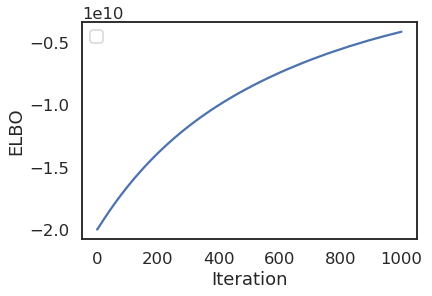

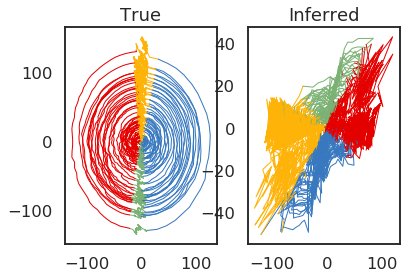

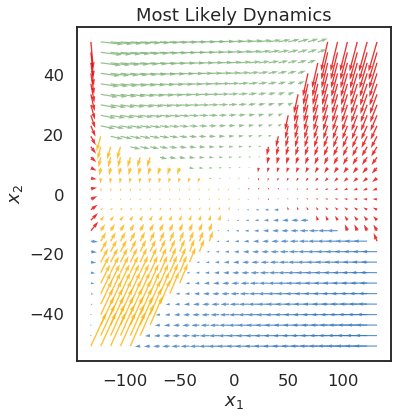

In [7]:
# Plot some results
plt.figure()
plt.plot(elbos)
plt.legend()
plt.xlabel("Iteration")
plt.ylabel("ELBO")

plt.figure()
ax1 = plt.subplot(121)
plot_trajectory(z, x, ax=ax1)
plt.title("True")
ax2 = plt.subplot(122)
plot_trajectory(zhat, xhat, ax=ax2)
plt.title("Inferred")

plt.figure(figsize=(6,6))
ax = plt.subplot(111)
lim = abs(xhat).max(axis=0) + 1
plot_most_likely_dynamics(rslds, xlim=(-lim[0], lim[0]), ylim=(-lim[1], lim[1]), ax=ax)
plt.title("Most Likely Dynamics")

plt.show()